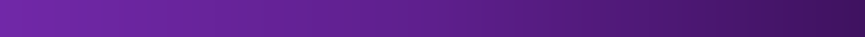


-----------------------------------------------------------------------------------------------------------------------
**-- Réalisé par** :
>   * Soufiane Eghazi 


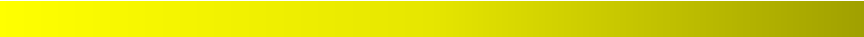


#     Comparaison des méthodes d'apprentissage automatique pour prédire des diagnostics médicaux .

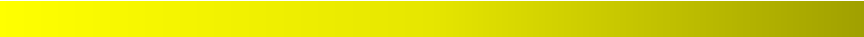

## Introduction:
    Dans ce notebook, je vais analyser des données hospitalier en utilisant différents algorithmes de prédiction du machine learning.avec évaluation de ces modèles afin de conclure et présenter les résultats à interprter.
    -----------------------------------------------------------------------------------------------------------------------

## Dataset :

   ###### Données:
        Le jeux de données contient 4751 lignes et 16 colonnes qui sont :
    'region'            : région géographique ou emplacement associé à l'échantillon médical
    'Age'               : âge du patient au moment du diagnostic
    'sexe'              : sexe du patient (masculin ou féminin)
    'Type histologique' : type histologique du cancer ou de la maladie
    'g'                 : nombre de grossesses (cette information est pertinente uniquement pour les femmes)
    'p'                 : nombre de naissances (cette information est pertinente uniquement pour les femmes)
    'menopause'         : indique si le patient a atteint la ménopause (oui/non)
    'antecedentsfamiliauxcancer' : antécédents familiaux de cancer (oui/non)
    'iode'              : indication de la consommation d'iode (oui/non)
    'penicilline'       : indication de l'utilisation de la pénicilline (oui/non)
    'penicilline.1'     : autre indication de l'utilisation de la pénicilline (oui/non)
    'tabac'             : indication de la consommation de tabac (oui/non)
    'cannabisme'        : indication de la consommation de cannabis (oui/non)
    'alcool'            : indication de la consommation d'alcool (oui/non)
    'organecode'        : codes de référence de la CIM-10 en oncologie pour décrire l'organe affecté par la maladie
    'OrganeLabel'       : description des codes d'organes de la CIM-10 en oncologie
    -----------------------------------------------------------------------------------------------------------------------


## Analyse des données avec Power BI
    Avant de commancer , j'ai créer un Dashboard en utilisant Power BI afin que je puisse bien comprendre le jeu de données et que je puisse détecter les anomalies:
    (Veuillez trouvez ci-joint le fichier Rapport_BI.pbix qui contient le Dashboard suivant
    -----------------------------------------------------------------------------------------------------------------------


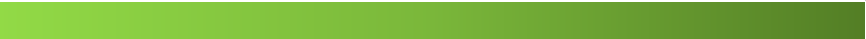

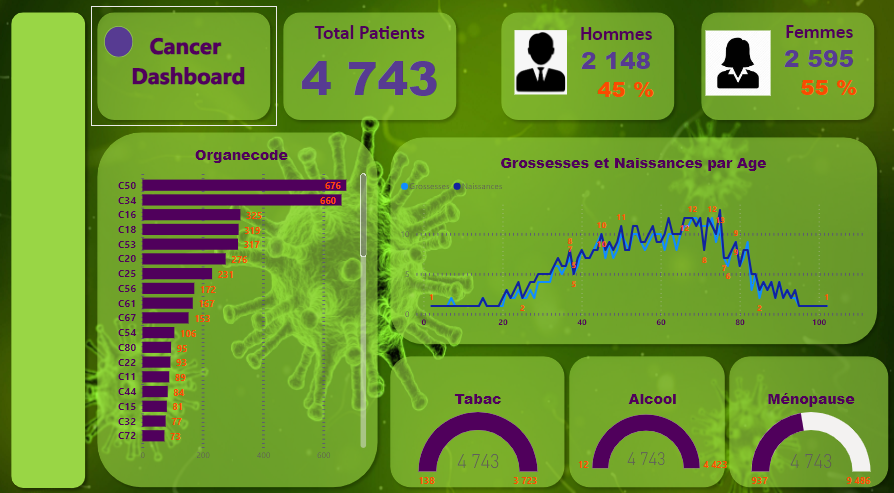

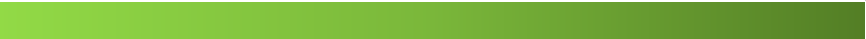


## I.Preprocessing
    Avant de commencer à construire des modèles, on doit effectuer une analyse exploratoire des données pour comprendre les données. on peut utiliser des bibliothèques Python telles que Pandas, Numpy, Seaborn et Matplotlib pour visualiser les données et effectuer des statistiques descriptives.
    -----------------------------------------------------------------------------------------------------------------------


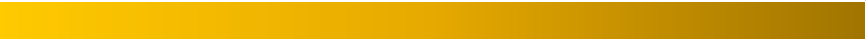

### I.1 Collecte des données
    C'est la première étape où les données sont rassemblées à partir de différentes sources, dans notre cas dans un fichier excel.
    -----------------------------------------------------------------------------------------------------------------------

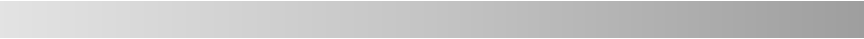

#### Importation des bibliothèques:
    Tout d'abord, on va importer les bibliothèques nécessaires pour l'analyse exploratoire des données et la construction de modèles.
    -----------------------------------------------------------------------------------------------------------------------

In [1]:
## pip install tensorflow

In [2]:
# Importation des bibliothèques nécessaires
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

#### Importer le jeu de donnée:
    Ensuite, on va lire les données et afficher les cinq premières lignes pour comprendre la structure des données.
    -----------------------------------------------------------------------------------------------------------------------

In [3]:
# Lecture des données

data = pd.read_excel("Streamlit_Application/Dataset.xlsx")

# Afficher les 5 premières lignes
data.head()


,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,iode,penicilline,penicilline.1,tabac,cannabisme,alcool,organecode,OrganeLabel
0,AUTRE,42.0,F,8500/3,NaN,NaN,NON,NON,NON,NON,NON,NON,NaN,NON,C50,C50 SEIN
1,AUTRE,49.0,F,8500/3,NaN,NaN,NaN,NaN,NON,NON,NON,NON,NaN,NON,C50,C50 SEIN
2,AUTRE,49.0,F,8520/3,3.0,3.0,NON,OUI,NON,NON,NON,NaN,NaN,NaN,C50,C50 SEIN
3,AUTRE,53.0,F,8140/3,0.0,NaN,NaN,OUI,NON,NON,NON,NON,NaN,NON,C20,C20 RECTUM
4,AUTRE,53.0,M,8240/3,NaN,NaN,NaN,NON,NON,NON,NON,SEVRE,NON,NON,C75,C75 AUTRES GLANDES ENDOCRINES ET STRUCTURES AP...


In [4]:
data.shape

(4750, 16)

### I.2 Nettoyage des données
    Il s'agit d'éliminer les données inutiles, corrompues ou redondantes. Cela peut impliquer la suppression des valeurs manquantes, la détection et la correction des erreurs de données, la normalisation des formats, etc.
    -----------------------------------------------------------------------------------------------------------------------

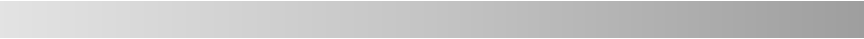

#### Informations sur le jeu de données
     On va voir les informations sur les données, notamment le nombre de colonnes, le nombre d'observations et le type de données de chaque colonne.
    -----------------------------------------------------------------------------------------------------------------------

In [5]:
# Informations et statistiques sur les données
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4750 entries, 0 to 4749
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   region                      4750 non-null   object 
 1   Age                         4747 non-null   float64
 2   sexe                        4750 non-null   object 
 3   Type histologique           4747 non-null   object 
 4   g                           1349 non-null   float64
 5   p                           1323 non-null   float64
 6   menopause                   1376 non-null   object 
 7   antecedentsfamiliauxcancer  3357 non-null   object 
 8   iode                        4284 non-null   object 
 9   penicilline                 4284 non-null   object 
 10  penicilline.1               4284 non-null   object 
 11  tabac                       3166 non-null   object 
 12  cannabisme                  1637 non-null   object 
 13  alcool                      3166 

#### suppression des colonnes inutiles 
     On va supprimer la colonne de OrganeLabel car n'apporte pas d'information pertinente pour la prédiction.
     Concernant la colonne  région ,La probabilité qu'une personne développe un cancer peut être influencée par de nombreux facteurs, dont la région géographique où elle vit peut être l'un d'entre eux.pour cela on ne va pas la supprimé!!!
    -----------------------------------------------------------------------------------------------------------------------

In [6]:
data.drop(['OrganeLabel'], axis=1, inplace=True)

#### Vérification de répudiation 
     On va vérifier les colonnes répétées ainsi que les lignes répétées afin de les supprimer.
    -----------------------------------------------------------------------------------------------------------------------

In [7]:
data.duplicated().sum()

0

In [8]:
print(data[data.duplicated()])

Empty DataFrame
Columns: [region, Age, sexe, Type histologique, g, p, menopause, antecedentsfamiliauxcancer, iode, penicilline, penicilline.1, tabac, cannabisme, alcool, organecode]
Index: []


In [9]:
if (data["penicilline"].all()==data["penicilline.1"].all()):
    print("yes")
else:
    print("no")


yes


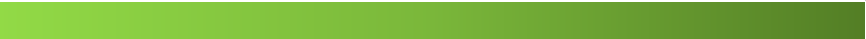

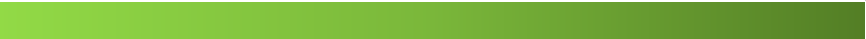

In [10]:
# Supprimer la colonne "penicilline.1"
data.drop(['penicilline.1'], axis=1, inplace=True)

#### Gestion des valeurs manquantes
     On va vérifier les valeurs manquantes.
    -----------------------------------------------------------------------------------------------------------------------

In [11]:
#vérifier les valeurs manquantes.
data.isnull().sum()

region                           0
Age                              3
sexe                             0
Type histologique                3
g                             3401
p                             3427
menopause                     3374
antecedentsfamiliauxcancer    1393
iode                           466
penicilline                    466
tabac                         1584
cannabisme                    3113
alcool                        1584
organecode                       0
dtype: int64

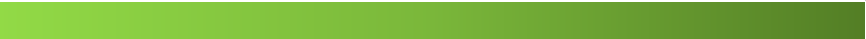

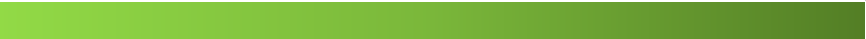

In [12]:
# Remplacez les valeurs manquantes par la moyenne pour la variable numérique age
data['Age'].fillna(data['Age'].mean(), inplace=True)
# Supprimer les lignes avec des valeurs manquantes dans la colonne 'Type histologique'
data.dropna(subset=['Type histologique'], inplace=True)

In [13]:
data.shape

(4747, 14)

In [14]:
data.head()

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,iode,penicilline,tabac,cannabisme,alcool,organecode
0,AUTRE,42.0,F,8500/3,NaN,NaN,NON,NON,NON,NON,NON,NaN,NON,C50
1,AUTRE,49.0,F,8500/3,NaN,NaN,NaN,NaN,NON,NON,NON,NaN,NON,C50
2,AUTRE,49.0,F,8520/3,3.0,3.0,NON,OUI,NON,NON,NaN,NaN,NaN,C50
3,AUTRE,53.0,F,8140/3,0.0,NaN,NaN,OUI,NON,NON,NON,NaN,NON,C20
4,AUTRE,53.0,M,8240/3,NaN,NaN,NaN,NON,NON,NON,SEVRE,NON,NON,C75


     On va vérifier les distrubtions avant et apres le nettoyage afin de visualiser les changements.
    -----------------------------------------------------------------------------------------------------------------------

###### pour la colonne Age:

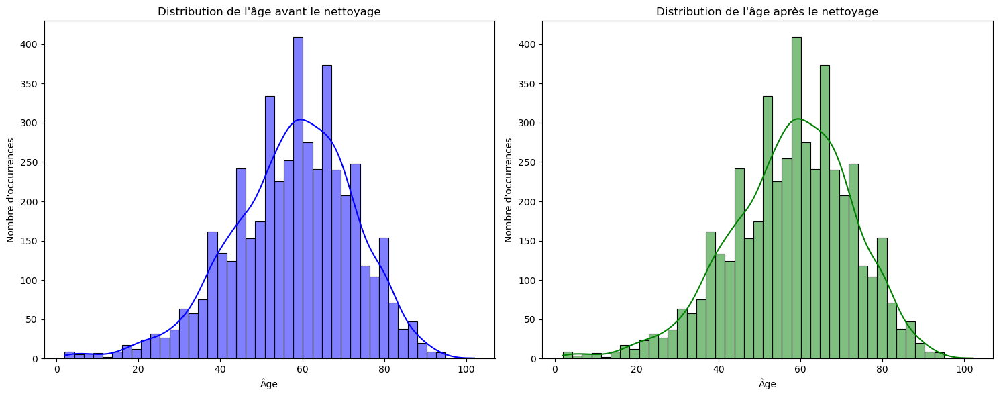

In [15]:
# Charger le jeu de données avant le nettoyage
data_before_cleaning = pd.read_excel("Streamlit_Application/Dataset.xlsx")

# Créer la figure et les axes
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Tracer le diagramme de distribution avant le nettoyage
sns.histplot(data_before_cleaning['Age'], kde=True, color='blue', ax=axes[0])
axes[0].set_title("Distribution de l'âge avant le nettoyage")
axes[0].set_xlabel('Âge')
axes[0].set_ylabel('Nombre d\'occurrences')

# Tracer le diagramme de distribution après le nettoyage
sns.histplot(data['Age'], kde=True, color='green', ax=axes[1])
axes[1].set_title("Distribution de l'âge après le nettoyage")
axes[1].set_xlabel('Âge')
axes[1].set_ylabel('Nombre d\'occurrences')

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

In [16]:
max(data['Age'])

102.0

    ce qui est logique!!!!
    -----------------------------------------------------------------------------------------------------------------------

###### pour la colonne Type histologique:

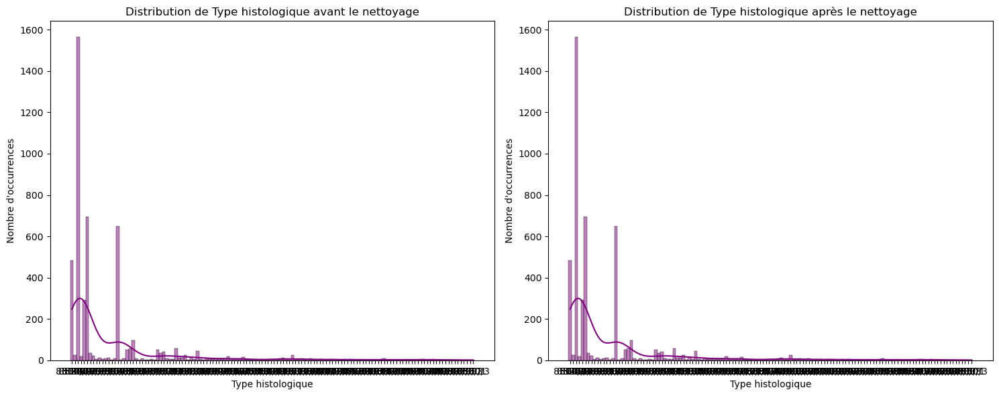

In [17]:
# Créer la figure et les axes
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Tracer le diagramme de distribution avant le nettoyage
sns.histplot(data_before_cleaning['Type histologique'], kde=True, color='purple', ax=axes[0], binwidth=30)
axes[0].set_title("Distribution de Type histologique avant le nettoyage")
axes[0].set_xlabel('Type histologique')
axes[0].set_ylabel('Nombre d\'occurrences')

# Tracer le diagramme de distribution après le nettoyage
sns.histplot(data['Type histologique'], kde=True, color='purple', ax=axes[1], binwidth=30)
axes[1].set_title("Distribution de Type histologique après le nettoyage")
axes[1].set_xlabel('Type histologique')
axes[1].set_ylabel('Nombre d\'occurrences')

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

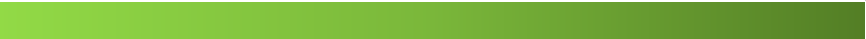

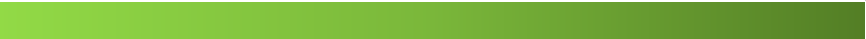

    on verifie une autre fois les valeurs manquantes pour les autres colonnes:
    -----------------------------------------------------------------------------------------------------------------------

In [18]:
data.isnull().sum()

region                           0
Age                              0
sexe                             0
Type histologique                0
g                             3398
p                             3424
menopause                     3372
antecedentsfamiliauxcancer    1391
iode                           466
penicilline                    466
tabac                         1584
cannabisme                    3110
alcool                        1584
organecode                       0
dtype: int64

     On va visualiser la répartition des femmes et les hommes car les trois colonnes 'menopause', 'p', et 'g'concernent les femmes,
     pour cela il sera utile d'avoir une idée sur la distribution de sexe!.
    -----------------------------------------------------------------------------------------------------------------------

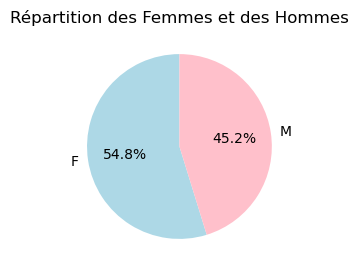

In [19]:
# Compter le nombre d'occurrences pour chaque valeur de la colonne "sexe"
sexe_counts = data["sexe"].value_counts()

# Créer le Pie Chart
plt.figure(figsize=(3, 3))
plt.pie(sexe_counts, labels=sexe_counts.index, autopct="%1.1f%%", startangle=90, colors=["lightblue", "pink"])

# Ajouter un titre
plt.title("Répartition des Femmes et des Hommes")

# Afficher le Pie Chart

plt.show()

    On va Remplacer les valeurs manquantes dans 'menopause', 'p', et 'g' par 'Masculin', 0 ,0 lorsque le sexe est 'M'
    -----------------------------------------------------------------------------------------------------------------------

In [20]:
data.loc[(data['sexe'] == 'M') & (data['menopause'].isnull()), 'menopause'] = 'Masculin'
data.loc[(data['sexe'] == 'M') & (data['p'].isnull()), 'p'] = 0
data.loc[(data['sexe'] == 'M') & (data['g'].isnull()), 'g'] = 0

In [21]:
data.isnull().sum()

region                           0
Age                              0
sexe                             0
Type histologique                0
g                             1252
p                             1278
menopause                     1226
antecedentsfamiliauxcancer    1391
iode                           466
penicilline                    466
tabac                         1584
cannabisme                    3110
alcool                        1584
organecode                       0
dtype: int64

###### pour la colonne menopause:

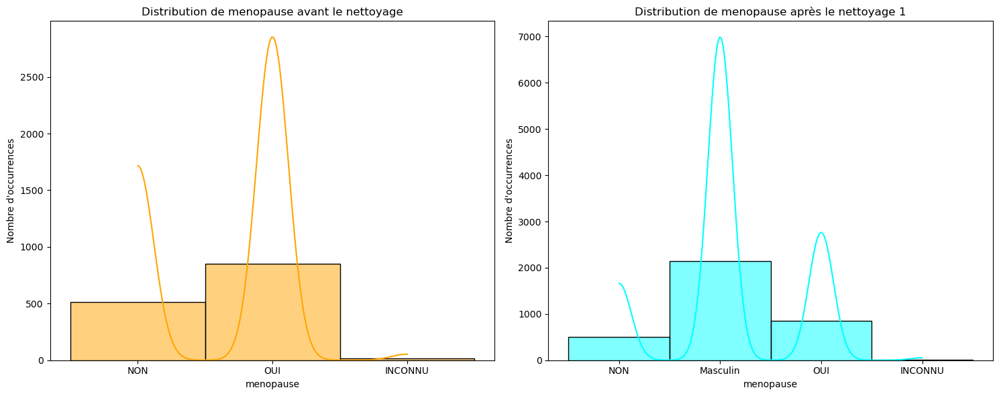

In [22]:
# Créer la figure et les axes
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Tracer le diagramme de distribution avant le nettoyage
sns.histplot(data_before_cleaning['menopause'], kde=True, color='orange', ax=axes[0], binwidth=30)
axes[0].set_title("Distribution de menopause avant le nettoyage")
axes[0].set_xlabel('menopause')
axes[0].set_ylabel('Nombre d\'occurrences')

# Tracer le diagramme de distribution après le nettoyage 1
sns.histplot(data['menopause'], kde=True, color='cyan', ax=axes[1], binwidth=30)
axes[1].set_title("Distribution de menopause après le nettoyage 1")
axes[1].set_xlabel('menopause')
axes[1].set_ylabel('Nombre d\'occurrences')

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

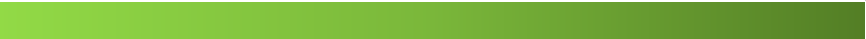

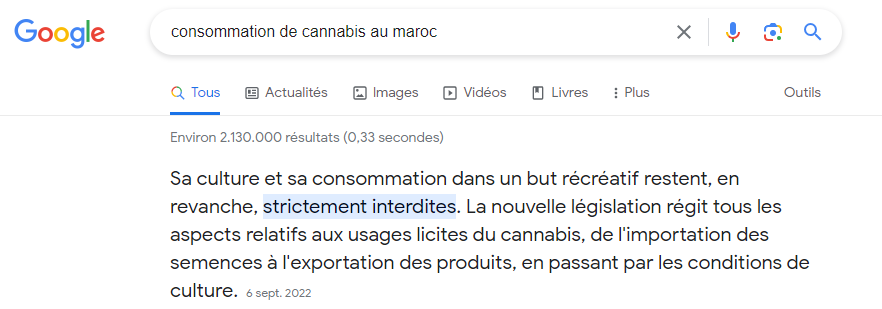

In [23]:
data.drop(['cannabisme'], axis=1, inplace=True)

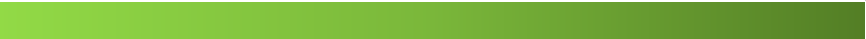

In [24]:
data.isnull().sum()

region                           0
Age                              0
sexe                             0
Type histologique                0
g                             1252
p                             1278
menopause                     1226
antecedentsfamiliauxcancer    1391
iode                           466
penicilline                    466
tabac                         1584
alcool                        1584
organecode                       0
dtype: int64

    On va visualiser la distribution des deux colonnes iode et penicilline
    -----------------------------------------------------------------------------------------------------------------------

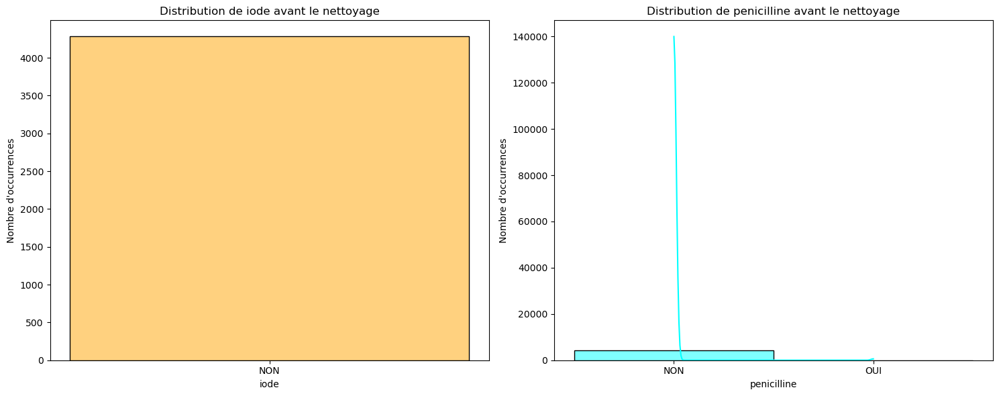

In [25]:
# Créer la figure et les axes
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Tracer le diagramme de distribution avant le nettoyage
sns.histplot(data['iode'], kde=True, color='orange', ax=axes[0], binwidth=30)
axes[0].set_title("Distribution de iode avant le nettoyage")
axes[0].set_xlabel('iode')
axes[0].set_ylabel('Nombre d\'occurrences')

# Tracer le diagramme de distribution après le nettoyage 1
sns.histplot(data['penicilline'], kde=True, color='cyan', ax=axes[1], binwidth=30)
axes[1].set_title("Distribution de penicilline avant le nettoyage")
axes[1].set_xlabel('penicilline')
axes[1].set_ylabel('Nombre d\'occurrences')

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

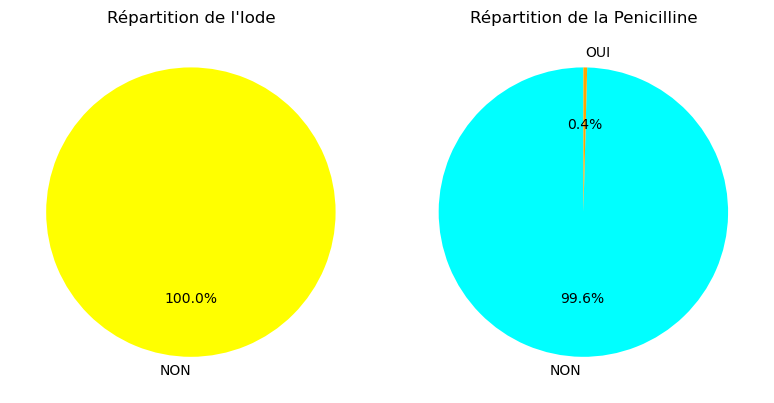

In [26]:
# Compter le nombre d'occurrences pour chaque valeur de la colonne "iode" et "penicilline"
iode_counts = data["iode"].value_counts()
penicilline_counts = data["penicilline"].value_counts()

# Créer la figure et les axes pour les deux Pie Charts
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Tracer le Pie Chart pour la colonne "iode"
axes[0].pie(iode_counts, labels=iode_counts.index, autopct="%1.1f%%", startangle=90, colors=["Yellow", "orange"])
axes[0].set_title("Répartition de l'Iode")

# Tracer le Pie Chart pour la colonne "penicilline"
axes[1].pie(penicilline_counts, labels=penicilline_counts.index, autopct="%1.1f%%", startangle=90, colors=["cyan", "orange"])
axes[1].set_title("Répartition de la Penicilline")

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

In [27]:
# Filtrer les lignes avec la valeur "OUI" dans la colonne "penicilline"
penicilline_oui = data.loc[data["penicilline"] == "OUI"]

# Afficher les lignes qui ont "OUI" dans la colonne "penicilline"
len(penicilline_oui)

18

    on ne peut pas les négliger!!!
    -----------------------------------------------------------------------------------------------------------------------

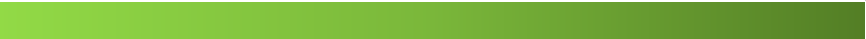

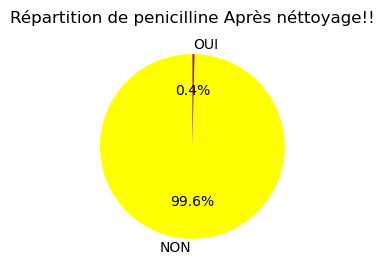

In [28]:
# Remplacez les valeurs manquantes par le mode pour la variable penicilline
data['penicilline'].fillna("NON", inplace=True)

# Compter le nombre d'occurrences pour chaque valeur de la colonne "penicilline"
penicilline_counts_1 = data['penicilline'].fillna("NON").value_counts()

# Créer le Pie Chart
plt.figure(figsize=(4, 3))
plt.pie(penicilline_counts_1, labels=penicilline_counts_1.index, autopct="%1.1f%%", startangle=90, colors=["yellow", "brown"])

# Ajouter un titre
plt.title("Répartition de penicilline Après néttoyage!!")

# Afficher le Pie Chart

plt.show()

In [29]:
data.drop(['iode'], axis=1, inplace=True)

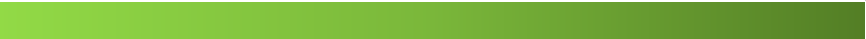

In [30]:
data.isnull().sum()

region                           0
Age                              0
sexe                             0
Type histologique                0
g                             1252
p                             1278
menopause                     1226
antecedentsfamiliauxcancer    1391
penicilline                      0
tabac                         1584
alcool                        1584
organecode                       0
dtype: int64

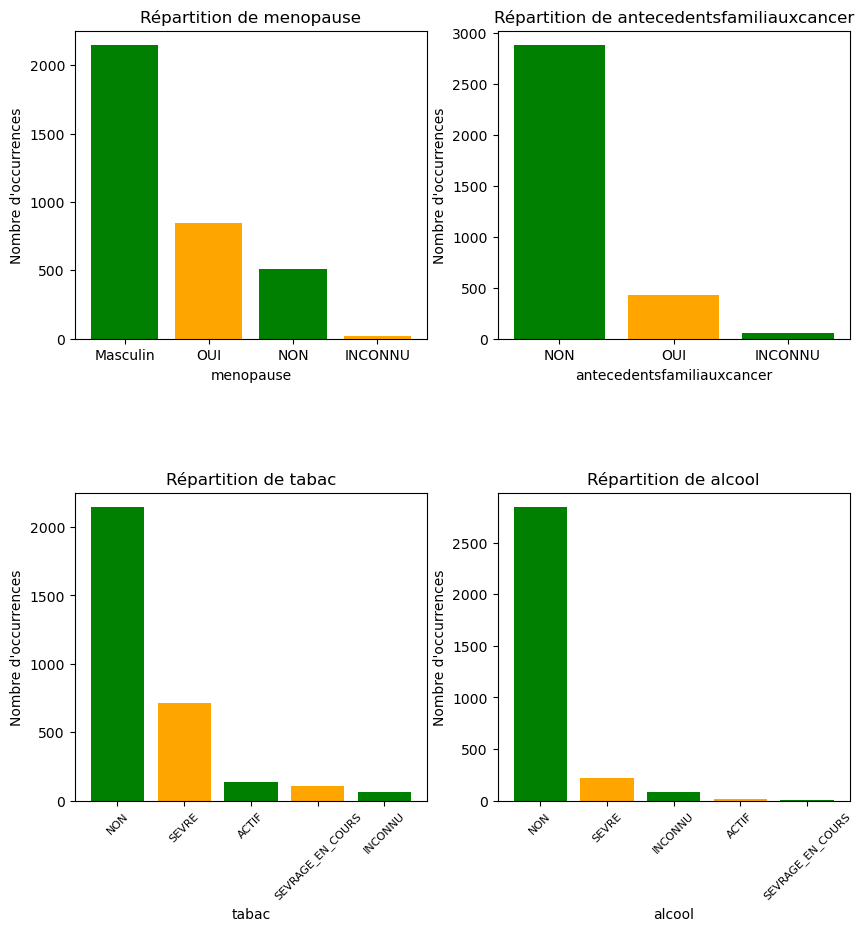

In [31]:
# Créer la figure et les axes
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Liste des noms des colonnes pour les Bar Charts
categorical_columns = ['menopause', 'antecedentsfamiliauxcancer', 'tabac', 'alcool']

# Boucle pour tracer les Bar Charts
for i, col in enumerate(categorical_columns):
    # Compter le nombre d'occurrences pour chaque valeur de la colonne
    counts = data[col].value_counts()
    
    # Tracer le Bar Chart sur l'axe correspondant
    axes[i // 2, i % 2].bar(counts.index, counts, color=["green", "orange"])
    axes[i // 2, i % 2].set_title(f"Répartition de {col}")
    axes[i // 2, i % 2].set_xlabel(col)
    axes[i // 2, i % 2].set_ylabel("Nombre d'occurrences")
    
 # Ajuster la taille de la police pour les étiquettes des axes x (xticklabels)
    if col in ['tabac', 'alcool']:
        axes[i // 2, i % 2].tick_params(axis='x', labelrotation=45, labelsize=8)  # Ajuster la taille de la police à 8
# Ajuster l'espacement vertical entre les sous-graphiques pour laisser de la place aux labels
plt.subplots_adjust(hspace=0.5)
# Afficher la figure
plt.show()

###### Remarque!
    -----------------------------------------------------------------------------------------------------------------------
                                print(0 // 2,0 % 2)---->0 0
                                print(1 // 2,1 % 2)---->0 1
                                print(2 // 2,2 % 2)---->1 0
                                print(3 // 2,3 % 2)---->1 1
    -----------------------------------------------------------------------------------------------------------------------                                

    On sait que L'âge moyen de la ménopause varie d'une femme à l'autre, mais il se situe généralement entre 45 et 55 ans.
    pour cela on doit vérifier les valeur de OUI de ménopause et leurs ages
    -----------------------------------------------------------------------------------------------------------------------

In [32]:
len(data.loc[(data['menopause'] == 'NON') & (data['Age']>55)& (data['Age']<65)])

36

In [33]:
len(data.loc[(data['menopause'] == 'NON') & (data['Age']>=65)])

27

In [34]:
data.loc[(data['menopause'] == 'NON') & (data['Age']>=65)]

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
75,Béni Mellal-Khénifra,74.0,F,8500/3,0.0,0.0,NON,NON,NON,NaN,NaN,C50
206,Casablanca-Settat,66.0,F,8000/3,1.0,1.0,NON,NON,NON,NaN,NaN,C23
223,Casablanca-Settat,68.0,F,8140/3,7.0,7.0,NON,NON,NON,NaN,NaN,C15
230,Casablanca-Settat,69.0,F,8380/3,10.0,6.0,NON,NaN,NON,NON,NON,C54
249,Casablanca-Settat,73.0,F,8000/3,7.0,7.0,NON,NON,NON,NON,NON,C18
376,Fès-Meknès,70.0,F,8000/3,4.0,4.0,NON,OUI,NON,NON,NON,C16
2896,Rabat-Salé-Kénitra,65.0,F,8140/3,NaN,NaN,NON,NON,NON,NaN,NaN,C34
2977,Rabat-Salé-Kénitra,66.0,F,8000/3,9.0,7.0,NON,NON,NON,NON,NON,C54
2985,Rabat-Salé-Kénitra,66.0,F,8140/3,2.0,2.0,NON,NaN,NON,NaN,NaN,C18
3009,Rabat-Salé-Kénitra,66.0,F,8500/3,6.0,6.0,NON,NON,NON,NaN,NaN,C50


In [35]:
data.loc[(data['menopause'] == 'OUI') & (data['Age']<=45)]

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
119,Casablanca-Settat,44.0,F,8000/3,NaN,NaN,OUI,NON,NON,NaN,NaN,C80
291,Drâa-Tafilalet,44.0,F,8500/3,0.0,0.0,OUI,NON,NON,NON,NON,C50
637,Rabat-Salé-Kénitra,31.0,F,8000/3,1.0,1.0,OUI,OUI,NON,NaN,NaN,C50
726,Rabat-Salé-Kénitra,35.0,F,8500/3,2.0,1.0,OUI,NON,NON,NON,NON,C50
779,Rabat-Salé-Kénitra,37.0,F,8140/3,5.0,5.0,OUI,NON,NON,NaN,NaN,C20
921,Rabat-Salé-Kénitra,40.0,F,8500/3,NaN,NaN,OUI,NON,NON,NON,NON,C50
949,Rabat-Salé-Kénitra,41.0,F,8000/3,0.0,0.0,OUI,NON,NON,NaN,NaN,C50
965,Rabat-Salé-Kénitra,41.0,F,8140/3,2.0,2.0,OUI,NaN,NON,NON,NON,C18
1005,Rabat-Salé-Kénitra,42.0,F,8140/3,4.0,4.0,OUI,NON,NON,NaN,NaN,C16
1048,Rabat-Salé-Kénitra,43.0,F,8020/3,4.0,3.0,OUI,NON,NON,NON,NON,C11


In [36]:
len(data.loc[(data['menopause'] == 'OUI') & (data['Age']<=45)])

26

    on remarque que 26 observation qui montre des femmes qui ont moin de 45 ans est ayant ménopause , et puisque la valeur minimale de l'age dans ces observation est 30 , on ne peut pas les considérée comme des erreurs car il existe des cas spéciale
    
    dans l'autre coté , 27 femmes qui ont plus de 65 ans et qui n'ont pas ménopause, ce qui très loin d'être possible même 65 reste très rare !! pour cela on va remplacer les valeurs de NON par OUI pour ces cas
    -----------------------------------------------------------------------------------------------------------------------

In [37]:
data.loc[(data['Age'] >=65) & (data['menopause']=='NON'), 'menopause'] = 'OUI'

In [38]:
len(data.loc[(data['menopause'] == 'NON') & (data['Age']>=65)])

0

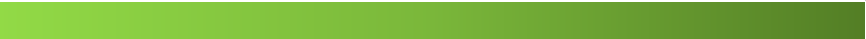

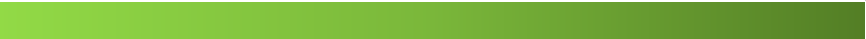

     Traitement des valeurs manquantes pour les colonnes catégorielles

In [39]:
for col in categorical_columns:
    if col == 'menopause':
        # Remplacer les valeurs vides par "OUI" si l'âge est supérieur à 55, sinon par "NON"
        data[col].fillna(data.apply(lambda row: 'OUI' if row['Age'] > 55 else 'NON', axis=1), inplace=True)
    else:
        mode_value = data[col].mode().iloc[0]  # Obtenir le mode
        data[col].fillna(mode_value, inplace=True)  # Remplacer par le mode

    Répartition des colonnes catégorielles apres le Traitement des valeurs manquantes

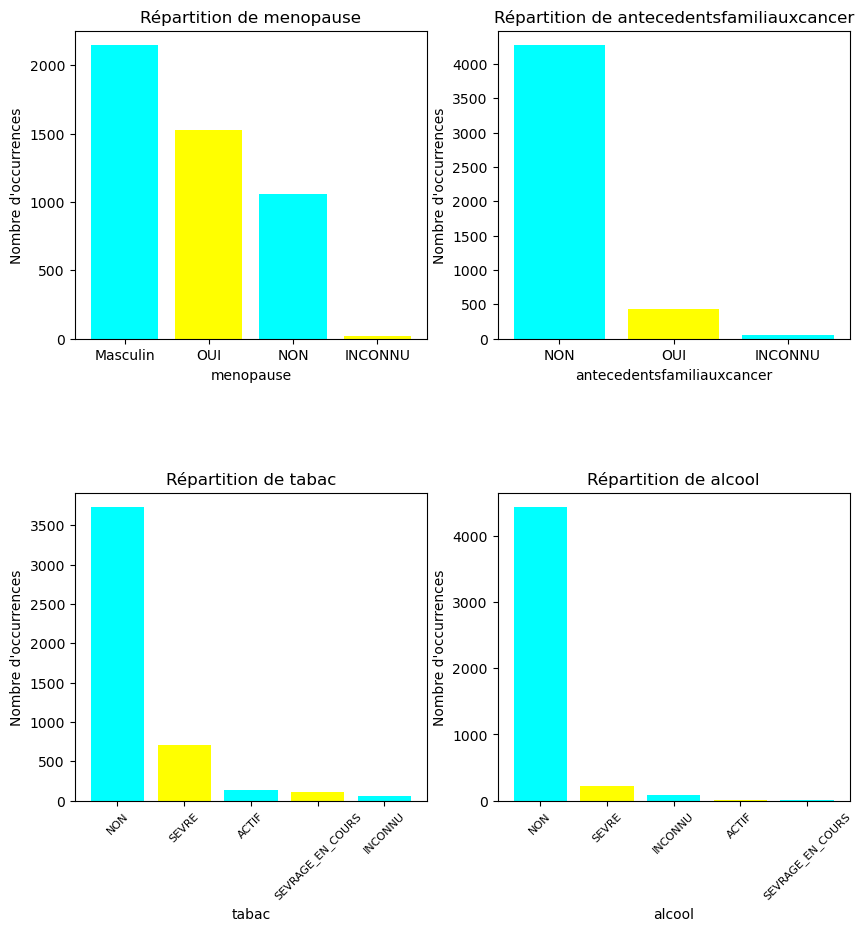

In [40]:
# Créer la figure et les axes
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Liste des noms des colonnes pour les Bar Charts
categorical_columns = ['menopause', 'antecedentsfamiliauxcancer', 'tabac', 'alcool']

# Boucle pour tracer les Bar Charts
for i, col in enumerate(categorical_columns):
    # Compter le nombre d'occurrences pour chaque valeur de la colonne
    counts = data[col].value_counts()
    
    # Tracer le Bar Chart sur l'axe correspondant
    axes[i // 2, i % 2].bar(counts.index, counts, color=["cyan", "yellow"])
    axes[i // 2, i % 2].set_title(f"Répartition de {col}")
    axes[i // 2, i % 2].set_xlabel(col)
    axes[i // 2, i % 2].set_ylabel("Nombre d'occurrences")
    
 # Ajuster la taille de la police pour les étiquettes des axes x (xticklabels)
    if col in ['tabac', 'alcool']:
        axes[i // 2, i % 2].tick_params(axis='x', labelrotation=45, labelsize=8)  # Ajuster la taille de la police à 8
# Ajuster l'espacement vertical entre les sous-graphiques pour laisser de la place aux labels
plt.subplots_adjust(hspace=0.5)
# Afficher la figure
plt.show()

    Distribution de menopause après le nettoyage 2

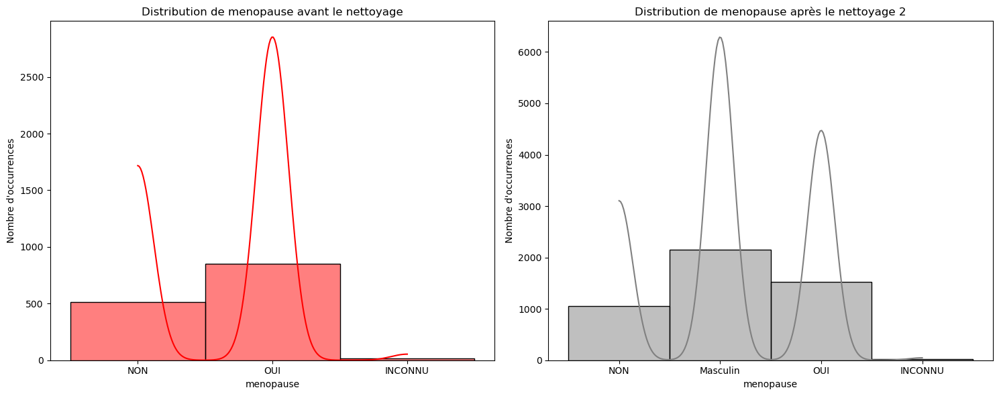

In [41]:
# Créer la figure et les axes
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Tracer le diagramme de distribution avant le nettoyage
sns.histplot(data_before_cleaning['menopause'], kde=True, color='red', ax=axes[0], binwidth=30)
axes[0].set_title("Distribution de menopause avant le nettoyage")
axes[0].set_xlabel('menopause')
axes[0].set_ylabel('Nombre d\'occurrences')

# Tracer le diagramme de distribution après le nettoyage 1
sns.histplot(data['menopause'], kde=True, color='gray', ax=axes[1], binwidth=30)
axes[1].set_title("Distribution de menopause après le nettoyage 2")
axes[1].set_xlabel('menopause')
axes[1].set_ylabel('Nombre d\'occurrences')

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

In [42]:
data.isnull().sum()

region                           0
Age                              0
sexe                             0
Type histologique                0
g                             1252
p                             1278
menopause                        0
antecedentsfamiliauxcancer       0
penicilline                      0
tabac                            0
alcool                           0
organecode                       0
dtype: int64

#### Gestion des Erreurs!
     On va vérifier les valeurs numériques qui restent qui sont g et p.
    -----------------------------------------------------------------------------------------------------------------------

In [43]:
max(data['g'])

nan

In [44]:
g_serie = data['g'].value_counts()
print(g_serie)

0.0          2404
3.0           186
2.0           164
4.0           162
1.0           113
6.0           108
5.0           104
7.0            82
8.0            55
10.0           41
9.0            37
11.0           16
12.0            6
13.0            5
14.0            3
223522.0        1
15.0            1
705.0           1
16.0            1
19.0            1
39.0            1
55.0            1
7777777.0       1
17.0            1
Name: g, dtype: int64


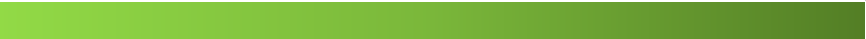

In [45]:
data.loc[data["g"] == 39.0]

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
3794,Rabat-Salé-Kénitra,77.0,F,8470/2,39.0,27.0,OUI,OUI,NON,NON,NON,C56


In [46]:
data.loc[data["g"] == 55.0]

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
3468,Rabat-Salé-Kénitra,71.0,F,8500/3,55.0,NaN,OUI,NON,NON,NON,NON,C50


In [47]:
data.loc[data["g"] == 7777777.0]

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
2693,Rabat-Salé-Kénitra,63.0,F,8140/3,7777777.0,44.0,OUI,NON,NON,NON,NON,C25


In [48]:
data.loc[data["g"] == 705.0]

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
4446,Tanger-Tetouan-Al Hoceima,55.0,F,8000/3,705.0,6.0,NON,NON,NON,NON,NON,C50


In [49]:
data.loc[data["g"] == 223522.0]

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
4216,Tanger-Tetouan-Al Hoceima,32.0,F,8500/3,223522.0,1.0,NON,NON,NON,NON,NON,C50


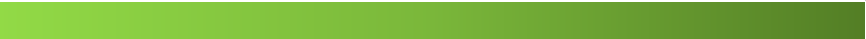

In [50]:
data.shape

(4747, 12)

    On va Supprimer les lignes où la valeur de 'g' est strictement supérieure à 39.0
    -----------------------------------------------------------------------------------------------------------------------

In [51]:
# Liste des index des lignes à supprimer
index_to_drop = [3468, 2693, 4446, 4216]

# Supprimer les lignes avec les index spécifiés
data.drop(index_to_drop, inplace=True)

     -----------------------------------------------------------------------------------------------------------------------
        data = data.loc[data["g"] < 55.0] ce code permet de supprimer tous les valeurs qui sont <50 et les valeurs vides!!
        ce qui n'est pas bon dans notre cas !! pour cela on a supprimer ces elements par indices
     -----------------------------------------------------------------------------------------------------------------------

In [52]:
data.shape

(4743, 12)

In [53]:
p_serie = data["p"].value_counts()
print(p_serie)

0.0     2395
3.0      189
2.0      179
4.0      148
1.0      131
5.0      118
6.0       96
7.0       77
8.0       57
9.0       31
10.0      24
11.0       8
12.0       6
13.0       3
14.0       2
20.0       1
27.0       1
Name: p, dtype: int64


In [54]:
data.loc[data["p"] == 27.0]

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
3794,Rabat-Salé-Kénitra,77.0,F,8470/2,39.0,27.0,OUI,OUI,NON,NON,NON,C56


In [55]:
data.loc[data["p"] == 20.0]

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
250,Casablanca-Settat,73.0,F,8070/3,19.0,20.0,OUI,NON,NON,NON,NON,C21


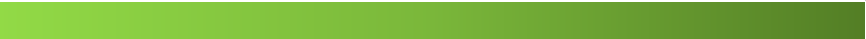

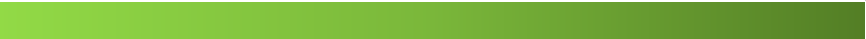

    Distribution des naissances et grocesses avant le nettoyage

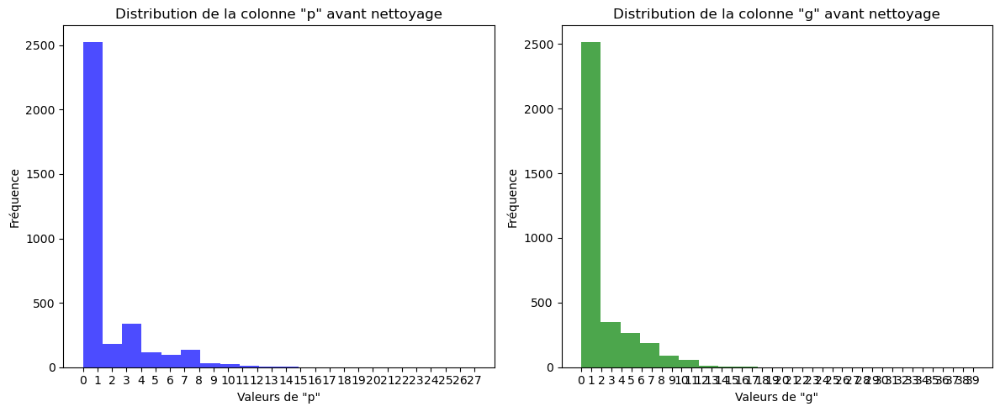

In [56]:
# Créer la figure et les axes
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Tracer l'histogramme pour la colonne 'p'
axes[0].hist(data['p'], bins=20, color='blue', alpha=0.7)
axes[0].set_title('Distribution de la colonne "p" avant nettoyage')
axes[0].set_xlabel('Valeurs de "p"')
axes[0].set_ylabel('Fréquence')
axes[0].set_xticks(range(0, int(data['p'].max())+1, 1))  # Ajouter les marqueurs avec un pas de 5
# Tracer l'histogramme pour la colonne 'g'
axes[1].hist(data['g'], bins=20, color='green', alpha=0.7)
axes[1].set_title('Distribution de la colonne "g" avant nettoyage')
axes[1].set_xlabel('Valeurs de "g"')
axes[1].set_ylabel('Fréquence')
axes[1].set_xticks(range(0, int(data['g'].max())+1, 1))  # Ajouter les marqueurs avec un pas de 5

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher les histogrammes
plt.show()

    -----------------------------------------------------------------------------------------------------------------------
     Maintenant qu'on a corriger les erreur, On va remplacez les valeurs manquantes par la moyenne. car les valeurs de 0 comporte la portion des hommes aussi
     -----------------------------------------------------------------------------------------------------------------------

In [57]:
# Traitement des valeurs manquantes pour les colonnes numériques 'g' et 'p'
data['g'].fillna(int(data['g'].mean()), inplace=True)  # Remplacer par la moyenne
data['p'].fillna(int(data['p'].mean()), inplace=True)  # Remplacer par la moyenne


In [58]:
data.isnull().sum()

region                        0
Age                           0
sexe                          0
Type histologique             0
g                             0
p                             0
menopause                     0
antecedentsfamiliauxcancer    0
penicilline                   0
tabac                         0
alcool                        0
organecode                    0
dtype: int64

    Distribution des naissances et grocesses après le nettoyage

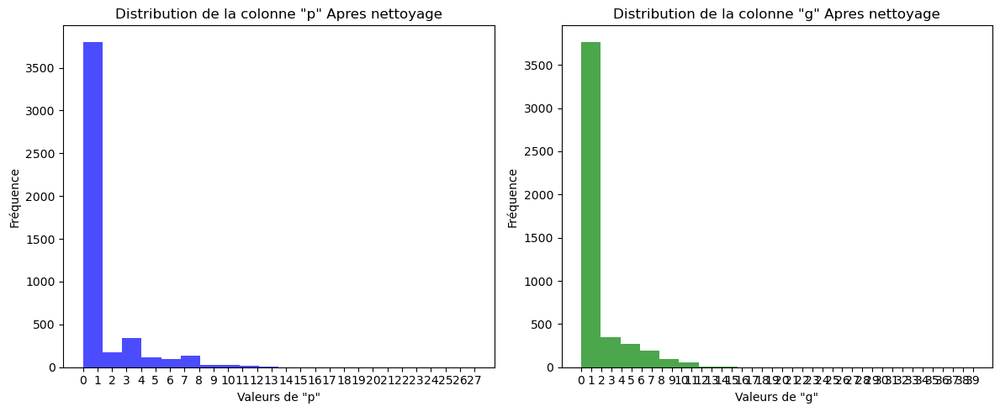

In [59]:
# Créer la figure et les axes
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Tracer l'histogramme pour la colonne 'p'
axes[0].hist(data['p'], bins=20, color='blue', alpha=0.7)
axes[0].set_title('Distribution de la colonne "p" Apres nettoyage')
axes[0].set_xlabel('Valeurs de "p"')
axes[0].set_ylabel('Fréquence')
axes[0].set_xticks(range(0, int(data['p'].max())+1, 1))  # Ajouter les marqueurs avec un pas de 5
# Tracer l'histogramme pour la colonne 'g'
axes[1].hist(data['g'], bins=20, color='green', alpha=0.7)
axes[1].set_title('Distribution de la colonne "g" Apres nettoyage')
axes[1].set_xlabel('Valeurs de "g"')
axes[1].set_ylabel('Fréquence')
axes[1].set_xticks(range(0, int(data['g'].max())+1, 1))  # Ajouter les marqueurs avec un pas de 5
# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher les histogrammes
plt.show()

    visualisation des colonnes numérique:

<Axes: title={'center': 'Box Plot'}>

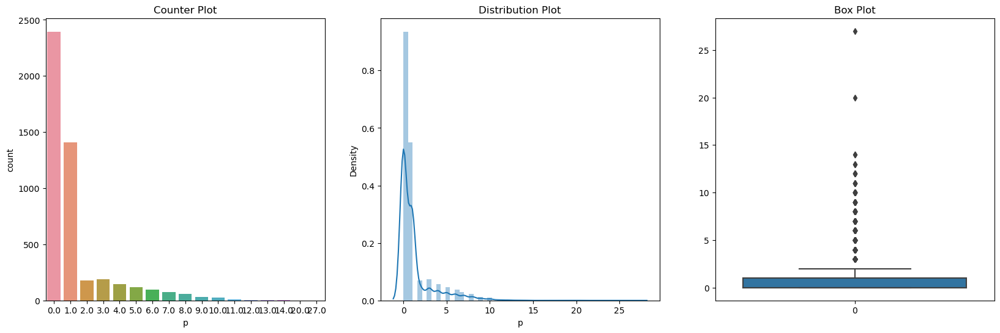

In [60]:
plt.figure(figsize=(20,6))

plt.subplot(1,3,1)
plt.title('Counter Plot')
sns.countplot(x='p',data=data)

plt.subplot(1,3,2)
plt.title('Distribution Plot')
sns.distplot(data['p'])

plt.subplot(1,3,3)
plt.title('Box Plot')
sns.boxplot(data['p'])

<Axes: title={'center': 'Box Plot'}>

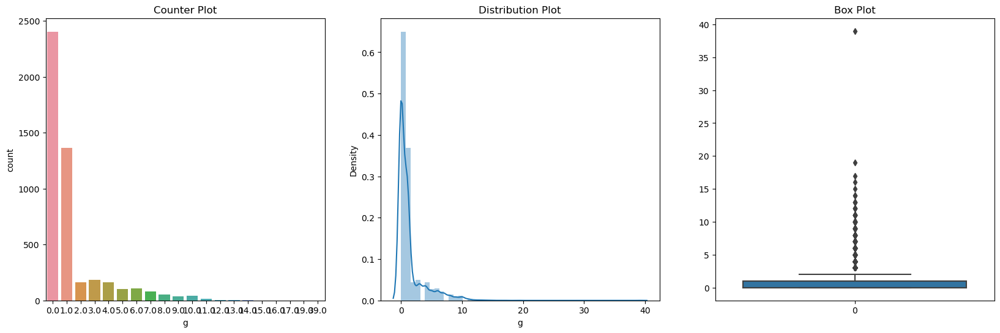

In [61]:
plt.figure(figsize=(20,6))

plt.subplot(1,3,1)
plt.title('Counter Plot')
sns.countplot(x='g',data=data)

plt.subplot(1,3,2)
plt.title('Distribution Plot')
sns.distplot(data['g'])

plt.subplot(1,3,3)
plt.title('Box Plot')
sns.boxplot(data['g'])

<Axes: title={'center': 'Box Plot'}>

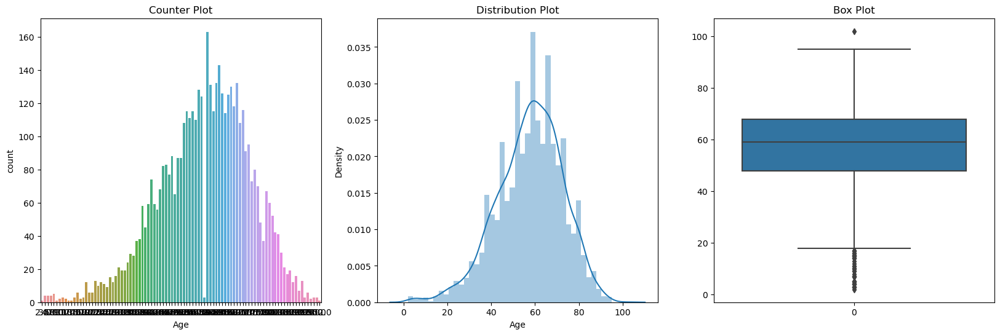

In [62]:
plt.figure(figsize=(20,6))

plt.subplot(1,3,1)
plt.title('Counter Plot')
sns.countplot(x='Age',data=data)

plt.subplot(1,3,2)
plt.title('Distribution Plot')
sns.distplot(data['Age'])

plt.subplot(1,3,3)
plt.title('Box Plot')
sns.boxplot(data['Age'])

In [63]:
# Statistiques descriptives
data.describe()

,Age,g,p
count,4743.000000,4743.000000,4743.000000
mean,57.732685,1.325111,1.239511
std,14.896439,2.340062,2.129502
min,2.000000,0.000000,0.000000
25%,48.000000,0.000000,0.000000
50%,59.000000,0.000000,0.000000
75%,68.000000,1.000000,1.000000
max,102.000000,39.000000,27.000000


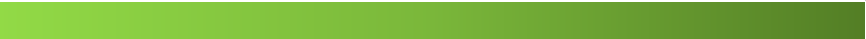

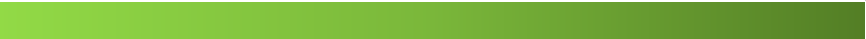

In [64]:
data.columns

Index(['region', 'Age', 'sexe', 'Type histologique', 'g', 'p', 'menopause',
       'antecedentsfamiliauxcancer', 'penicilline', 'tabac', 'alcool',
       'organecode'],
      dtype='object')

### I.3 Normalisation 
     Il s'agit de mettre les données à l'échelle pour qu'elles aient une plage commune. Cela peut inclure la mise à l'échelle des variables numériques pour qu'elles aient une moyenne de zéro et une variance de un, ou l'utilisation de techniques telles que la normalisation min-max. .
    -----------------------------------------------------------------------------------------------------------------------

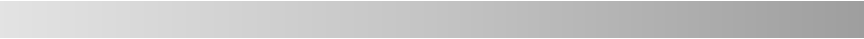

In [65]:
from sklearn.preprocessing import MinMaxScaler
# Appliquer la normalisation min-max aux colonnes numériques
numerical_columns = ['Age', 'p', 'g']
scaler = MinMaxScaler()
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])

In [66]:
data.describe()

,Age,g,p
count,4743.000000,4743.000000,4743.000000
mean,0.557327,0.033977,0.045908
std,0.148964,0.060002,0.078870
min,0.000000,0.000000,0.000000
25%,0.460000,0.000000,0.000000
50%,0.570000,0.000000,0.000000
75%,0.660000,0.025641,0.037037
max,1.000000,1.000000,1.000000


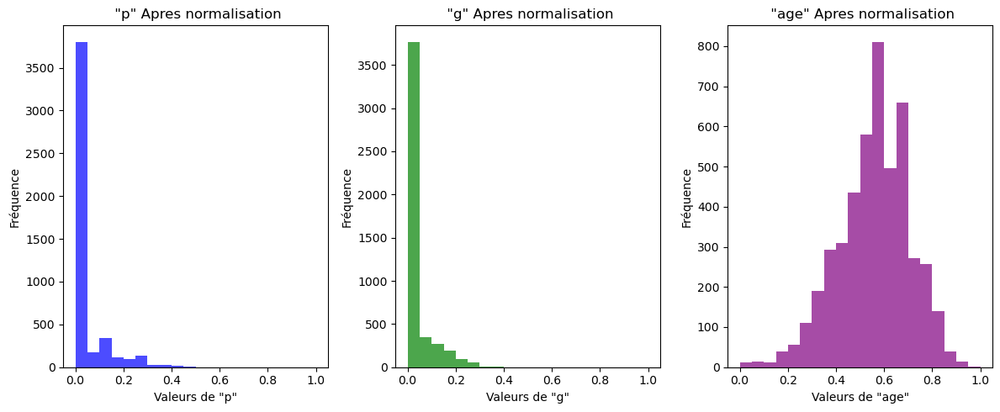

In [67]:
# Créer la figure et les axes
fig, axes = plt.subplots(1, 3, figsize=(12, 5))

# Tracer l'histogramme pour la colonne 'p'
axes[0].hist(data['p'], bins=20, color='blue', alpha=0.7)
axes[0].set_title(' "p" Apres normalisation')
axes[0].set_xlabel('Valeurs de "p"')
axes[0].set_ylabel('Fréquence')

# Tracer l'histogramme pour la colonne 'g'
axes[1].hist(data['g'], bins=20, color='green', alpha=0.7)
axes[1].set_title(' "g" Apres normalisation')
axes[1].set_xlabel('Valeurs de "g"')
axes[1].set_ylabel('Fréquence')

# Tracer l'histogramme pour la colonne 'age'
axes[2].hist(data['Age'], bins=20, color='purple', alpha=0.7)
axes[2].set_title(' "age" Apres normalisation')
axes[2].set_xlabel('Valeurs de "age"')
axes[2].set_ylabel('Fréquence')
# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher les histogrammes
plt.show()

    visualisation des colonnes numérique apres normalisation:

<Axes: title={'center': 'Box Plot'}>

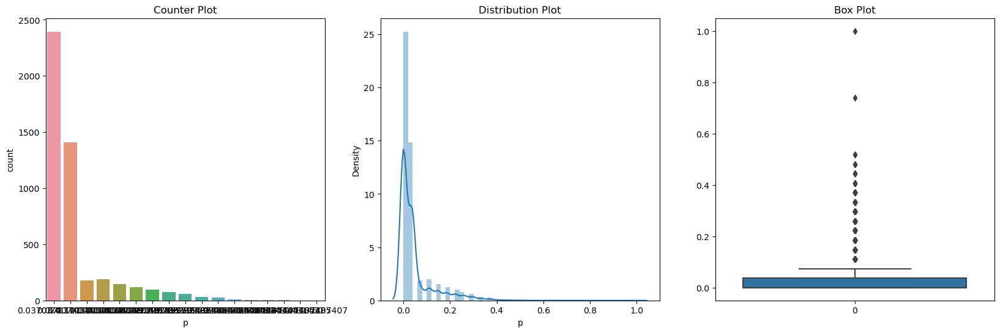

In [68]:
plt.figure(figsize=(20,6))

plt.subplot(1,3,1)
plt.title('Counter Plot')
sns.countplot(x='p',data=data)

plt.subplot(1,3,2)
plt.title('Distribution Plot')
sns.distplot(data['p'])

plt.subplot(1,3,3)
plt.title('Box Plot')
sns.boxplot(data['p'])

<Axes: title={'center': 'Box Plot'}>

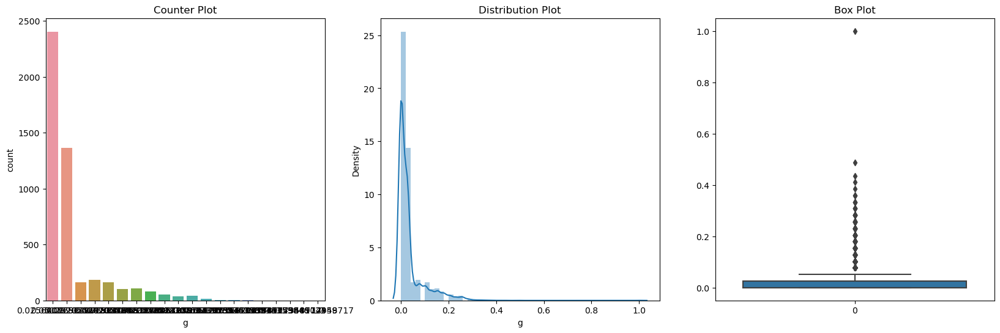

In [69]:
plt.figure(figsize=(20,6))

plt.subplot(1,3,1)
plt.title('Counter Plot')
sns.countplot(x='g',data=data)

plt.subplot(1,3,2)
plt.title('Distribution Plot')
sns.distplot(data['g'])

plt.subplot(1,3,3)
plt.title('Box Plot')
sns.boxplot(data['g'])

<Axes: title={'center': 'Box Plot'}>

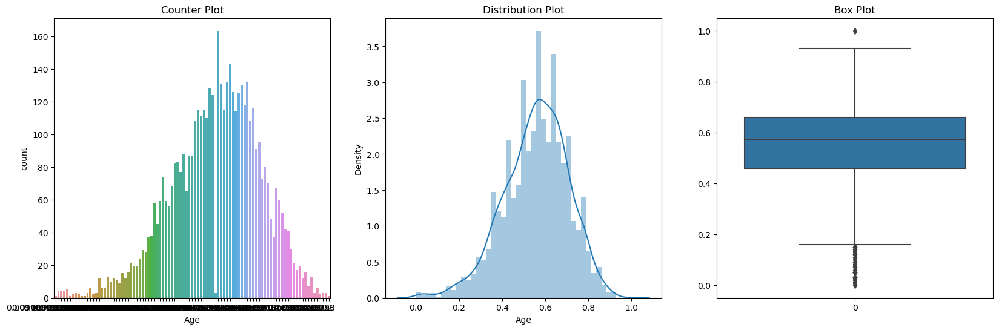

In [70]:
plt.figure(figsize=(20,6))

plt.subplot(1,3,1)
plt.title('Counter Plot')
sns.countplot(x='Age',data=data)

plt.subplot(1,3,2)
plt.title('Distribution Plot')
sns.distplot(data['Age'])

plt.subplot(1,3,3)
plt.title('Box Plot')
sns.boxplot(data['Age'])

### I.4 Réduction du bruit
    Parfois, les données peuvent contenir des valeurs aberrantes (outliers) ou du bruit qui peuvent affecter les performances des modèles. La détection et la gestion des outliers peuvent être effectuées à cette étape.
    -----------------------------------------------------------------------------------------------------------------------

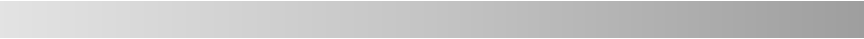

<Axes: >

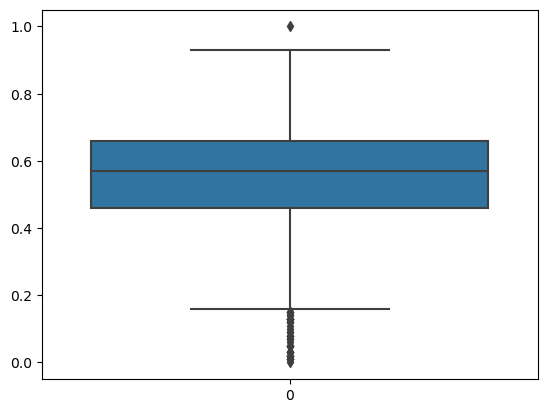

In [71]:
sns.boxplot(data.Age)

<Axes: >

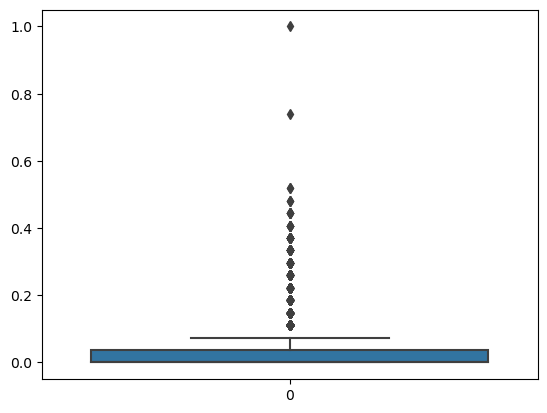

In [72]:
sns.boxplot(data.p)

<Axes: >

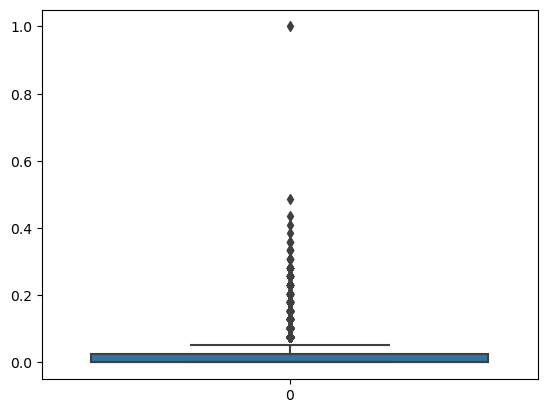

In [73]:
sns.boxplot(data.g)

In [74]:
# Détection et gestion des outliers pour les variables numériques
def remove_outliers(column):
    Q1 = np.percentile(column, 25)
    Q3 = np.percentile(column, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    column[column < lower_bound] = lower_bound
    column[column > upper_bound] = upper_bound
    return column

for col in numerical_columns:
    data[col] = remove_outliers(data[col])


In [75]:
# Afficher les statistiques après la normalisation et la gestion des outliers
data.describe()

,Age,g,p
count,4743.000000,4743.000000,4743.000000
mean,0.558063,0.020100,0.028647
std,0.146656,0.024042,0.034198
min,0.160000,0.000000,0.000000
25%,0.460000,0.000000,0.000000
50%,0.570000,0.000000,0.000000
75%,0.660000,0.025641,0.037037
max,0.960000,0.064103,0.092593


In [76]:
data.shape

(4743, 12)

### I.5 Encodage des données
    Si les données contiennent des caractéristiques catégorielles, elles doivent être encodées en une forme numérique pour être utilisées par les modèles. Cela peut impliquer l'utilisation d'encodage one-hot, d'encodage ordinal, etc.
    -----------------------------------------------------------------------------------------------------------------------

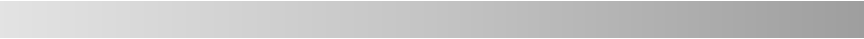

In [77]:
from sklearn.preprocessing import LabelEncoder
# Créer un objet LabelEncoder pour chaque colonne catégorielle
label_encoders = {}
for col in ['region','sexe','Type histologique', 'menopause', 'antecedentsfamiliauxcancer', 'penicilline', 'tabac', 'alcool']:
    label_encoder = LabelEncoder()
    data[col] = label_encoder.fit_transform(data[col])
    label_encoders[col] = label_encoder



# Afficher la signification de chaque valeur numérique après l'encodage
for col, label_encoder in label_encoders.items():
    print(f"\nColonne : {col}")
    for value, encoded_value in zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)):
        print(f"{value} : {encoded_value}")


Colonne : region
AUTRE : 0
Béni Mellal-Khénifra : 1
Casablanca-Settat : 2
Drâa-Tafilalet : 3
Eddakhla-Oued Eddahab : 4
Fès-Meknès : 5
Guelmim-Oued Noun : 6
Laayoune-Sakia El Hamra : 7
Marrakech-Safi : 8
Oriental : 9
Rabat : 10
Rabat-Salé-Kénitra : 11
Souss-Massa : 12
Tanger-Tetouan-Al Hoceima : 13

Colonne : sexe
F : 0
M : 1

Colonne : Type histologique
8000/1 : 0
8000/3 : 1
8003/3 : 2
8005/0 : 3
8012/3 : 4
8013/3 : 5
8020/3 : 6
8041/3 : 7
8046/3 : 8
8051/3 : 9
8052/3 : 10
8070/2 : 11
8070/3 : 12
8071/2 : 13
8071/3 : 14
8076/3 : 15
8077/0 : 16
8077/2 : 17
8081/2 : 18
8082/3 : 19
8090/3 : 20
8140/2 : 21
8140/3 : 22
8147/3 : 23
8160/3 : 24
8170/3 : 25
8200/3 : 26
8201/3 : 27
8211/3 : 28
8221/1 : 29
8240/3 : 30
8244/3 : 31
8246/3 : 32
8260/3 : 33
8263/3 : 34
8312/3 : 35
8316/3 : 36
8317/3 : 37
8318/3 : 38
8319/3 : 39
8330/1 : 40
8330/3 : 41
8370/3 : 42
8380/1 : 43
8380/3 : 44
8384/4 : 45
8430/3 : 46
8442/1 : 47
8460/3 : 48
8470/2 : 49
8470/3 : 50
8472/1 : 51
8474/3 : 52
8480/3 : 53
8490/

In [78]:
data.head()

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
0,0,0.40,0,56,0.025641,0.037037,2,1,0,2,2,C50
1,0,0.47,0,56,0.025641,0.037037,2,1,0,2,2,C50
2,0,0.47,0,61,0.064103,0.092593,2,2,0,2,2,C50
3,0,0.51,0,22,0.000000,0.037037,2,2,0,2,2,C20
4,0,0.51,1,30,0.000000,0.000000,1,1,0,4,2,C75


### I.6 Gestion des données déséquilibrées
    Si les classes ou les étiquettes dans les données sont déséquilibrées, des techniques telles que la sur-échantillonnage (oversampling) ou la sous-échantillonnage (undersampling) peuvent être utilisées pour équilibrer les classes.
    -----------------------------------------------------------------------------------------------------------------------

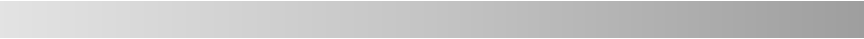

#### Fréquence des catégories:
    Maintenant on visualise les fréquences de chaque catégorie.

    -----------------------------------------------------------------------------------------------------------------------

In [79]:
organecode_serie = data["organecode"].value_counts()
print(organecode_serie)

C50    676
C34    660
C16    326
C18    319
C53    317
C20    276
C25    231
C56    172
C61    167
C67    153
C54    106
C80     95
C22     93
C11     89
C44     84
C15     81
C32     77
C72     73
C77     69
C23     64
C49     57
C64     51
C24     46
C48     42
C51     37
C71     34
C41     33
C14     32
C62     30
C21     28
C17     26
C73     23
C40     22
C10     15
C08     15
C02     15
C31     12
C00     12
C69      9
C13      8
C52      8
C74      8
C01      7
C42      7
C75      5
C19      5
C30      4
C38      3
C26      3
C07      3
C05      2
C04      2
C47      2
C39      2
C12      2
C76      2
C65      1
C03      1
C37      1
Name: organecode, dtype: int64


In [80]:
codes = data["organecode"].unique().tolist()
print(codes)

['C50', 'C20', 'C75', 'C34', 'C14', 'C18', 'C22', 'C54', 'C16', 'C74', 'C71', 'C64', 'C53', 'C23', 'C77', 'C48', 'C25', 'C15', 'C44', 'C11', 'C67', 'C51', 'C61', 'C32', 'C62', 'C08', 'C26', 'C56', 'C80', 'C17', 'C07', 'C72', 'C00', 'C41', 'C49', 'C21', 'C12', 'C24', 'C02', 'C73', 'C31', 'C30', 'C19', 'C40', 'C69', 'C47', 'C38', 'C37', 'C39', 'C01', 'C52', 'C13', 'C42', 'C10', 'C65', 'C03', 'C05', 'C04', 'C76']


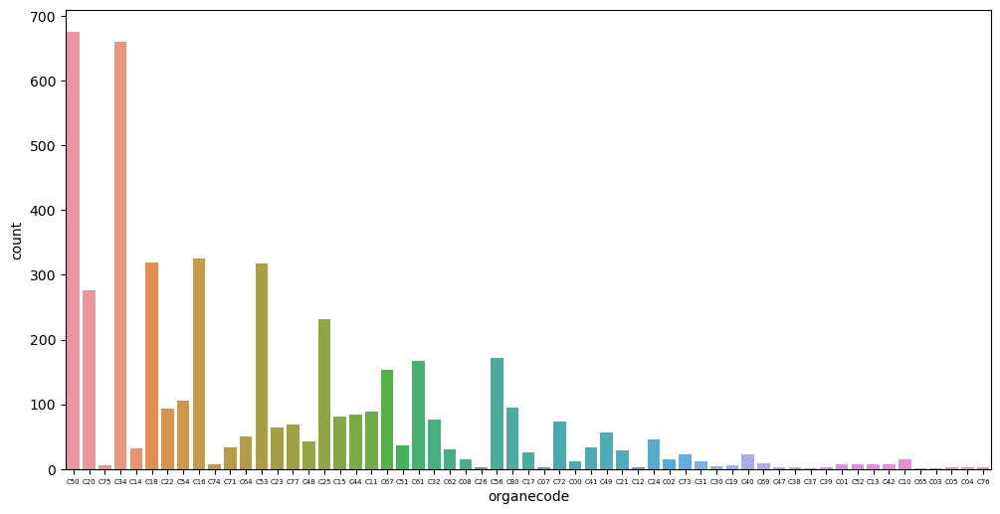

In [81]:
# Créer un graphique des barres
plt.figure(figsize=(12, 6))
ax=sns.countplot(x='organecode', data=data)
ax.set_xticklabels(codes,fontsize=5)
plt.show()

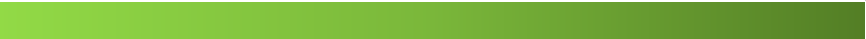

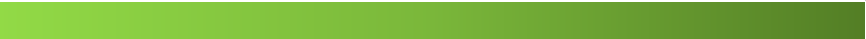

####  Séparer les caractéristiques (X) et la variable cible (y):
        Maintenant on va Séparer les caractéristiques (X) et la variable cible (y).

    -----------------------------------------------------------------------------------------------------------------------

In [82]:
X = data.drop(['organecode'], axis=1)
y = data['organecode']


####  Oversampling aléatoire:
        Maintenant on va faire oversampling on utilisant RandomOverSampler .

    -----------------------------------------------------------------------------------------------------------------------

In [83]:
from imblearn.over_sampling import RandomOverSampler

# Utiliser RandomOverSampler pour réaliser le sur-échantillonnage
oversampler = RandomOverSampler(random_state=42)
X_oversampler, y_oversampler = oversampler.fit_resample(X, y)

# Réassembler les données sous forme de DataFrame pandas
data_over = pd.concat([pd.DataFrame(X_oversampler, columns=X.columns), pd.Series(y_oversampler, name='organecode')], axis=1)
data_over

,region,Age,sexe,Type histologique,g,p,menopause,antecedentsfamiliauxcancer,penicilline,tabac,alcool,organecode
0,0,0.40,0,56,0.025641,0.037037,2,1,0,2,2,C50
1,0,0.47,0,56,0.025641,0.037037,2,1,0,2,2,C50
2,0,0.47,0,61,0.064103,0.092593,2,2,0,2,2,C50
3,0,0.51,0,22,0.000000,0.037037,2,2,0,2,2,C20
4,0,0.51,1,30,0.000000,0.000000,1,1,0,4,2,C75
...,...,...,...,...,...,...,...,...,...,...,...,...
39879,2,0.61,0,1,0.025641,0.037037,3,1,0,2,2,C80
39880,11,0.72,0,1,0.025641,0.037037,3,1,0,2,2,C80
39881,11,0.77,1,1,0.000000,0.000000,1,1,0,2,2,C80
39882,11,0.48,1,1,0.000000,0.000000,1,1,0,4,4,C80


In [84]:
data_over.shape

(39884, 12)

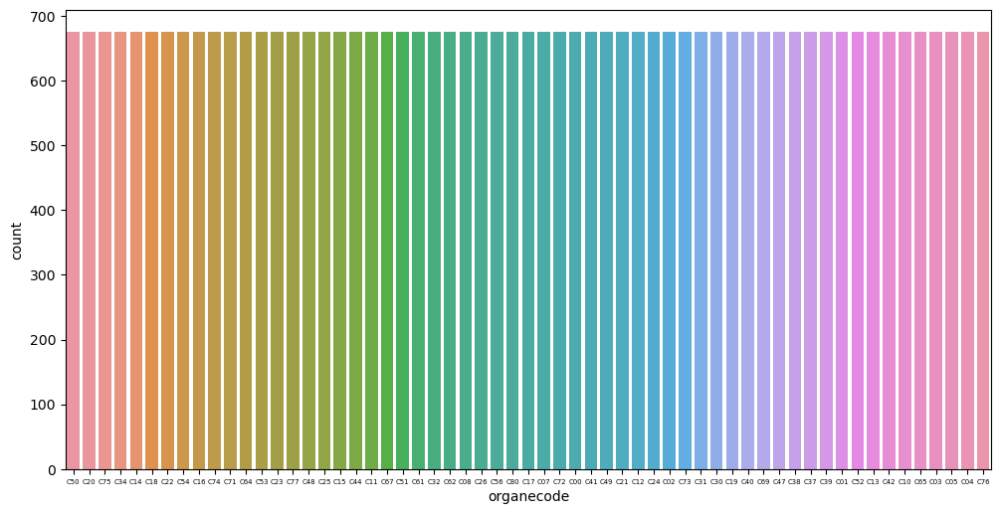

In [85]:
over_organecode_serie = data_over["organecode"].value_counts()
over_codes = data_over["organecode"].unique().tolist()
# Créer un graphique des barres
plt.figure(figsize=(12, 6))
ax=sns.countplot(x='organecode', data=data_over)
ax.set_xticklabels(over_codes,fontsize=5)
plt.show()

####  Séparer les caractéristiques (X) et la variable cible (y) Après sur-échantillonnage:
        Maintenant on va Séparer les caractéristiques (X) et la variable cible (y) Apres sur-échantillonnage.

    -----------------------------------------------------------------------------------------------------------------------

In [86]:
X_over = data_over.drop('organecode', axis=1)
y_over = data_over['organecode']

### I.7 Extraction des fonctionnalités (feature extraction)
    Il s'agit de sélectionner les caractéristiques ou les variables pertinentes pour l'analyse et la modélisation. Cela peut inclure des techniques telles que l'analyse en composantes principales (PCA) pour les données continue, la sélection de variables basée sur des mesures de corrélation, etc.
    -----------------------------------------------------------------------------------------------------------------------

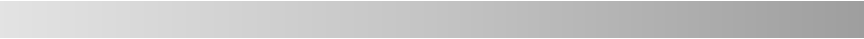

###### Corrélations de Pearson:
    On va  calculer la corrélation entre chaque paire de colonnes et afficher la matrice de corrélation sous forme de carte de chaleur

    -----------------------------------------------------------------------------------------------------------------------

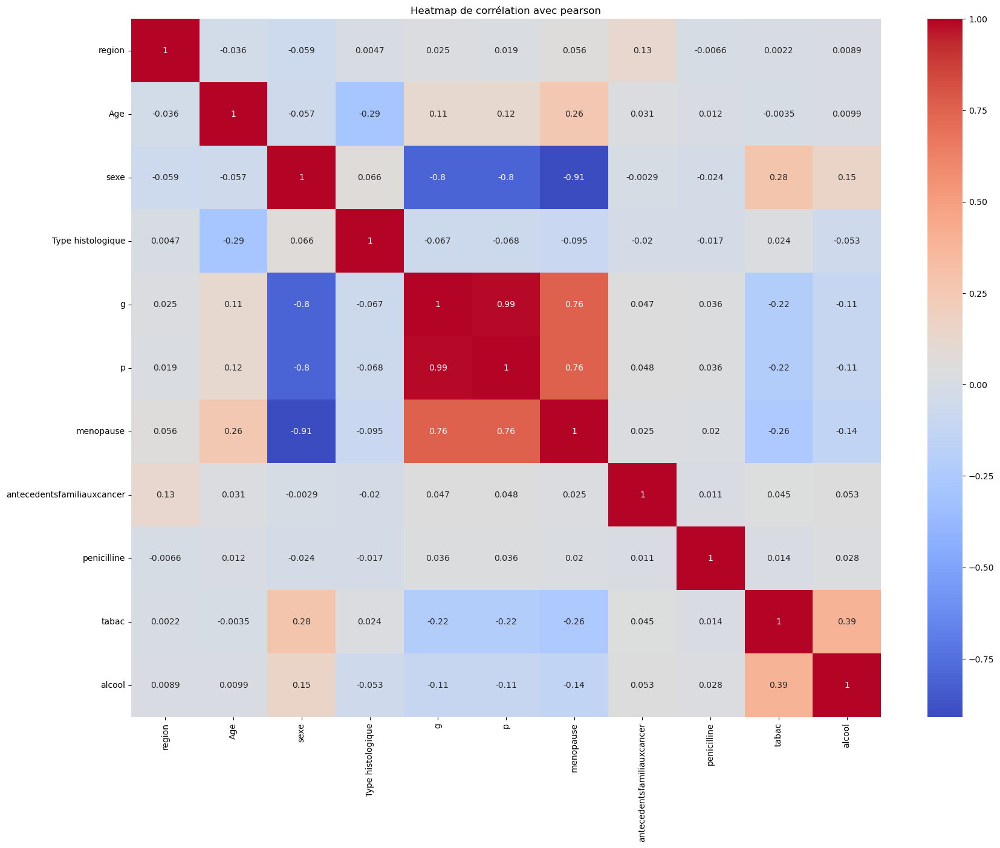

In [87]:
# Matrice de corrélation
corr = data_over.corr()
# Afficher la carte de chaleur
fig, ax = plt.subplots(figsize=(20, 15))
sns.heatmap(corr, annot=True, cmap='coolwarm', ax=ax)
ax.set_title("Heatmap de corrélation avec pearson")
plt.show()


######  coefficient de Spearman
    Pour analyser la corrélation entre une variable qualitative catégorielle et plusieurs variables quantitatives , on va utiliser le corefficient de Spearman .
    -----------------------------------------------------------------------------------------------------------------------

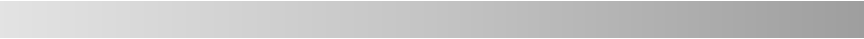

In [88]:
from scipy.stats import spearmanr

for col in data_over.columns:
    if col != 'organecode':
        corr, pvalue = spearmanr(data_over[col], data_over['organecode'])
        print(col,"| : ","Spearman_Corr: ", corr,"|  P-value: ", pvalue)
        print("---------------------------------------------------------------------------------------------------------------")
    

region | :  Spearman_Corr:  0.09367480046436774 |  P-value:  1.9941566047573596e-78
---------------------------------------------------------------------------------------------------------------
Age | :  Spearman_Corr:  -0.2053574976152261 |  P-value:  0.0
---------------------------------------------------------------------------------------------------------------
sexe | :  Spearman_Corr:  -0.033805828614793025 |  P-value:  1.4474568903099894e-11
---------------------------------------------------------------------------------------------------------------
Type histologique | :  Spearman_Corr:  0.08066146871110581 |  P-value:  1.4557364593187015e-58
---------------------------------------------------------------------------------------------------------------
g | :  Spearman_Corr:  0.04060540374429722 |  P-value:  4.963450783926704e-16
---------------------------------------------------------------------------------------------------------------
p | :  Spearman_Corr:  0.036271507994

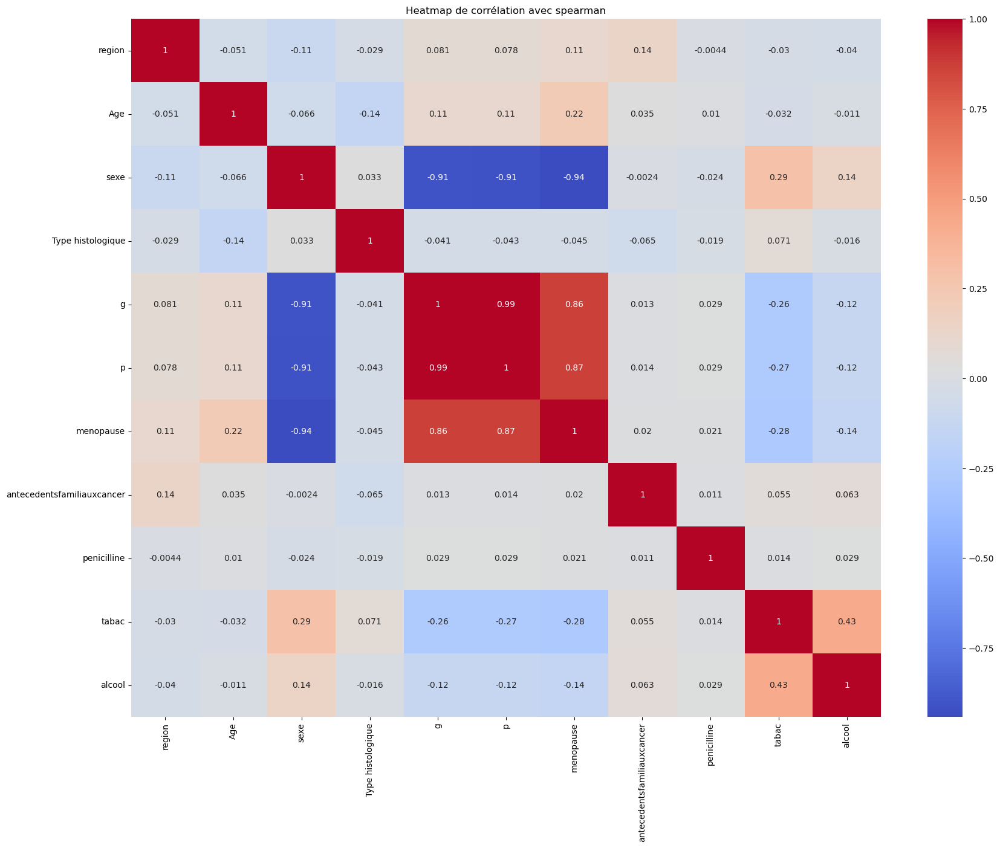

In [89]:
# Matrice de corrélation
corr = data_over.corr(method = "spearman")
# Afficher la carte de chaleur
fig, ax = plt.subplots(figsize=(20, 15))
sns.heatmap(corr, annot=True, cmap='coolwarm', ax=ax)
ax.set_title("Heatmap de corrélation avec spearman")
plt.show()

In [90]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif, chi2

numeric_columns = ['g', 'p','Age']
categorical_columns = ['region',  'sexe', 'Type histologique', 'menopause', 'antecedentsfamiliauxcancer', 'penicilline', 'tabac', 'alcool']
X_numeric = X_over[numeric_columns]
X_categorical = X_over[categorical_columns]

selector_numeric = SelectKBest(score_func=mutual_info_classif, k=2)
selector_categorical = SelectKBest(score_func=chi2, k=5)

X_numeric_selected = selector_numeric.fit_transform(X_numeric, y_over)
X_categorical_selected = selector_categorical.fit_transform(X_categorical, y_over)

numeric_selected_indices = selector_numeric.get_support(indices=True)
categorical_selected_indices = selector_categorical.get_support(indices=True)

numeric_selected_columns = X_numeric.columns[numeric_selected_indices]
categorical_selected_columns = X_categorical.columns[categorical_selected_indices]


In [91]:
numeric_selected_columns

Index(['g', 'p'], dtype='object')

In [92]:
categorical_selected_columns

Index(['region', 'sexe', 'Type histologique', 'menopause', 'tabac'], dtype='object')

In [93]:
X_over_selected= data_over.drop(['Age','alcool','penicilline','antecedentsfamiliauxcancer','organecode'], axis=1)

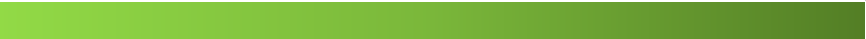

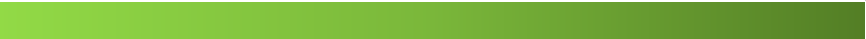

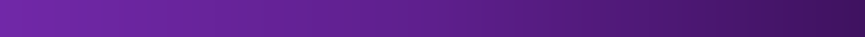

## II.Modèles de classification  :
    Maintenant on va  utiliser une variété d'algorithmes de classification .
    -----------------------------------------------------------------------------------------------------------------------

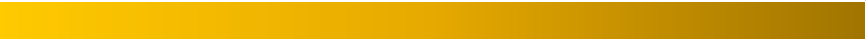

####  Division du jeu de données :
    On va diviser les données en ensembles de formation et de test
    -----------------------------------------------------------------------------------------------------------------------

###### -------------------------------------------------Feature selection 1

In [94]:
from sklearn.model_selection import train_test_split
#ceci est pour tous les colonnes 
X_all_train, X_all_test, Y_all_train, Y_all_test = train_test_split(X_over, y_over, test_size=0.3, random_state=42)


In [95]:
print(len(X_all_train),'-----',len(Y_all_train))
print(len(X_all_test),'-----',len(Y_all_test))

27918 ----- 27918
11966 ----- 11966


###### -------------------------------------------------Feature selection 2

In [96]:
#ceci est pour les 7 colonnes selectionnés:
X_train, X_test, Y_train, Y_test = train_test_split(X_over_selected, y_over, test_size=0.3, random_state=42)

In [97]:
print(len(X_train),'-----',len(Y_train))
print(len(X_test),'-----',len(Y_test))

27918 ----- 27918
11966 ----- 11966


## II.1.  Algorithmes de ML supérvisé:
    On va commencer par les méthodes de ML supérvise de classification on créant les modèles de classifications
    -----------------------------------------------------------------------------------------------------------------------

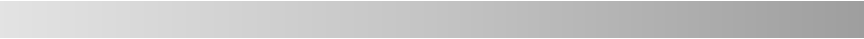

### II. 1 .1. Entrainement  : 
    On va créer différents modèle de machine learning afin de comparer leurs performances aprés ,
    -----------------------------------------------------------------------------------------------------------------------

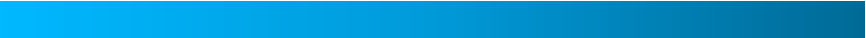

#####  Pour feature selection 1:
   
    -----------------------------------------------------------------------------------------------------------------------

In [98]:
#KNN

from sklearn.neighbors import KNeighborsClassifier
model_1_all = KNeighborsClassifier(n_neighbors=3)
model_1_all.fit(X_all_train, Y_all_train)
Y_predec_model_1_all =model_1_all.predict(X_all_test)
Y_predec_model_1_all_train =model_1_all.predict(X_all_train)


In [99]:
# Arbre de décision

from sklearn.tree import DecisionTreeClassifier
model_2_all = DecisionTreeClassifier(max_depth=10,random_state=42)
model_2_all.fit(X_all_train, Y_all_train)
Y_predec_model_2_all =model_2_all.predict(X_all_test)
Y_predec_model_2_all_train =model_2_all.predict(X_all_train)

In [100]:
# Régression logistique

from sklearn.linear_model import LogisticRegression
model_3_all = LogisticRegression(C=0.1,random_state=42)
model_3_all.fit(X_all_train, Y_all_train)
Y_predec_model_3_all =model_3_all.predict(X_all_test)
Y_predec_model_3_all_train =model_3_all.predict(X_all_train)

In [101]:
# Forêt aléatoire

from sklearn.ensemble import RandomForestClassifier
model_4_all = RandomForestClassifier(n_estimators=64, random_state=42)
model_4_all.fit(X_all_train, Y_all_train)
Y_predec_model_4_all =model_4_all.predict(X_all_test)
Y_predec_model_4_all_train =model_4_all.predict(X_all_train)

In [102]:
# SVM
from sklearn.svm import LinearSVC
model_5_all = LinearSVC(C=0.01,random_state=42)
model_5_all.fit(X_all_train, Y_all_train)
Y_predec_model_5_all =model_5_all.predict(X_all_test)
Y_predec_model_5_all_train =model_5_all.predict(X_all_train)

In [103]:
# Naive Bayes
from sklearn.naive_bayes import GaussianNB
model_6_all = GaussianNB(var_smoothing=1e-05)
model_6_all.fit(X_all_train, Y_all_train)
Y_predec_model_6_all =model_6_all.predict(X_all_test)
Y_predec_model_6_all_train =model_6_all.predict(X_all_train)

In [104]:
# Bagging
from sklearn.ensemble import BaggingClassifier
bagging_model_all = BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10, random_state=42),n_estimators=15, random_state=42)
bagging_model_all.fit(X_all_train, Y_all_train)
Y_predec_bagging_all = bagging_model_all.predict(X_all_test)
Y_predec_bagging_train_all = bagging_model_all.predict(X_all_train)

In [105]:
# Boosting
from sklearn.ensemble import AdaBoostClassifier
boosting_model_all = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10, random_state=42),n_estimators=200, random_state=42)
boosting_model_all.fit(X_all_train, Y_all_train)
Y_predec_boosting_all = boosting_model_all.predict(X_all_test)
Y_predec_boosting_train_all = boosting_model_all.predict(X_all_train)

In [106]:
# Voting
from sklearn.ensemble import VotingClassifier
voting_model_all = VotingClassifier(estimators=[('KNN', model_1_all),('Decision Tree', model_2_all),('Random Forest', model_4_all)
], voting='soft',weights=[1, 2, 2])
voting_model_all.fit(X_all_train, Y_all_train)
Y_predec_voting_all = voting_model_all.predict(X_all_test)
Y_predec_voting_train_all = voting_model_all.predict(X_all_train)

In [107]:
# Évaluation des modèles avec cross-validation
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, f1_score
models = {
    'KNN': model_1_all,
    'Decision Tree': model_2_all,
    'Logistic Regression': model_3_all,
    'Random Forest': model_4_all,
    'SVM': model_5_all,
    'Naive Bayes': model_6_all,
    'Bagging': bagging_model_all,
    'Boosting': boosting_model_all,
    'Voting': voting_model_all
}

results_accuracy = {}
results_f1_score = {}

for name, model in models.items():
    accuracy_scores = cross_val_score(model, X_all_train, Y_all_train, cv=5, scoring='accuracy')
    f1_scorer = make_scorer(f1_score, average='weighted')
    f1_scores = cross_val_score(model, X_all_train, Y_all_train, cv=5, scoring=f1_scorer)
    results_accuracy[name] = accuracy_scores.mean()
    results_f1_score[name] = f1_scores.mean()

best_model_accuracy = max(results_accuracy, key=results_accuracy.get)
best_model_f1_score = max(results_f1_score, key=results_f1_score.get)

print('Results (Accuracy):', results_accuracy)
print('----------------------------------------------')
print('Best model (Accuracy):', best_model_accuracy)
print('********************************************************************')
print('Results (F1 Score):', results_f1_score)
print('----------------------------------------------')
print('Best model (F1 Score):', best_model_f1_score)

Results (Accuracy): {'KNN': 0.858227577115753, 'Decision Tree': 0.4828074904527508, 'Logistic Regression': 0.1803141328541874, 'Random Forest': 0.8858441597933145, 'SVM': 0.22318941634628658, 'Naive Bayes': 0.23948683760104741, 'Bagging': 0.5870400871556973, 'Boosting': 0.7566084965770525, 'Voting': 0.884769558581182}
----------------------------------------------
Best model (Accuracy): Random Forest
********************************************************************
Results (F1 Score): {'KNN': 0.8531528597578536, 'Decision Tree': 0.4604853496724434, 'Logistic Regression': 0.09956004474891175, 'Random Forest': 0.8805305879558943, 'SVM': 0.13495262263815777, 'Naive Bayes': 0.18244727758176887, 'Bagging': 0.5707829153503985, 'Boosting': 0.7692646302155248, 'Voting': 0.8794629928412053}
----------------------------------------------
Best model (F1 Score): Random Forest


##### pour feature selection 2:
   
    ------------------------------------------------------------------------------------------------------------------------

In [108]:
#KNN

model_1 = KNeighborsClassifier(n_neighbors=10)
model_1.fit(X_train, Y_train)
Y_predec_model_1 =model_1.predict(X_test)
Y_predec_model_1_train =model_1.predict(X_train)

In [109]:
# Arbre de décision

model_2 = DecisionTreeClassifier(random_state=42,max_depth=10)
model_2.fit(X_train, Y_train)
Y_predec_model_2 =model_2.predict(X_test)
Y_predec_model_2_train =model_2.predict(X_train)

In [110]:
# Régression logistique

model_3 = LogisticRegression(random_state=42,C=10)
model_3.fit(X_train, Y_train)
Y_predec_model_3 =model_3.predict(X_test)
Y_predec_model_3_train =model_3.predict(X_train)

In [111]:
# Forêt aléatoire

model_4 = RandomForestClassifier(n_estimators=87, random_state=42)
model_4.fit(X_train, Y_train)
Y_predec_model_4 =model_4.predict(X_test)
Y_predec_model_4_train =model_4.predict(X_train)

In [112]:
# SVM

model_5 = LinearSVC(random_state=42, tol=1e-5,C=0.01)
model_5.fit(X_train, Y_train)
Y_predec_model_5 =model_5.predict(X_test)
Y_predec_model_5_train =model_5.predict(X_train)

In [113]:
# Naive Bayes

model_6 = GaussianNB(var_smoothing= 1e-05)
model_6.fit(X_train, Y_train)
Y_predec_model_6 =model_6.predict(X_test)
Y_predec_model_6_train =model_6.predict(X_train)

In [114]:
# Bagging
bagging_model = BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10, random_state=42),n_estimators=20, random_state=42)
bagging_model.fit(X_train, Y_train)
Y_predec_bagging = bagging_model.predict(X_test)
Y_predec_bagging_train = bagging_model.predict(X_train)

In [142]:
# Boosting
boosting_model = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10, random_state=42),n_estimators=50, random_state=42)
boosting_model.fit(X_train, Y_train)
Y_predec_boosting = boosting_model.predict(X_test)
Y_predec_boosting_train = boosting_model.predict(X_train)

In [116]:
# Voting
voting_model = VotingClassifier(estimators=[
    ('KNN', model_1),
    ('Decision Tree', model_2),
    ('Random Forest', model_4)
    
], voting='soft',weights=[1, 2, 2])
voting_model.fit(X_train, Y_train)
Y_predec_voting = voting_model.predict(X_test)
Y_predec_voting_train = voting_model.predict(X_train)

In [117]:
# Évaluation des modèles avec cross-validation
models = {
    'KNN': model_1,
    'Decision Tree': model_2,
    'Logistic Regression': model_3,
    'Random Forest': model_4,
    'SVM': model_5,
    'Naive Bayes': model_6,
    'Bagging': bagging_model,
    'Boosting': boosting_model,
    'Voting': voting_model
}

results_accuracy = {}
results_f1_score = {}

for name, model in models.items():
    accuracy_scores = cross_val_score(model, X_train, Y_train, cv=5, scoring='accuracy')
    f1_scorer = make_scorer(f1_score, average='weighted')
    f1_scores = cross_val_score(model, X_train, Y_train, cv=5, scoring=f1_scorer)
    results_accuracy[name] = accuracy_scores.mean()
    results_f1_score[name] = f1_scores.mean()

best_model_accuracy = max(results_accuracy, key=results_accuracy.get)
best_model_f1_score = max(results_f1_score, key=results_f1_score.get)

print('Results (Accuracy):', results_accuracy)
print('-----------------------------------------')
print('Best model (Accuracy):', best_model_accuracy)
print('********************************************************************')
print('Results (F1 Score):', results_f1_score)
print('-----------------------------------------')
print('Best model (F1 Score):', best_model_f1_score)

Results (Accuracy): {'KNN': 0.5085967904511598, 'Decision Tree': 0.4195862888619618, 'Logistic Regression': 0.1666300417199778, 'Random Forest': 0.5544093125518678, 'SVM': 0.17830772858868021, 'Naive Bayes': 0.22881277948253675, 'Bagging': 0.4775408372325526, 'Boosting': 0.5291923791883568, 'Voting': 0.550970589956104}
-----------------------------------------
Best model (Accuracy): Random Forest
********************************************************************
Results (F1 Score): {'KNN': 0.5024899599899489, 'Decision Tree': 0.38739022561626413, 'Logistic Regression': 0.08504620424810502, 'Random Forest': 0.5562037798596232, 'SVM': 0.08625649062712633, 'Naive Bayes': 0.16583856463021976, 'Bagging': 0.46234222022536137, 'Boosting': 0.5246755200952398, 'Voting': 0.5507891802736185}
-----------------------------------------
Best model (F1 Score): Random Forest


### II. 1 .2. Évaluation : 
    Après avoir construit des modèles, on va évaluer leurs performances en utilisant des métriques appropriées telles que la précision, le rappel et la F-mesure
    -----------------------------------------------------------------------------------------------------------------------

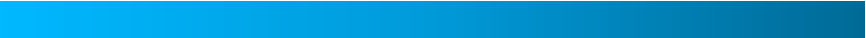

#### Mesures de performances:
    on va mesurer les pérformances de nos modèles :

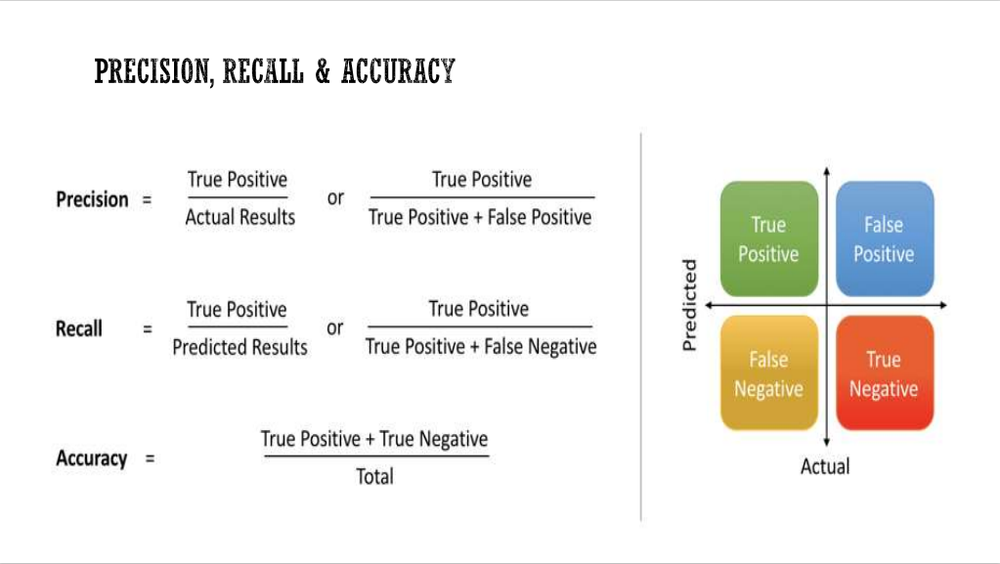

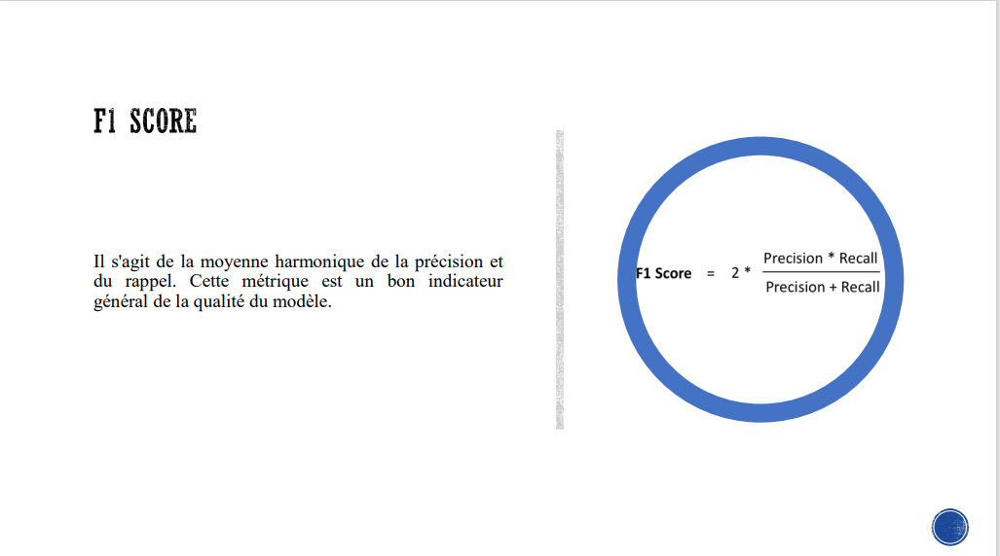

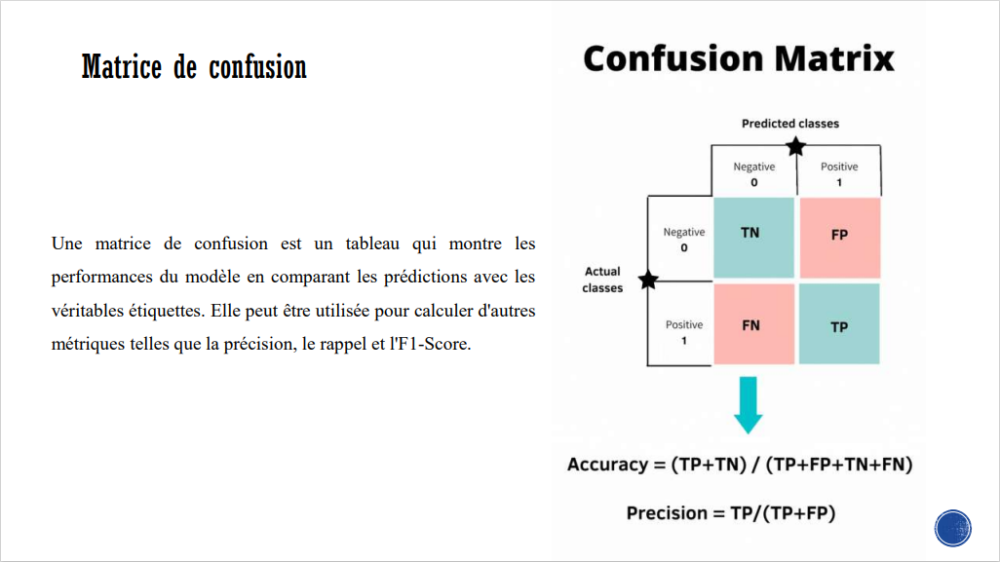

In [118]:
def plot_confusion_matrix(y_test,y_pred, cmap):

    # Créer la matrice de confusion
    conf_mat = confusion_matrix(y_test, y_pred)

    # Afficher la matrice de confusion avec les valeurs formatées
    fig, ax = plt.subplots(figsize=(25, 25))
    im = ax.imshow(conf_mat, cmap=cmap)

    # Ajouter les valeurs dans la matrice de confusion
    for i in range(conf_mat.shape[0]):
        for j in range(conf_mat.shape[1]):
            ax.text(j, i, format(conf_mat[i, j], 'd'),
                    ha="center", va="center", color="white")

    # Ajouter les noms des classes et du graphe
    ax.set_title("Matrice de confusion")
    ax.set_xticks(range(conf_mat.shape[1]))
    ax.set_xticklabels(codes)
    ax.set_yticks(range(conf_mat.shape[0]))
    ax.set_yticklabels(codes)
    ax.set_ylabel('Vraie classe')
    ax.set_xlabel('Classe prédite')
    plt.colorbar(im)

    # Afficher la figure
    plt.show()
   


###### pour feature selection 1:
    -----------------------------------------------------------------------------------------------------------------------

In [119]:
algos=['KNN','DecisionTree','LogisticRegression','RandomForest','SVM','GaussianNB','Bagging' , 'Boosting' ,'Voting']
accuracy_res=[]
recall_res=[]
f1_res=[]

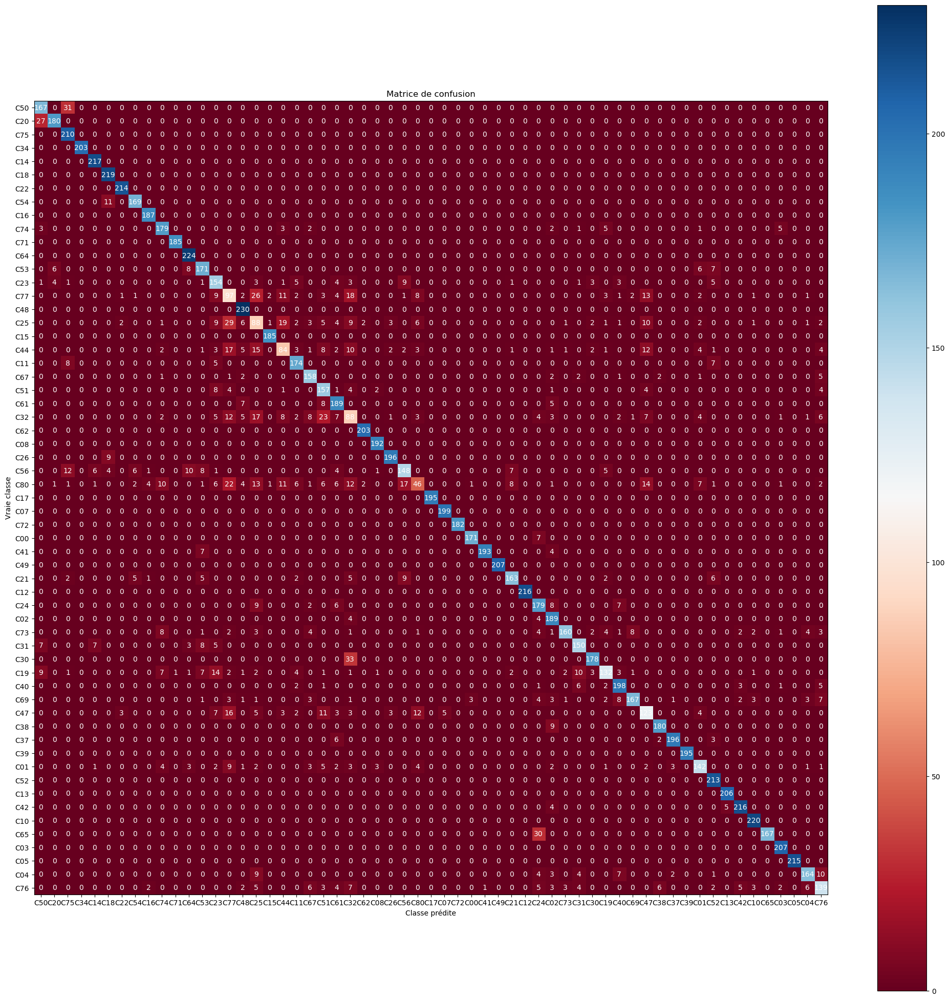

______________________________Train______________________________________
                     ___KNeighborsClassifier___
              precision    recall  f1-score   support

         C50       0.78      0.84      0.81       478
         C20       0.96      0.85      0.90       469
         C75       0.78      1.00      0.88       466
         C34       1.00      1.00      1.00       473
         C14       0.96      1.00      0.98       459
         C18       0.87      1.00      0.93       457
         C22       0.95      1.00      0.98       462
         C54       0.92      0.94      0.93       496
         C16       0.95      1.00      0.98       489
         C74       0.89      0.90      0.90       475
         C71       1.00      1.00      1.00       491
         C64       0.87      1.00      0.93       452
         C53       0.79      0.86      0.82       478
         C23       0.71      0.78      0.74       477
         C77       0.57      0.64      0.61       468
         C48 

In [120]:
from sklearn.metrics import classification_report,confusion_matrix,recall_score,accuracy_score,f1_score

plot_confusion_matrix(Y_all_test,Y_predec_model_1_all, 'RdBu')   

                        ###########################################
                        ############___KNeighborsClassifier___#####
                        ###########################################
print("______________________________Train______________________________________")              
print("                     ___KNeighborsClassifier___")            
print(classification_report(Y_all_train, Y_predec_model_1_all_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_train, Y_predec_model_1_all_train))
# Calculer l'exactitude du modèle
accuracy_KNN_all = accuracy_score(Y_all_train, Y_predec_model_1_all_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_KNN_all)
print("______________________________Test______________________________________")              
print("                     ___KNeighborsClassifier___")            
print(classification_report(Y_all_test, Y_predec_model_1_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_test, Y_predec_model_1_all))
# Calculer l'exactitude du modèle
accuracy_KNN_all = accuracy_score(Y_all_test, Y_predec_model_1_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_KNN_all)
accuracy_res.append(accuracy_KNN_all)

recall_KNN_all = recall_score(Y_all_test, Y_predec_model_1_all, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_KNN_all)
recall_res.append(recall_KNN_all)

f1_KNN_all = f1_score(Y_all_test, Y_predec_model_1_all, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_KNN_all)
f1_res.append(f1_KNN_all)

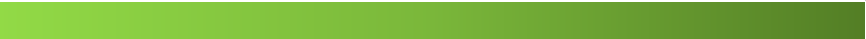

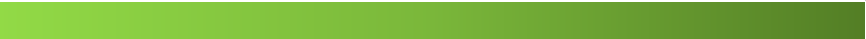

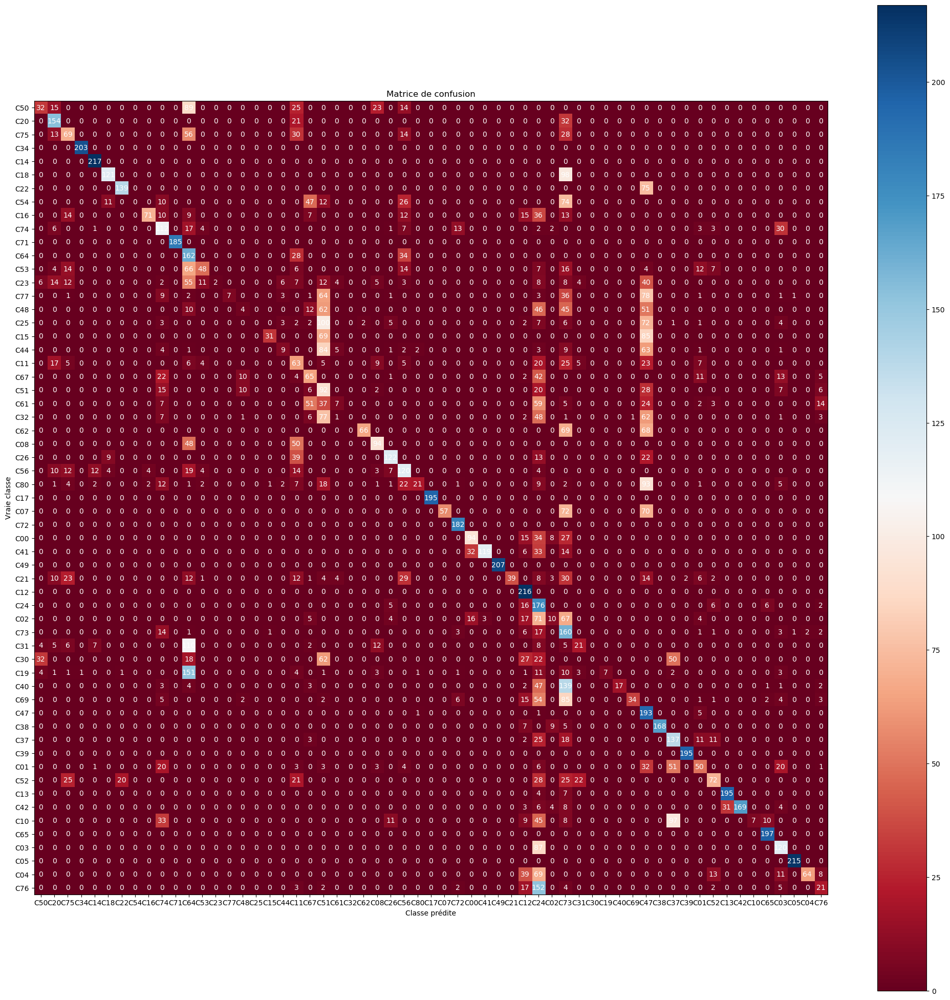

______________________________Train______________________________________
                     ___DecisionTreeClassifier___
              precision    recall  f1-score   support

         C50       0.47      0.17      0.24       478
         C20       0.61      0.72      0.66       469
         C75       0.35      0.30      0.32       466
         C34       1.00      1.00      1.00       473
         C14       0.94      1.00      0.97       459
         C18       0.76      0.50      0.61       457
         C22       0.85      0.67      0.75       462
         C54       0.00      0.00      0.00       496
         C16       0.88      0.36      0.51       489
         C74       0.42      0.64      0.51       475
         C71       1.00      1.00      1.00       491
         C64       0.18      0.77      0.29       452
         C53       0.63      0.29      0.40       478
         C23       0.83      0.01      0.02       477
         C77       0.84      0.04      0.09       468
         C4

In [121]:
                        ###########################################
                        ############___DecisionTreeClassifier___###
                        ###########################################
            
plot_confusion_matrix(Y_all_test,Y_predec_model_2_all, 'RdBu')            
print("______________________________Train______________________________________")               
print("                     ___DecisionTreeClassifier___")            
print(classification_report(Y_all_train, Y_predec_model_2_all_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_train, Y_predec_model_2_all_train))
# Calculer l'exactitude du modèle
accuracy_DecisionTree_all = accuracy_score(Y_all_train, Y_predec_model_2_all_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_DecisionTree_all)
print("______________________________Test______________________________________")   
print("                     ___DecisionTreeClassifier___")            
print(classification_report(Y_all_test, Y_predec_model_2_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_test, Y_predec_model_2_all))
# Calculer l'exactitude du modèle
accuracy_DecisionTree_all = accuracy_score(Y_all_test, Y_predec_model_2_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_DecisionTree_all)
accuracy_res.append(accuracy_DecisionTree_all)

recall_DecisionTree_all = recall_score(Y_all_test, Y_predec_model_2_all, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_DecisionTree_all)
recall_res.append(recall_DecisionTree_all)

f1_DecisionTree_all = f1_score(Y_all_test, Y_predec_model_2_all, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_DecisionTree_all)
f1_res.append(f1_DecisionTree_all)

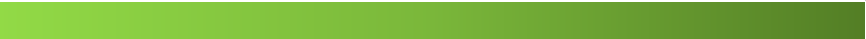

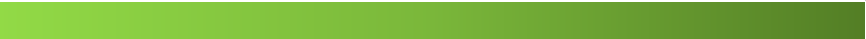

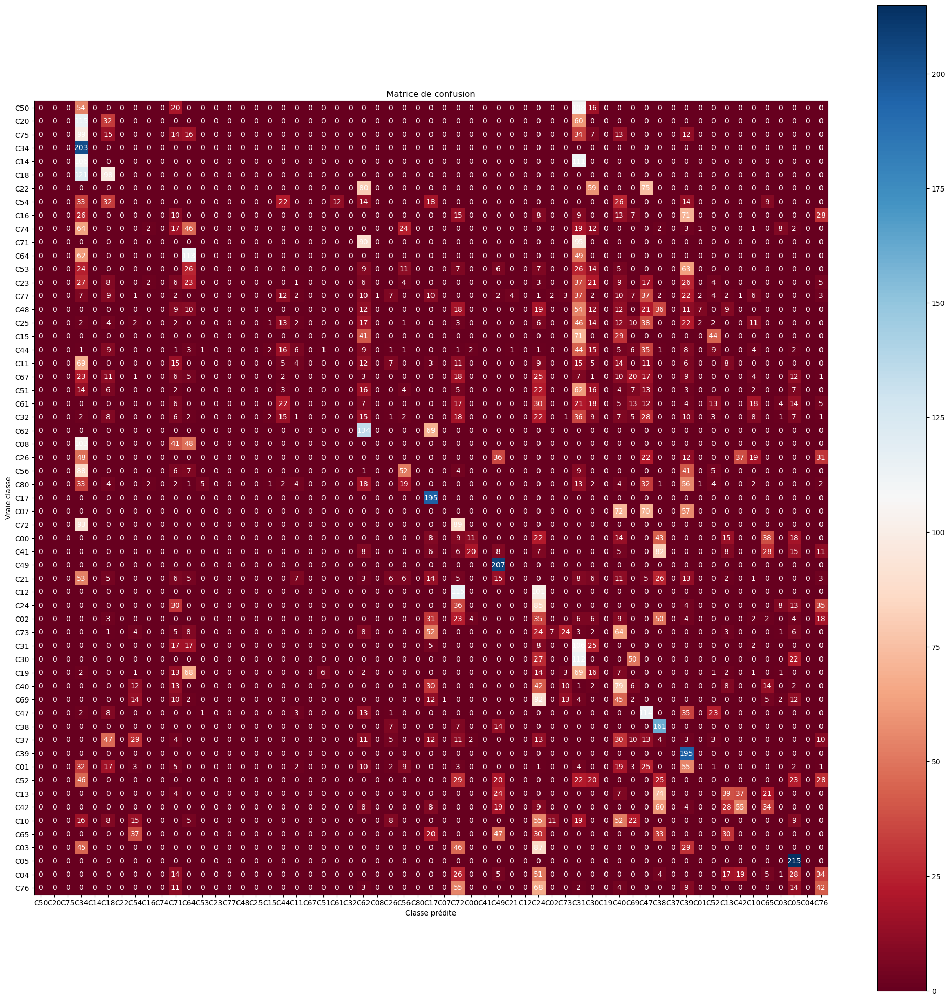

______________________________Train______________________________________
                     ___LogisticRegression___
              precision    recall  f1-score   support

         C50       0.00      0.00      0.00       478
         C20       0.00      0.00      0.00       469
         C75       0.00      0.00      0.00       466
         C34       0.13      1.00      0.23       473
         C14       0.00      0.00      0.00       459
         C18       0.30      0.50      0.38       457
         C22       0.00      0.00      0.00       462
         C54       0.00      0.00      0.00       496
         C16       0.00      0.00      0.00       489
         C74       0.00      0.00      0.00       475
         C71       0.00      0.00      0.00       491
         C64       0.24      0.49      0.33       452
         C53       0.00      0.00      0.00       478
         C23       0.00      0.00      0.00       477
         C77       0.00      0.00      0.00       468
         C48   

In [122]:
                        ###########################################
                        ############___LogisticRegression___#######
                        ###########################################
        
plot_confusion_matrix(Y_all_test,Y_predec_model_3_all, 'RdBu')   
print("______________________________Train______________________________________")               
print("                     ___LogisticRegression___")            
print(classification_report(Y_all_train, Y_predec_model_3_all_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_train, Y_predec_model_3_all_train))
# Calculer l'exactitude du modèle
accuracy_LogisticRegression_all = accuracy_score(Y_all_train, Y_predec_model_3_all_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_LogisticRegression_all)
print("______________________________test______________________________________") 
print("                     ___LogisticRegression___")            
print(classification_report(Y_all_test, Y_predec_model_3_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_test, Y_predec_model_3_all))
# Calculer l'exactitude du modèle
accuracy_LogisticRegression_all = accuracy_score(Y_all_test, Y_predec_model_3_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_LogisticRegression_all)
accuracy_res.append(accuracy_LogisticRegression_all)

recall_LogisticRegression_all = recall_score(Y_all_test, Y_predec_model_3_all, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_LogisticRegression_all)
recall_res.append(recall_LogisticRegression_all)

f1_LogisticRegression_all = f1_score(Y_all_test, Y_predec_model_3_all, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_LogisticRegression_all)
f1_res.append(f1_LogisticRegression_all)

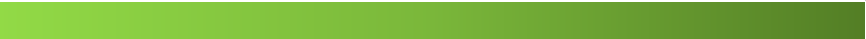

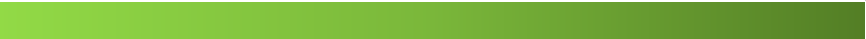

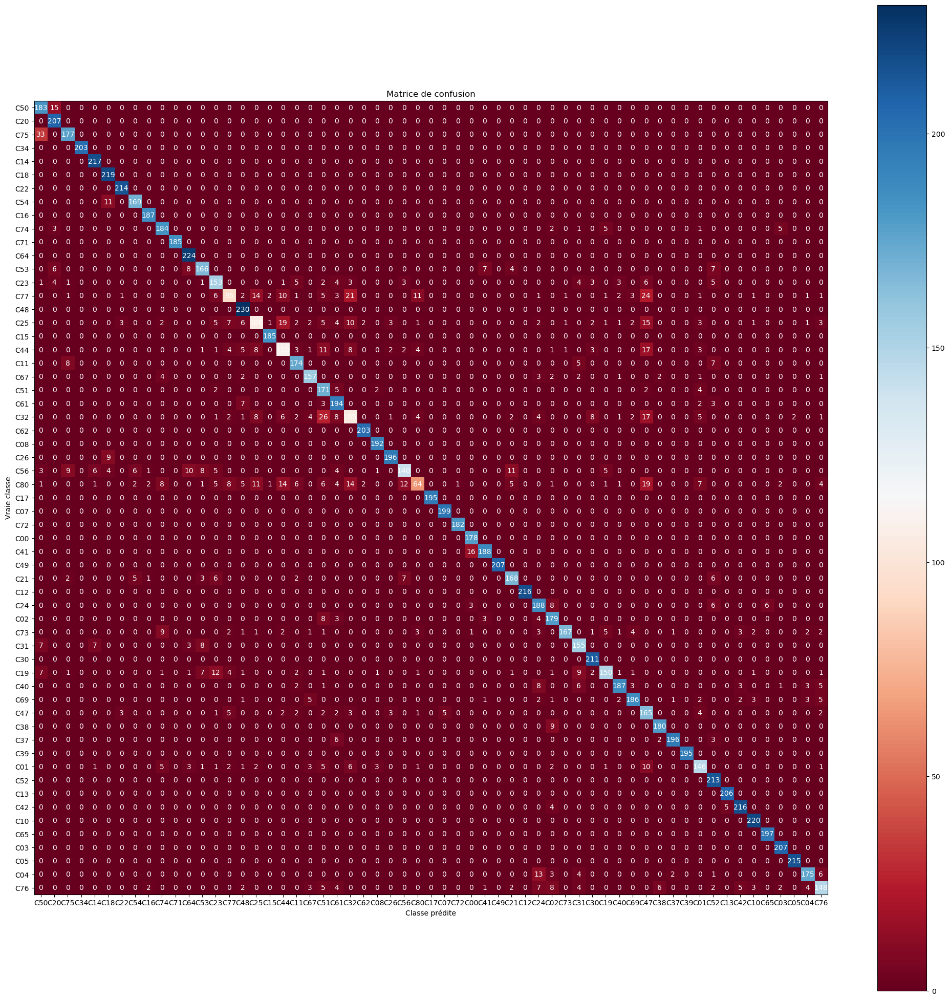

______________________________Train______________________________________
                     ___RandomForestClassifier___
              precision    recall  f1-score   support

         C50       0.79      0.94      0.86       478
         C20       0.90      1.00      0.95       469
         C75       0.90      0.86      0.88       466
         C34       1.00      1.00      1.00       473
         C14       0.96      1.00      0.98       459
         C18       0.87      1.00      0.93       457
         C22       0.96      1.00      0.98       462
         C54       0.92      0.94      0.93       496
         C16       0.96      1.00      0.98       489
         C74       0.93      0.93      0.93       475
         C71       1.00      1.00      1.00       491
         C64       0.87      1.00      0.93       452
         C53       0.83      0.85      0.84       478
         C23       0.82      0.78      0.80       477
         C77       0.89      0.67      0.76       468
         C4

In [123]:
                        ###########################################
                        ############___RandomForestClassifier___###
                        ###########################################


plot_confusion_matrix(Y_all_test,Y_predec_model_4_all, 'RdBu')   
print("______________________________Train______________________________________")               
print("                     ___RandomForestClassifier___")            
print(classification_report(Y_all_train, Y_predec_model_4_all_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_train, Y_predec_model_4_all_train))
# Calculer l'exactitude du modèle
accuracy_RandomForest_all = accuracy_score(Y_all_train, Y_predec_model_4_all_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_RandomForest_all)
print("______________________________test______________________________________")             
print("                     ___RandomForestClassifier___")            
print(classification_report(Y_all_test, Y_predec_model_4_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_test, Y_predec_model_4_all))
# Calculer l'exactitude du modèle
accuracy_RandomForest_all = accuracy_score(Y_all_test, Y_predec_model_4_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_RandomForest_all)
accuracy_res.append(accuracy_RandomForest_all)

recall_RandomForest_all = recall_score(Y_all_test, Y_predec_model_4_all, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_RandomForest_all)
recall_res.append(recall_RandomForest_all)

f1_RandomForest_all = f1_score(Y_all_test, Y_predec_model_4_all,average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_RandomForest_all)
f1_res.append(f1_RandomForest_all)

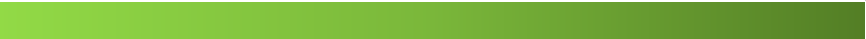

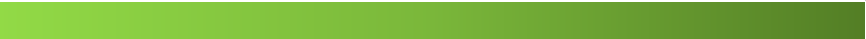

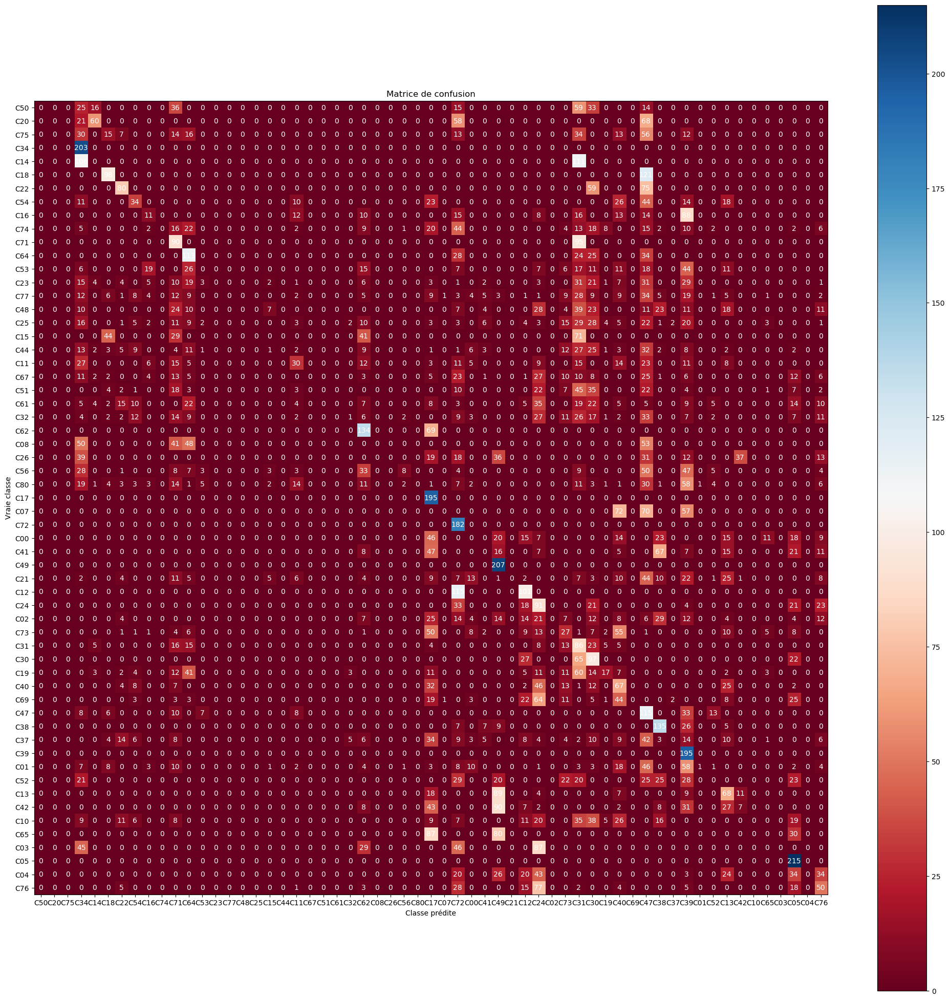

______________________________Train______________________________________
                      ___Support Vector Machine (SVM)___
              precision    recall  f1-score   support

         C50       0.00      0.00      0.00       478
         C20       0.00      0.00      0.00       469
         C75       0.00      0.00      0.00       466
         C34       0.27      1.00      0.42       473
         C14       0.00      0.00      0.00       459
         C18       0.50      0.50      0.50       457
         C22       0.42      0.32      0.36       462
         C54       0.36      0.22      0.27       496
         C16       0.22      0.09      0.12       489
         C74       0.00      0.00      0.00       475
         C71       0.21      0.48      0.29       491
         C64       0.25      0.49      0.33       452
         C53       0.00      0.00      0.00       478
         C23       0.00      0.00      0.00       477
         C77       0.00      0.00      0.00       468
    

In [124]:
                        ###########################################
                        ####___Support Vector Machine (SVM) ___####
                        ###########################################

plot_confusion_matrix(Y_all_test,Y_predec_model_5_all, 'RdBu')    
print("______________________________Train______________________________________")               
print("                      ___Support Vector Machine (SVM)___")            
print(classification_report(Y_all_train, Y_predec_model_5_all_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_train, Y_predec_model_5_all_train))
# Calculer l'exactitude du modèle
accuracy_SVM_all = accuracy_score(Y_all_train, Y_predec_model_5_all_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_SVM_all)
print("______________________________Test______________________________________")               
print("               ___Support Vector Machine (SVM)___")            
print(classification_report(Y_all_test, Y_predec_model_5_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_test, Y_predec_model_5_all))
# Calculer l'exactitude du modèle
accuracy_SVM_all = accuracy_score(Y_all_test, Y_predec_model_5_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_SVM_all)
accuracy_res.append(accuracy_SVM_all)

recall_SVM_all = recall_score(Y_all_test, Y_predec_model_5_all, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_SVM_all)
recall_res.append(recall_SVM_all)

f1_SVM_all = f1_score(Y_all_test, Y_predec_model_5_all, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_SVM_all)
f1_res.append(f1_SVM_all)

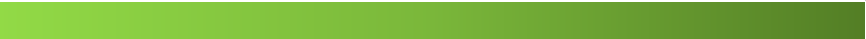

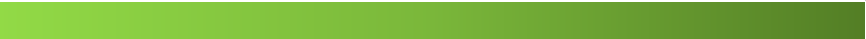

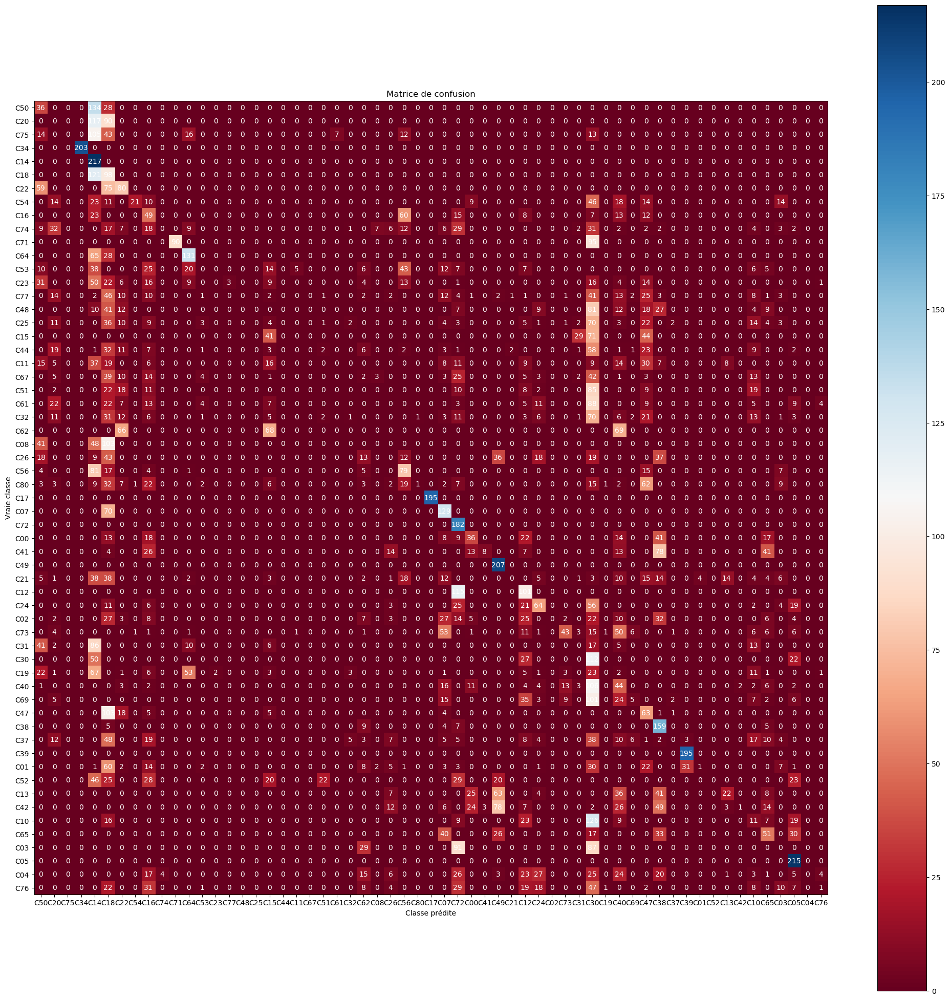

______________________________Train______________________________________
                      ______Naives Bayes______
              precision    recall  f1-score   support

         C50       0.13      0.22      0.16       478
         C20       0.00      0.00      0.00       469
         C75       0.00      0.00      0.00       466
         C34       1.00      1.00      1.00       473
         C14       0.15      1.00      0.26       459
         C18       0.07      0.50      0.13       457
         C22       0.25      0.32      0.28       462
         C54       0.86      0.06      0.11       496
         C16       0.14      0.28      0.19       489
         C74       0.00      0.00      0.00       475
         C71       1.00      0.48      0.65       491
         C64       0.53      0.65      0.58       452
         C53       0.00      0.00      0.00       478
         C23       0.00      0.00      0.00       477
         C77       0.00      0.00      0.00       468
         C48  

In [125]:
                        ###########################################
                        ##########_______naive bayes _______#######
                        ###########################################

plot_confusion_matrix(Y_all_test,Y_predec_model_6_all, 'RdBu')   
print("______________________________Train______________________________________")               
print("                      ______Naives Bayes______")            
print(classification_report(Y_all_train, Y_predec_model_6_all_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_train, Y_predec_model_6_all_train))
# Calculer l'exactitude du modèle
accuracy_naive_Bayes_all = accuracy_score(Y_all_train, Y_predec_model_6_all_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_naive_Bayes_all)
print("______________________________Test______________________________________")               
print("               ______Naives Bayes______")            
print(classification_report(Y_all_test, Y_predec_model_6_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_test, Y_predec_model_6_all))
# Calculer l'exactitude du modèle
accuracy_naive_Bayes_all = accuracy_score(Y_all_test, Y_predec_model_6_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_naive_Bayes_all)
accuracy_res.append(accuracy_naive_Bayes_all)

recall_naive_Bayes_all = recall_score(Y_all_test, Y_predec_model_6_all, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_naive_Bayes_all)
recall_res.append(recall_naive_Bayes_all)

f1_naive_Bayes_all = f1_score(Y_all_test, Y_predec_model_6_all, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_naive_Bayes_all)
f1_res.append(f1_naive_Bayes_all)

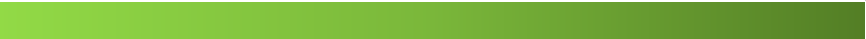

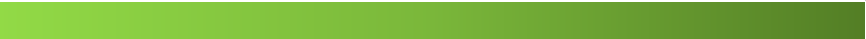

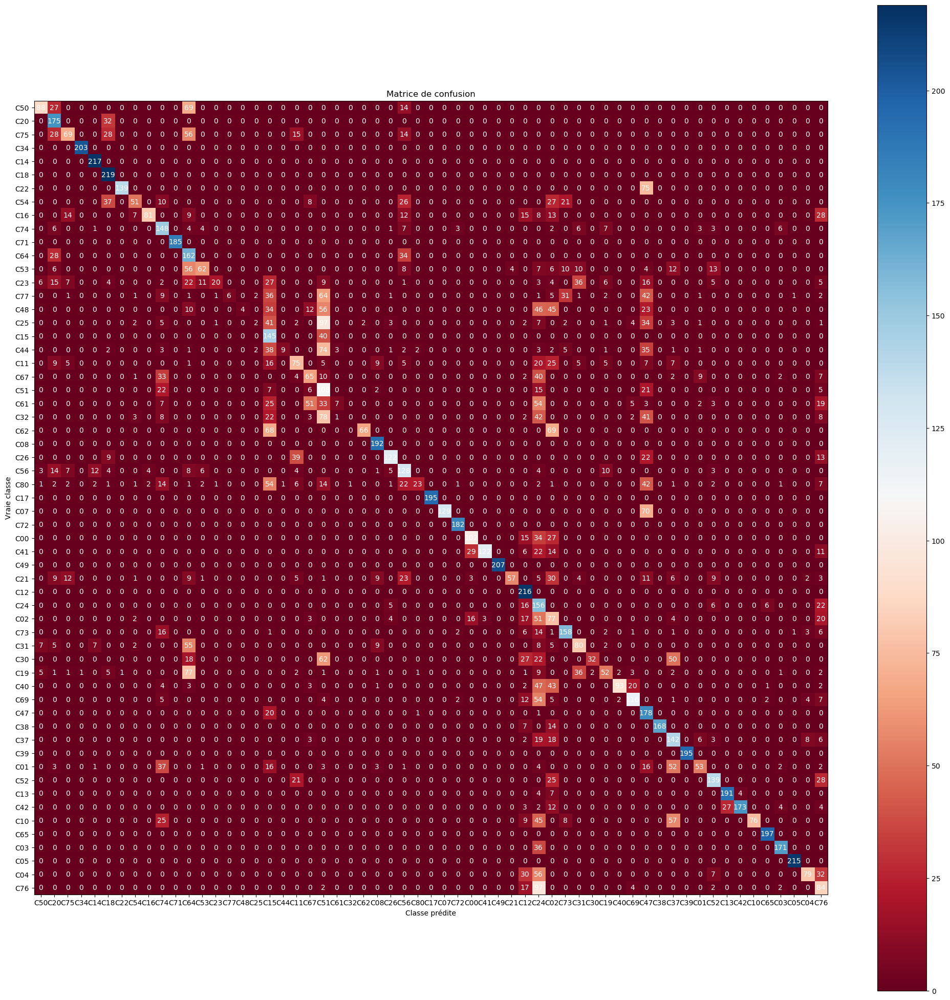

______________________________Train______________________________________
                       ______Bagging______
              precision    recall  f1-score   support

         C50       0.80      0.46      0.58       478
         C20       0.55      0.88      0.67       469
         C75       0.53      0.30      0.38       466
         C34       1.00      1.00      1.00       473
         C14       0.94      1.00      0.97       459
         C18       0.61      1.00      0.75       457
         C22       0.99      0.67      0.80       462
         C54       0.66      0.31      0.42       496
         C16       0.90      0.42      0.57       489
         C74       0.43      0.75      0.55       475
         C71       1.00      1.00      1.00       491
         C64       0.28      0.77      0.41       452
         C53       0.71      0.37      0.48       478
         C23       0.90      0.09      0.16       477
         C77       0.91      0.04      0.09       468
         C48      

In [126]:
                        ###########################################
                        ##########_______Bagging _______#######
                        ###########################################

plot_confusion_matrix(Y_all_test,Y_predec_bagging_all, 'RdBu')   
print("______________________________Train______________________________________")               
print("                       ______Bagging______")            
print(classification_report(Y_all_train, Y_predec_bagging_train_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_train, Y_predec_bagging_train_all))
# Calculer l'exactitude du modèle
accuracy_bagging_all = accuracy_score(Y_all_train, Y_predec_bagging_train_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_bagging_all)
print("______________________________Test______________________________________")               
print("                      ______Bagging______")            
print(classification_report(Y_all_test, Y_predec_bagging_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_test, Y_predec_bagging_all))
# Calculer l'exactitude du modèle
accuracy_bagging_all = accuracy_score(Y_all_test, Y_predec_bagging_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_bagging_all)
accuracy_res.append(accuracy_bagging_all)

recall_bagging_all = recall_score(Y_all_test, Y_predec_bagging_all, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_bagging_all)
recall_res.append(recall_bagging_all)

f1_bagging_all = f1_score(Y_all_test, Y_predec_bagging_all, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_bagging_all)
f1_res.append(f1_bagging_all)

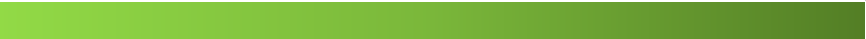

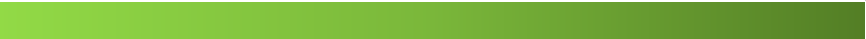

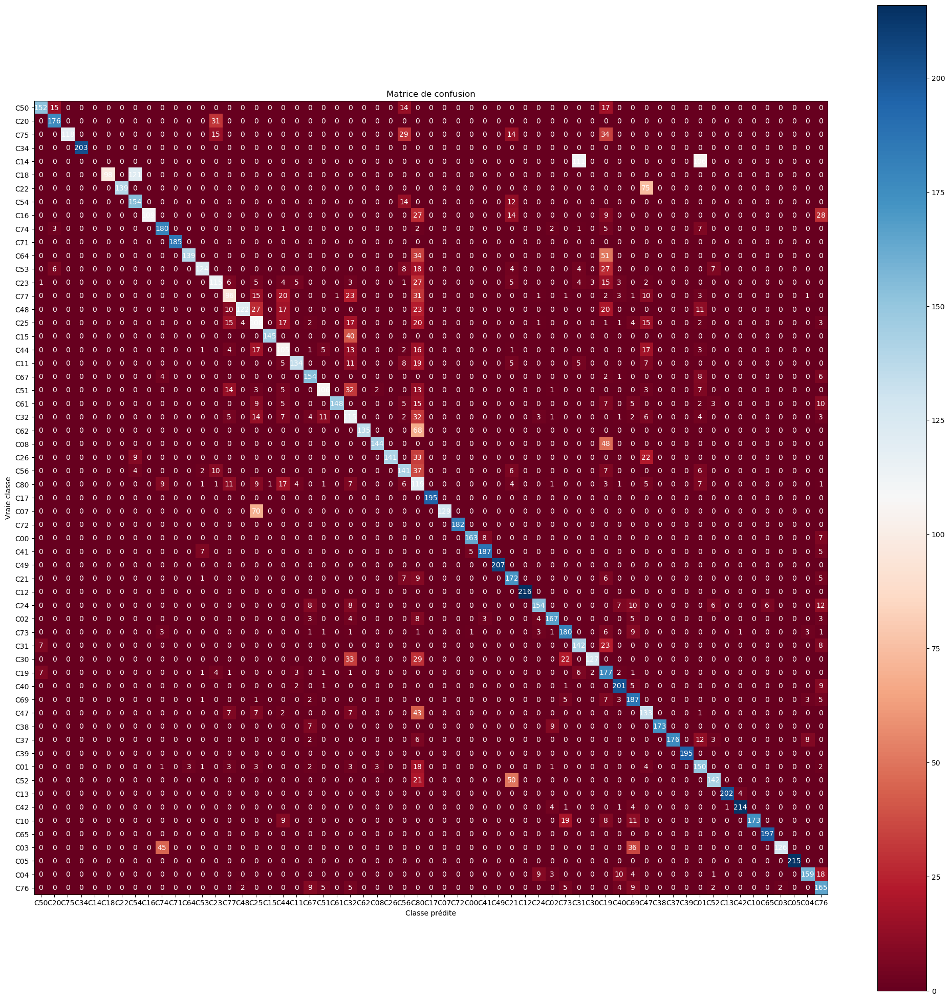

______________________________Train______________________________________
                       ______Boosting______
              precision    recall  f1-score   support

         C50       0.91      0.78      0.84       478
         C20       0.90      0.85      0.87       469
         C75       1.00      0.58      0.73       466
         C34       1.00      1.00      1.00       473
         C14       0.00      0.00      0.00       459
         C18       1.00      0.50      0.66       457
         C22       1.00      0.67      0.80       462
         C54       0.62      0.89      0.73       496
         C16       1.00      0.61      0.75       489
         C74       0.78      0.93      0.85       475
         C71       1.00      1.00      1.00       491
         C64       0.98      0.64      0.78       452
         C53       0.87      0.59      0.70       478
         C23       0.69      0.58      0.63       477
         C77       0.67      0.66      0.66       468
         C48     

In [127]:
                        ###########################################
                        ##########_______Boosting  _______#######
                        ###########################################

plot_confusion_matrix(Y_all_test,Y_predec_boosting_all, 'RdBu')   
print("______________________________Train______________________________________")               
print("                       ______Boosting______")            
print(classification_report(Y_all_train, Y_predec_boosting_train_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_train, Y_predec_boosting_train_all))
# Calculer l'exactitude du modèle
accuracy_boosting_all = accuracy_score(Y_all_train, Y_predec_boosting_train_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_boosting_all)
print("______________________________Test______________________________________")               
print("                      ______Boosting______")            
print(classification_report(Y_all_test, Y_predec_boosting_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_test, Y_predec_boosting_all))
# Calculer l'exactitude du modèle
accuracy_boosting_all = accuracy_score(Y_all_test, Y_predec_boosting_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_boosting_all)
accuracy_res.append(accuracy_boosting_all)

recall_boosting_all = recall_score(Y_all_test, Y_predec_boosting_all, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_boosting_all)
recall_res.append(recall_boosting_all)

f1_boosting_all = f1_score(Y_all_test, Y_predec_boosting_all, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_boosting_all)
f1_res.append(f1_boosting_all)

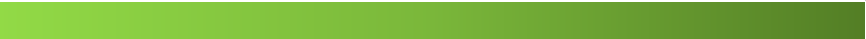

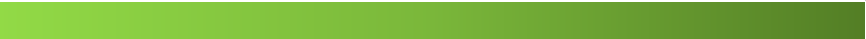

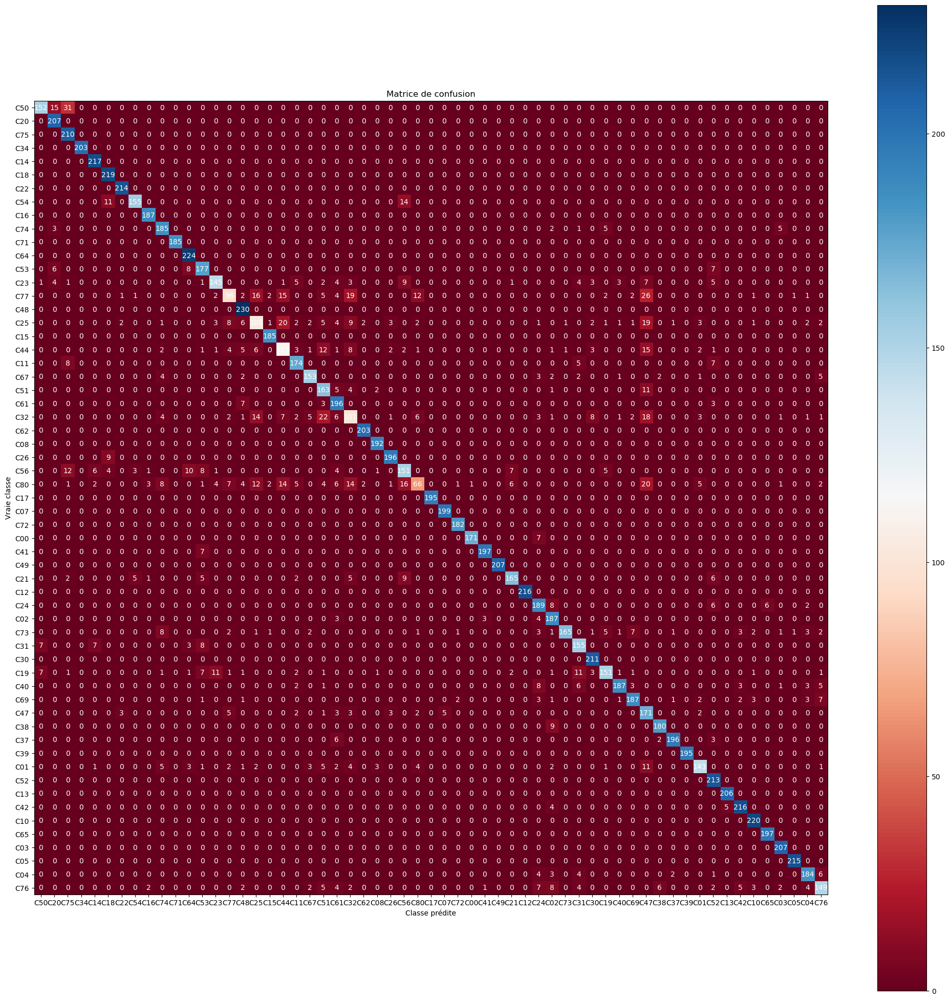

______________________________Train______________________________________
                       ______Voting______
              precision    recall  f1-score   support

         C50       0.91      0.78      0.84       478
         C20       0.90      1.00      0.95       469
         C75       0.78      1.00      0.88       466
         C34       1.00      1.00      1.00       473
         C14       0.95      1.00      0.98       459
         C18       0.87      1.00      0.93       457
         C22       0.96      1.00      0.98       462
         C54       0.95      0.90      0.92       496
         C16       0.96      1.00      0.98       489
         C74       0.90      0.94      0.92       475
         C71       1.00      1.00      1.00       491
         C64       0.87      1.00      0.93       452
         C53       0.79      0.90      0.84       478
         C23       0.87      0.73      0.80       477
         C77       0.87      0.66      0.75       468
         C48       

In [128]:
                        ###########################################
                        ##########_______Voting _______#######
                        ###########################################

plot_confusion_matrix(Y_all_test,Y_predec_voting_all, 'RdBu')   
print("______________________________Train______________________________________")               
print("                       ______Voting______")            
print(classification_report(Y_all_train, Y_predec_voting_train_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_train, Y_predec_voting_train_all))
# Calculer l'exactitude du modèle
accuracy_voting_all = accuracy_score(Y_all_train, Y_predec_voting_train_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_voting_all)
print("______________________________Test______________________________________")               
print("                      ______Voting______")            
print(classification_report(Y_all_test, Y_predec_voting_all, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_all_test, Y_predec_voting_all))
# Calculer l'exactitude du modèle
accuracy_voting_all = accuracy_score(Y_all_test, Y_predec_voting_all)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_voting_all)
accuracy_res.append(accuracy_voting_all)

recall_voting_all = recall_score(Y_all_test, Y_predec_voting_all, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_voting_all)
recall_res.append(recall_voting_all)

f1_voting_all = f1_score(Y_all_test, Y_predec_voting_all, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_voting_all)
f1_res.append(f1_voting_all)

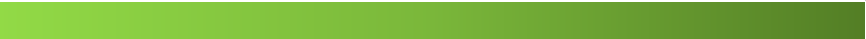

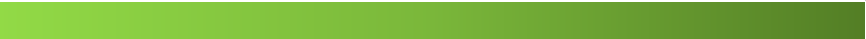

In [129]:
final_result=pd.DataFrame({'Algorithm':algos,'Accuracy':accuracy_res,'Recall':recall_res,'F1Score':f1_res})

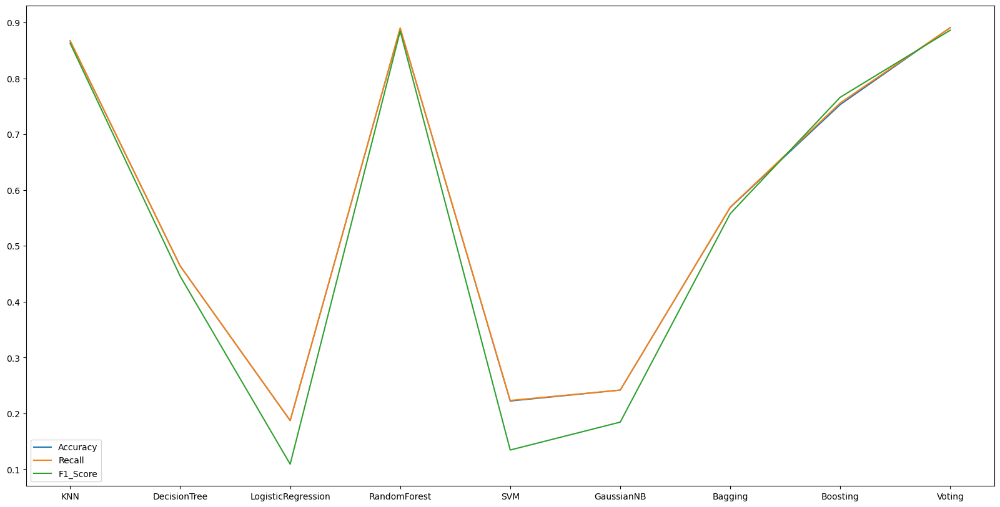

In [130]:
fig,ax=plt.subplots(figsize=(20,10))
plt.plot(final_result.Algorithm,accuracy_res,label='Accuracy')
plt.plot(final_result.Algorithm,recall_res,label='Recall')
plt.plot(final_result.Algorithm,f1_res,label='F1_Score')
plt.legend()
plt.show()

###### pour feature selection 2:
    ------------------------------------------------------------------------------------------------------------------------

In [157]:
accuracy_res_2=[]
recall_res_2=[]
f1_res_2=[]

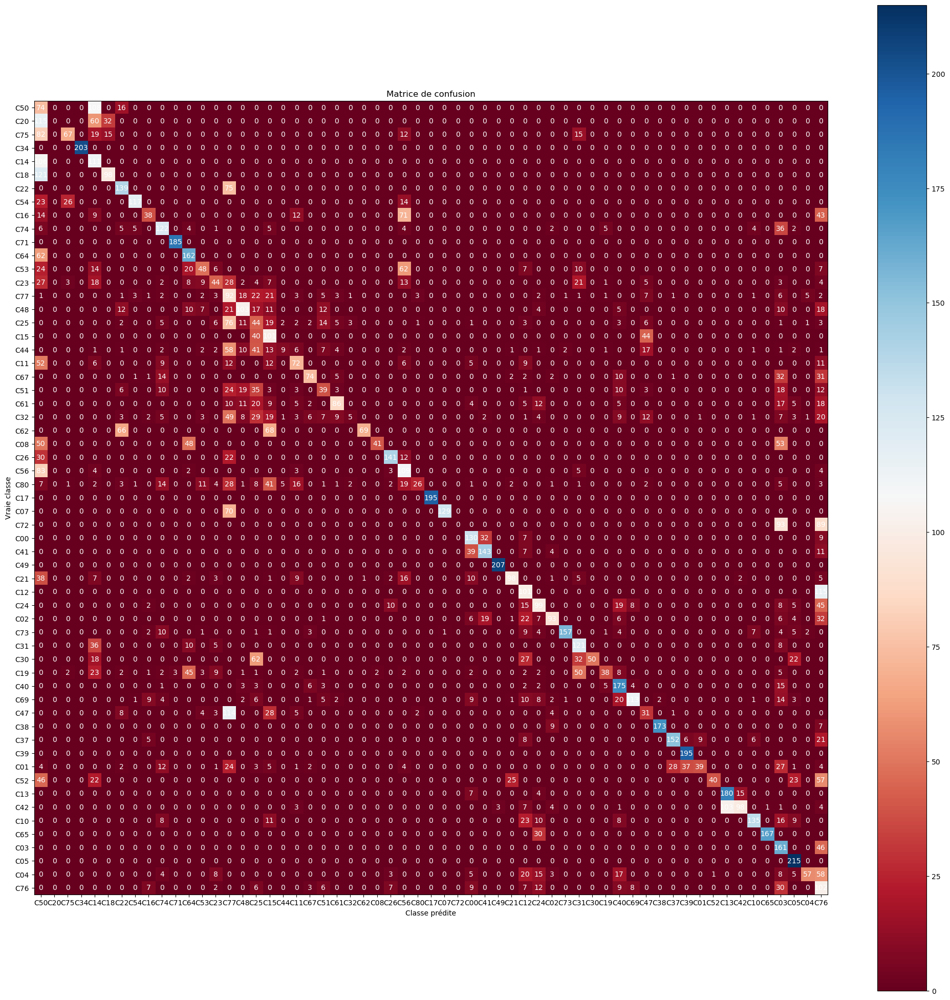

______________________________Train______________________________________
                     ___KNeighborsClassifier___
              precision    recall  f1-score   support

         C50       0.10      0.45      0.17       478
         C20       0.00      0.00      0.00       469
         C75       0.68      0.35      0.46       466
         C34       1.00      1.00      1.00       473
         C14       0.23      0.52      0.32       459
         C18       0.74      0.50      0.59       457
         C22       0.51      0.67      0.58       462
         C54       0.92      0.69      0.79       496
         C16       0.67      0.24      0.35       489
         C74       0.58      0.59      0.58       475
         C71       0.99      1.00      1.00       491
         C64       0.51      0.77      0.62       452
         C53       0.48      0.20      0.28       478
         C23       0.45      0.23      0.31       477
         C77       0.14      0.47      0.21       468
         C48 

In [158]:
plot_confusion_matrix(Y_test, Y_predec_model_1, 'RdBu')  

                        ###########################################
                        ############___KNeighborsClassifier___#####
                        ###########################################
print("______________________________Train______________________________________")              
print("                     ___KNeighborsClassifier___")            
print(classification_report(Y_train, Y_predec_model_1_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_train, Y_predec_model_1_train))
# Calculer l'exactitude du modèle
accuracy_KNN = accuracy_score(Y_train, Y_predec_model_1_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_KNN)
print("______________________________Test______________________________________")              
print("                     ___KNeighborsClassifier___")            
print(classification_report(Y_test, Y_predec_model_1, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_test, Y_predec_model_1))
# Calculer l'exactitude du modèle
accuracy_KNN = accuracy_score(Y_test, Y_predec_model_1)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_KNN)
accuracy_res_2.append(accuracy_KNN)

recall_KNN = recall_score(Y_test, Y_predec_model_1, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_KNN)
recall_res_2.append(recall_KNN)

f1_KNN = f1_score(Y_test, Y_predec_model_1, average='macro')
print("--------------------------------------------------------------------")
print("F1_score:", f1_KNN)
f1_res_2.append(f1_KNN)

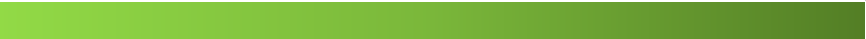

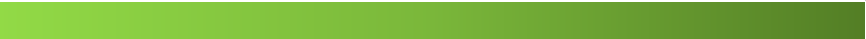

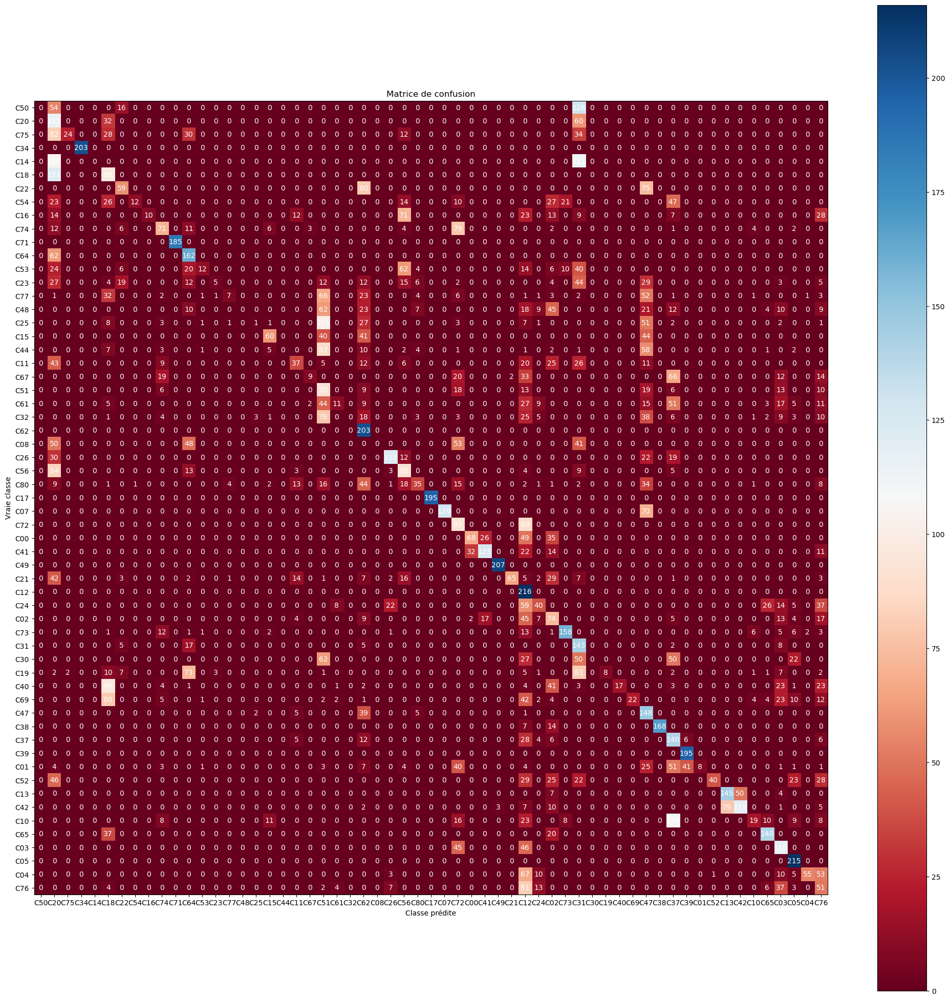

______________________________Train______________________________________
                     ___DecisionTreeClassifier___
              precision    recall  f1-score   support

         C50       0.00      0.00      0.00       478
         C20       0.13      0.56      0.21       469
         C75       0.97      0.13      0.22       466
         C34       1.00      1.00      1.00       473
         C14       0.00      0.00      0.00       459
         C18       0.21      0.50      0.30       457
         C22       0.48      0.34      0.40       462
         C54       1.00      0.08      0.14       496
         C16       1.00      0.06      0.12       489
         C74       0.48      0.34      0.40       475
         C71       1.00      1.00      1.00       491
         C64       0.40      0.77      0.53       452
         C53       0.32      0.04      0.06       478
         C23       0.61      0.02      0.04       477
         C77       0.51      0.04      0.08       468
         C4

In [159]:
plot_confusion_matrix(Y_test, Y_predec_model_2, 'RdBu')   
                        ###########################################
                        ############___DecisionTreeClassifier___###
                        ###########################################
print("______________________________Train______________________________________")               
print("                     ___DecisionTreeClassifier___")            
print(classification_report(Y_train, Y_predec_model_2_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_train, Y_predec_model_2_train))
# Calculer l'exactitude du modèle
accuracy_DecisionTree = accuracy_score(Y_train, Y_predec_model_2_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_DecisionTree)
print("______________________________Test______________________________________")   
print("                     ___DecisionTreeClassifier___")            
print(classification_report(Y_test, Y_predec_model_2, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_test, Y_predec_model_2))
# Calculer l'exactitude du modèle
accuracy_DecisionTree = accuracy_score(Y_test, Y_predec_model_2)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_DecisionTree)
accuracy_res_2.append(accuracy_DecisionTree)

recall_DecisionTree  = recall_score(Y_test, Y_predec_model_2, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_DecisionTree)
recall_res_2.append(recall_DecisionTree)

f1_DecisionTree  = f1_score(Y_test, Y_predec_model_2, average='macro')
print("--------------------------------------------------------------------")
print("F1_score:", f1_DecisionTree)
f1_res_2.append(f1_DecisionTree)

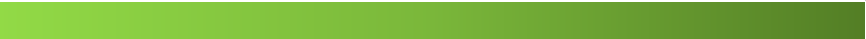

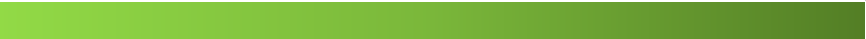

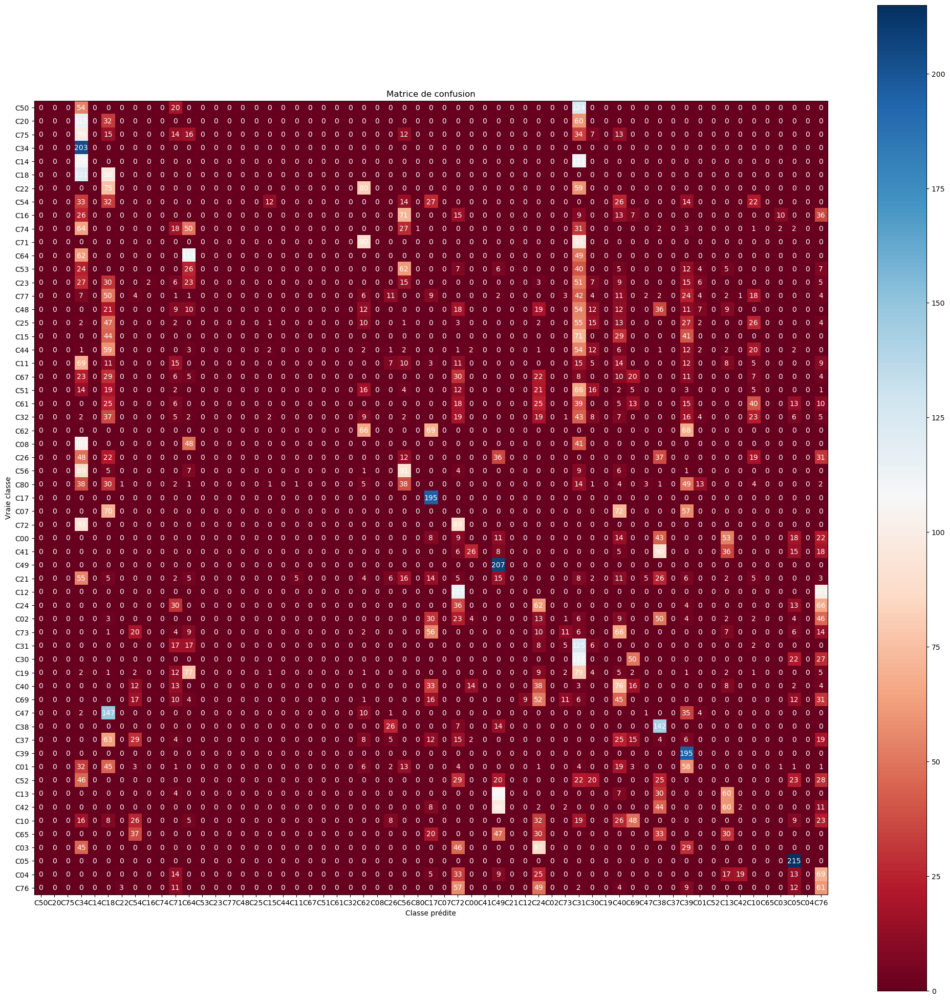

______________________________Train______________________________________
                     ___LogisticRegression___
              precision    recall  f1-score   support

         C50       0.00      0.00      0.00       478
         C20       0.00      0.00      0.00       469
         C75       0.00      0.00      0.00       466
         C34       0.13      1.00      0.23       473
         C14       0.00      0.00      0.00       459
         C18       0.10      0.50      0.16       457
         C22       0.00      0.00      0.00       462
         C54       0.00      0.00      0.00       496
         C16       0.00      0.00      0.00       489
         C74       0.00      0.00      0.00       475
         C71       0.00      0.00      0.00       491
         C64       0.24      0.49      0.32       452
         C53       0.00      0.00      0.00       478
         C23       0.00      0.00      0.00       477
         C77       0.00      0.00      0.00       468
         C48   

In [160]:
plot_confusion_matrix(Y_test, Y_predec_model_3, 'RdBu')   
                        ###########################################
                        ############___LogisticRegression___#######
                        ###########################################
        
print("______________________________Train______________________________________")               
print("                     ___LogisticRegression___")            
print(classification_report(Y_train, Y_predec_model_3_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_train, Y_predec_model_3_train))
# Calculer l'exactitude du modèle
accuracy_LogisticRegression = accuracy_score(Y_train, Y_predec_model_3_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_LogisticRegression)
print("______________________________test______________________________________") 
print("                     ___LogisticRegression___")            
print(classification_report(Y_test, Y_predec_model_3, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_test, Y_predec_model_3))
# Calculer l'exactitude du modèle
accuracy_LogisticRegression = accuracy_score(Y_test, Y_predec_model_3)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_LogisticRegression)
accuracy_res_2.append(accuracy_LogisticRegression)

recall_LogisticRegression  = recall_score(Y_test, Y_predec_model_3, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_LogisticRegression)
recall_res_2.append(recall_LogisticRegression)

f1_LogisticRegression = f1_score(Y_test, Y_predec_model_3, average='macro')
print("--------------------------------------------------------------------")
print("F1_score:", f1_LogisticRegression)
f1_res_2.append(f1_LogisticRegression)

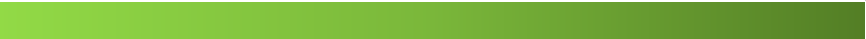

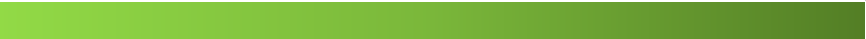

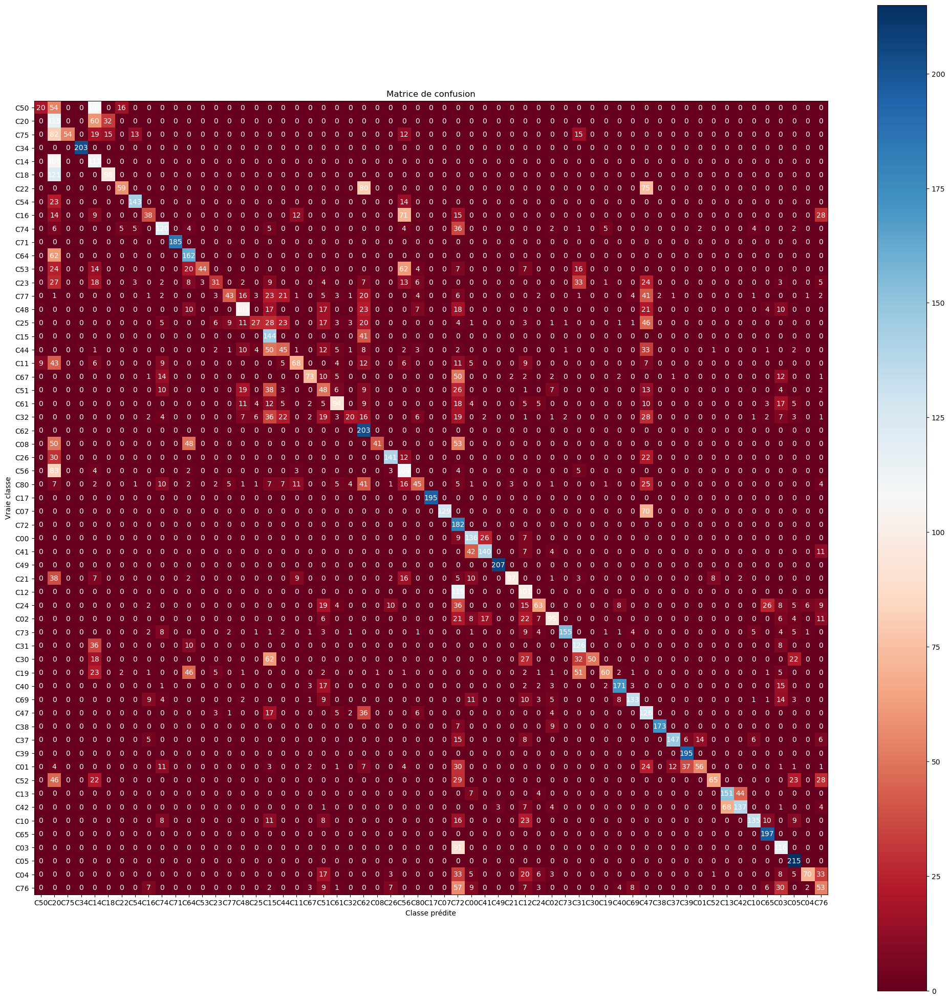

______________________________Train______________________________________
                     ___RandomForestClassifier___
              precision    recall  f1-score   support

         C50       0.73      0.10      0.18       478
         C20       0.13      0.56      0.21       469
         C75       1.00      0.27      0.43       466
         C34       1.00      1.00      1.00       473
         C14       0.23      0.52      0.32       459
         C18       0.74      0.50      0.59       457
         C22       0.68      0.34      0.46       462
         C54       0.86      0.83      0.85       496
         C16       0.67      0.24      0.35       489
         C74       0.61      0.58      0.59       475
         C71       1.00      1.00      1.00       491
         C64       0.51      0.77      0.62       452
         C53       0.93      0.16      0.27       478
         C23       0.59      0.16      0.25       477
         C77       0.83      0.27      0.41       468
         C4

In [161]:
plot_confusion_matrix(Y_test, Y_predec_model_4, 'RdBu')  
                        ###########################################
                        ############___RandomForestClassifier___###
                        ###########################################

print("______________________________Train______________________________________")               
print("                     ___RandomForestClassifier___")            
print(classification_report(Y_train, Y_predec_model_4_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_train, Y_predec_model_4_train))
# Calculer l'exactitude du modèle
accuracy_RandomForest = accuracy_score(Y_train, Y_predec_model_4_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_RandomForest)
print("______________________________test______________________________________")             
print("                     ___RandomForestClassifier___")            
print(classification_report(Y_test, Y_predec_model_4, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_test, Y_predec_model_4))
# Calculer l'exactitude du modèle
accuracy_RandomForest = accuracy_score(Y_test, Y_predec_model_4)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_RandomForest)
accuracy_res_2.append(accuracy_RandomForest)

recall_RandomForest = recall_score(Y_test, Y_predec_model_4, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_RandomForest)
recall_res_2.append(recall_RandomForest)

f1_RandomForest = f1_score(Y_test, Y_predec_model_4, average='macro')
print("--------------------------------------------------------------------")
print("F1_score:", f1_RandomForest)
f1_res_2.append(f1_RandomForest)

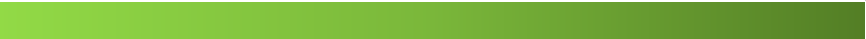

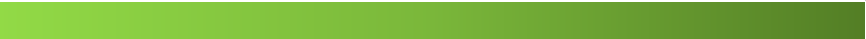

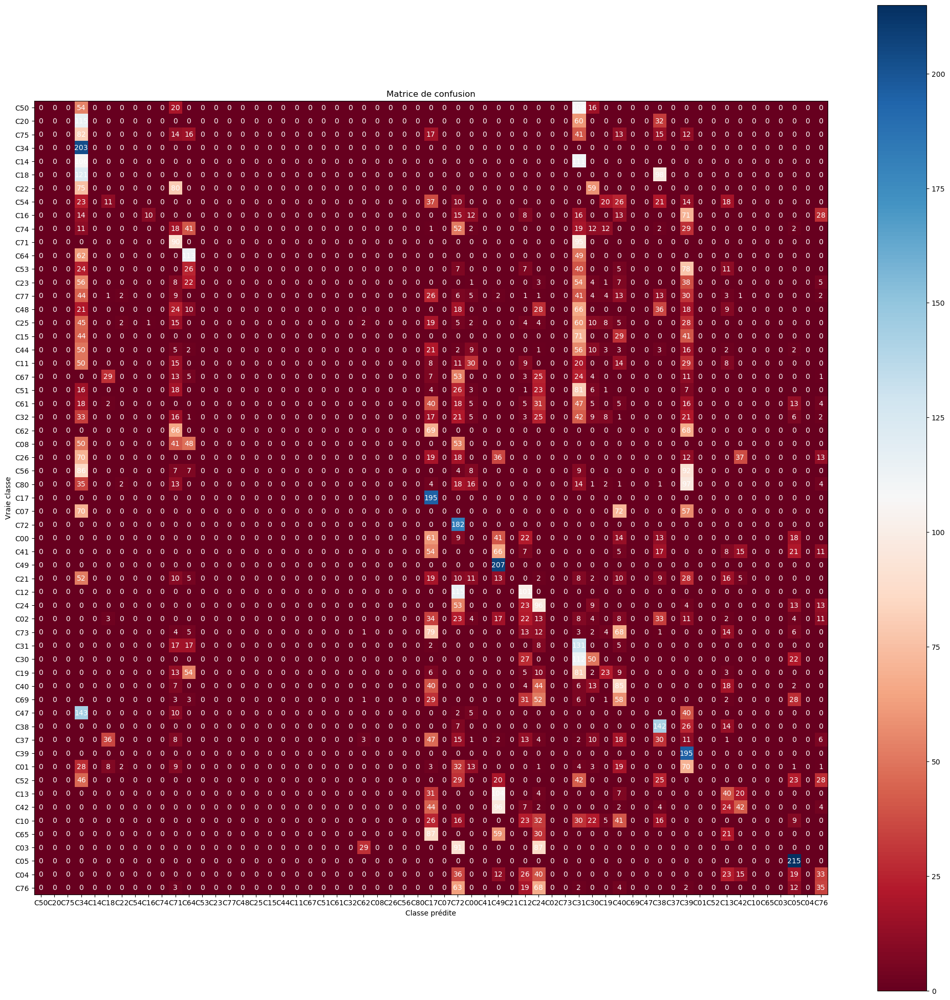

______________________________Train______________________________________
                      ___Support Vector Machine (SVM)___
              precision    recall  f1-score   support

         C50       0.00      0.00      0.00       478
         C20       0.00      0.00      0.00       469
         C75       0.00      0.00      0.00       466
         C34       0.12      1.00      0.21       473
         C14       0.00      0.00      0.00       459
         C18       0.00      0.00      0.00       457
         C22       0.00      0.00      0.00       462
         C54       0.00      0.00      0.00       496
         C16       0.68      0.06      0.11       489
         C74       0.00      0.00      0.00       475
         C71       0.18      0.48      0.26       491
         C64       0.27      0.49      0.35       452
         C53       0.00      0.00      0.00       478
         C23       0.00      0.00      0.00       477
         C77       0.00      0.00      0.00       468
    

In [162]:
plot_confusion_matrix(Y_test, Y_predec_model_5, 'RdBu')  
                        ###########################################
                        ####___Support Vector Machine (SVM) ___####
                        ###########################################

print("______________________________Train______________________________________")               
print("                      ___Support Vector Machine (SVM)___")            
print(classification_report(Y_train, Y_predec_model_5_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_train, Y_predec_model_5_train))
# Calculer l'exactitude du modèle
accuracy_SVM = accuracy_score(Y_train, Y_predec_model_5_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_SVM)
print("______________________________Test______________________________________")               
print("               ___Support Vector Machine (SVM)___")            
print(classification_report(Y_test, Y_predec_model_5, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_test, Y_predec_model_5))
# Calculer l'exactitude du modèle
accuracy_SVM = accuracy_score(Y_test, Y_predec_model_5)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_SVM)
accuracy_res_2.append(accuracy_SVM)

recall_SVM = recall_score(Y_test, Y_predec_model_5, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_SVM)
recall_res_2.append(recall_SVM)

f1_SVM = f1_score(Y_test, Y_predec_model_5, average='macro')
print("--------------------------------------------------------------------")
print("F1_score:", f1_SVM)
f1_res_2.append(f1_SVM)

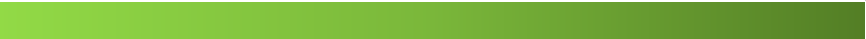

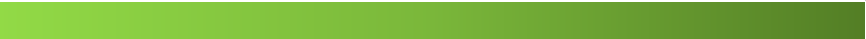

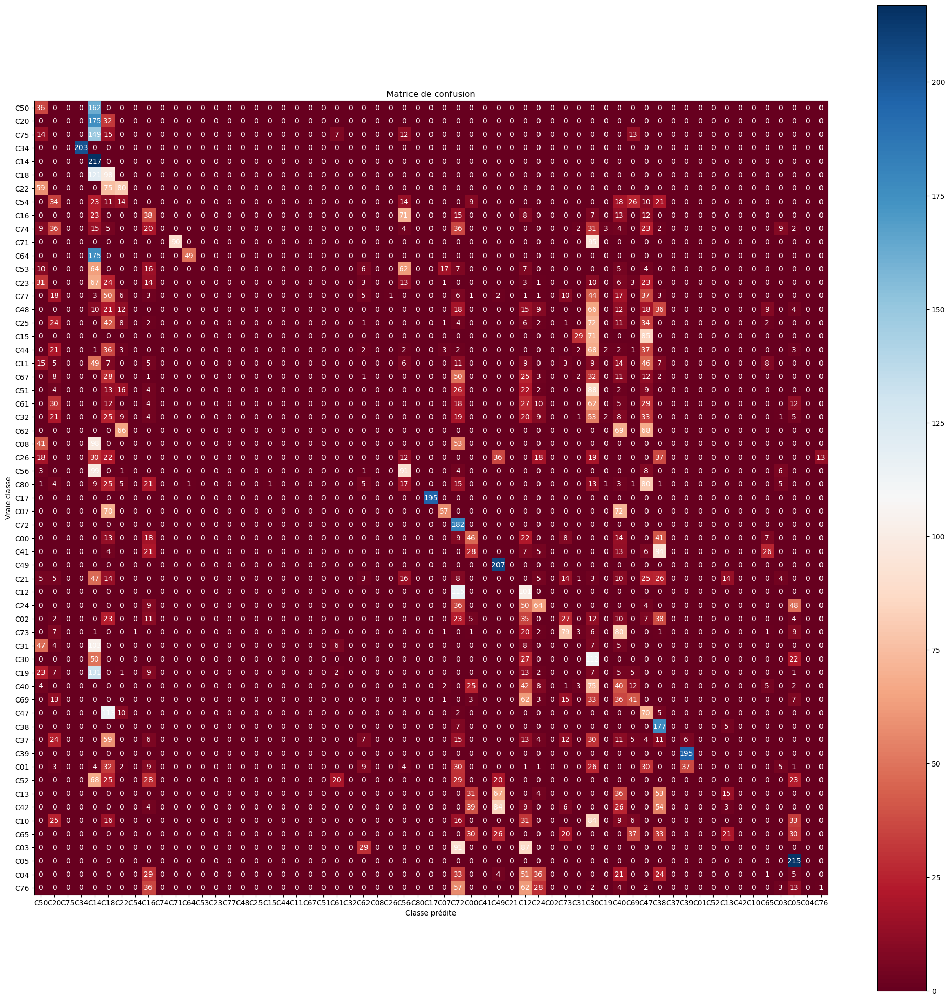

______________________________Train______________________________________
                      ______Naives Bayes______
              precision    recall  f1-score   support

         C50       0.12      0.22      0.16       478
         C20       0.00      0.00      0.00       469
         C75       0.00      0.00      0.00       466
         C34       1.00      1.00      1.00       473
         C14       0.11      1.00      0.20       459
         C18       0.11      0.50      0.18       457
         C22       0.29      0.32      0.31       462
         C54       0.00      0.00      0.00       496
         C16       0.13      0.20      0.16       489
         C74       0.00      0.00      0.00       475
         C71       1.00      0.48      0.65       491
         C64       1.00      0.28      0.44       452
         C53       0.00      0.00      0.00       478
         C23       0.00      0.00      0.00       477
         C77       0.00      0.00      0.00       468
         C48  

In [163]:
plot_confusion_matrix(Y_test, Y_predec_model_6, 'RdBu')  
                        ###########################################
                        ##########_______naive bayes _______#######
                        ###########################################

print("______________________________Train______________________________________")               
print("                      ______Naives Bayes______")            
print(classification_report(Y_train, Y_predec_model_6_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_train, Y_predec_model_6_train))
# Calculer l'exactitude du modèle
accuracy_naive_Bayes = accuracy_score(Y_train, Y_predec_model_6_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_naive_Bayes)
print("______________________________Test______________________________________")               
print("               ______Naives Bayes______")            
print(classification_report(Y_test, Y_predec_model_6, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_test, Y_predec_model_6))
# Calculer l'exactitude du modèle
accuracy_naive_Bayes = accuracy_score(Y_test, Y_predec_model_6)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_naive_Bayes)
accuracy_res_2.append(accuracy_naive_Bayes)

recall_naive_Bayes= recall_score(Y_test, Y_predec_model_6, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_naive_Bayes)
recall_res_2.append(recall_naive_Bayes)

f1_naive_Bayes = f1_score(Y_test, Y_predec_model_6, average='macro')
print("--------------------------------------------------------------------")
print("F1_score:", f1_naive_Bayes)
f1_res_2.append(f1_naive_Bayes)


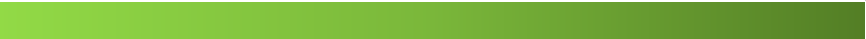

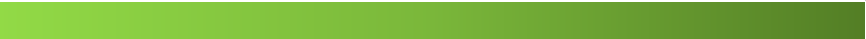

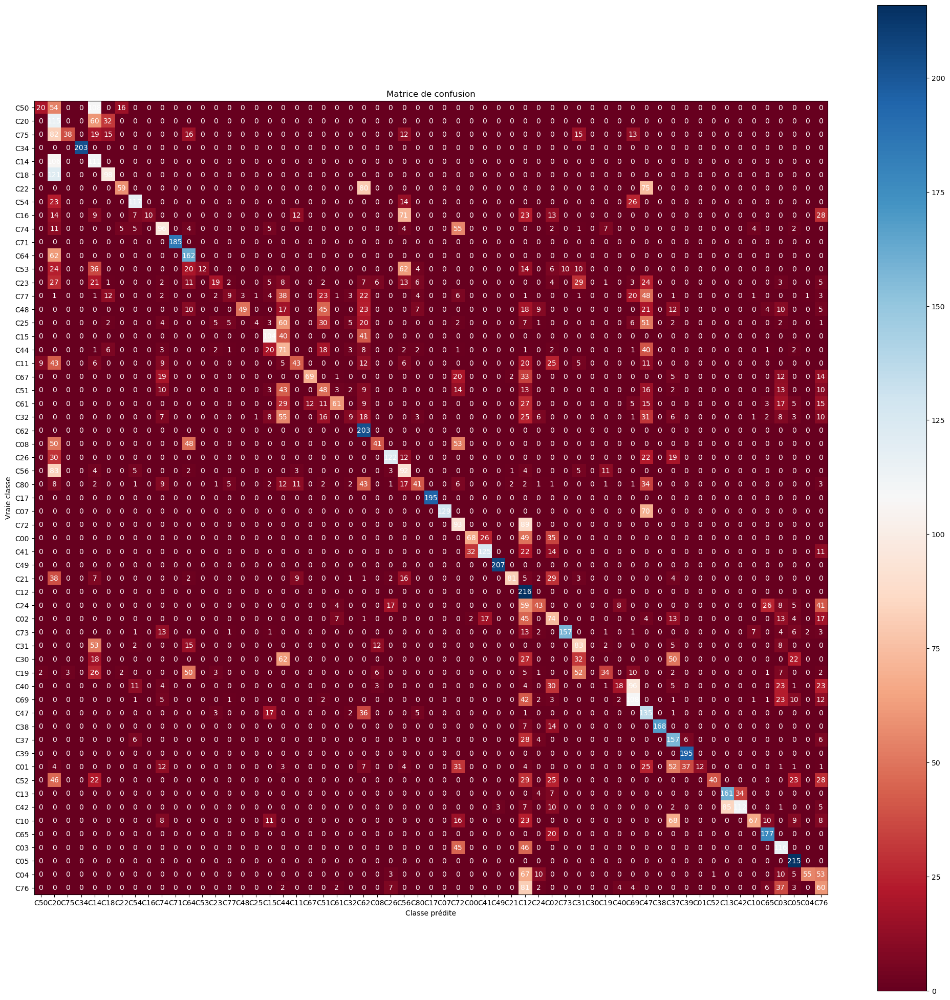

______________________________Train______________________________________
                       ______Bagging______
              precision    recall  f1-score   support

         C50       0.68      0.10      0.17       478
         C20       0.13      0.56      0.21       469
         C75       0.96      0.20      0.33       466
         C34       1.00      1.00      1.00       473
         C14       0.21      0.52      0.30       459
         C18       0.64      0.50      0.56       457
         C22       0.68      0.34      0.46       462
         C54       0.73      0.69      0.71       496
         C16       1.00      0.06      0.12       489
         C74       0.51      0.49      0.50       475
         C71       1.00      1.00      1.00       491
         C64       0.48      0.77      0.59       452
         C53       1.00      0.04      0.07       478
         C23       0.49      0.08      0.14       477
         C77       0.53      0.09      0.16       468
         C48      

In [164]:
                        ###########################################
                        ##########_______Bagging _______#######
                        ###########################################

plot_confusion_matrix(Y_test,Y_predec_bagging, 'RdBu')   
print("______________________________Train______________________________________")               
print("                       ______Bagging______")            
print(classification_report(Y_train, Y_predec_bagging_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_train, Y_predec_bagging_train))
# Calculer l'exactitude du modèle
accuracy_bagging = accuracy_score(Y_train, Y_predec_bagging_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_bagging)
print("______________________________Test______________________________________")               
print("                      ______Bagging______")            
print(classification_report(Y_test, Y_predec_bagging, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_test, Y_predec_bagging))
# Calculer l'exactitude du modèle
accuracy_bagging = accuracy_score(Y_test, Y_predec_bagging)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_bagging)
accuracy_res_2.append(accuracy_bagging)

recall_bagging = recall_score(Y_test, Y_predec_bagging, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_bagging)
recall_res_2.append(recall_bagging)

f1_bagging = f1_score(Y_test, Y_predec_bagging, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_bagging)
f1_res_2.append(f1_bagging)

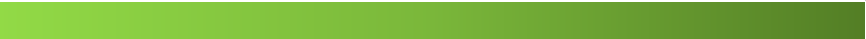

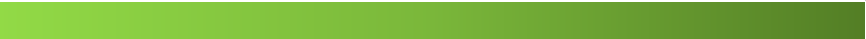

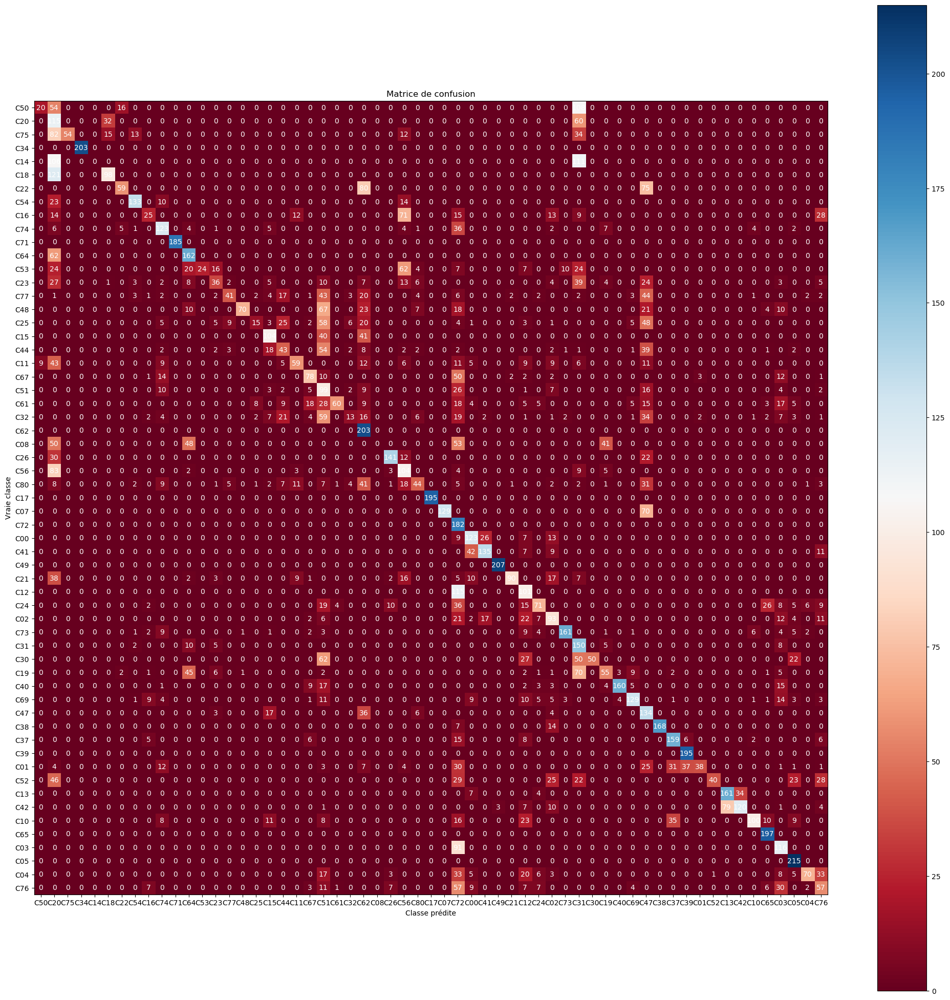

______________________________Train______________________________________
                       ______Boosting______
              precision    recall  f1-score   support

         C50       0.73      0.10      0.18       478
         C20       0.13      0.56      0.21       469
         C75       1.00      0.27      0.43       466
         C34       1.00      1.00      1.00       473
         C14       0.00      0.00      0.00       459
         C18       0.72      0.50      0.59       457
         C22       0.68      0.34      0.46       462
         C54       0.85      0.76      0.81       496
         C16       0.60      0.18      0.27       489
         C74       0.57      0.60      0.59       475
         C71       1.00      1.00      1.00       491
         C64       0.51      0.77      0.62       452
         C53       0.98      0.08      0.15       478
         C23       0.43      0.18      0.25       477
         C77       0.67      0.24      0.35       468
         C48     

In [165]:
                        ###########################################
                        ##########_______Boosting  _______#######
                        ###########################################

plot_confusion_matrix(Y_test,Y_predec_boosting, 'RdBu')   
print("______________________________Train______________________________________")               
print("                       ______Boosting______")            
print(classification_report(Y_train, Y_predec_boosting_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_train, Y_predec_boosting_train))
# Calculer l'exactitude du modèle
accuracy_boosting = accuracy_score(Y_train, Y_predec_boosting_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_boosting)
print("______________________________Test______________________________________")               
print("                      ______Boosting______")            
print(classification_report(Y_test, Y_predec_boosting, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_test, Y_predec_boosting))
# Calculer l'exactitude du modèle
accuracy_boosting = accuracy_score(Y_test, Y_predec_boosting)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_boosting)
accuracy_res_2.append(accuracy_boosting)

recall_boosting = recall_score(Y_test, Y_predec_boosting, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_boosting)
recall_res_2.append(recall_boosting)

f1_boosting = f1_score(Y_test, Y_predec_boosting, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_boosting)
f1_res_2.append(f1_boosting)

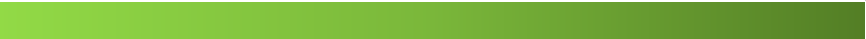

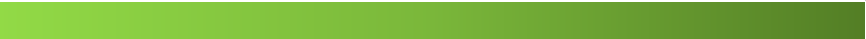

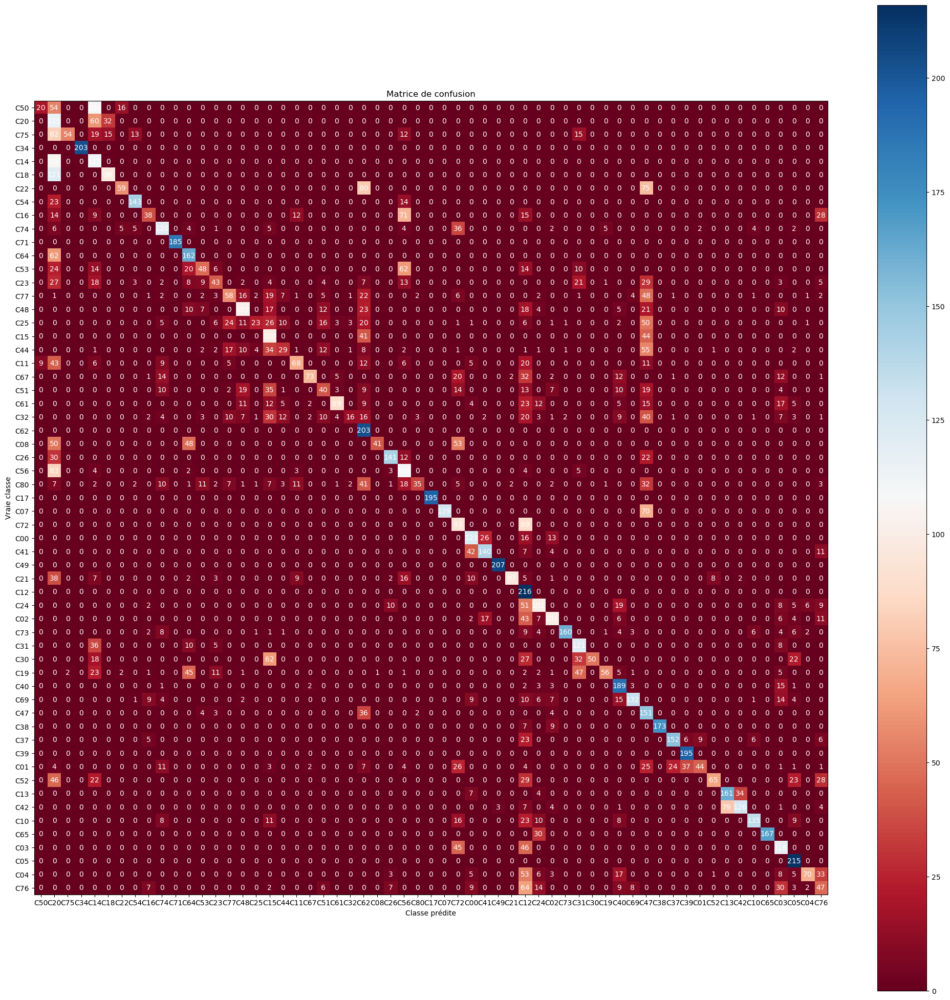

______________________________Train______________________________________
                       ______Voting______
              precision    recall  f1-score   support

         C50       0.73      0.10      0.18       478
         C20       0.13      0.56      0.21       469
         C75       0.98      0.27      0.42       466
         C34       1.00      1.00      1.00       473
         C14       0.23      0.52      0.32       459
         C18       0.74      0.50      0.59       457
         C22       0.68      0.34      0.46       462
         C54       0.86      0.83      0.84       496
         C16       0.67      0.24      0.35       489
         C74       0.61      0.58      0.59       475
         C71       1.00      1.00      1.00       491
         C64       0.51      0.77      0.62       452
         C53       0.51      0.20      0.28       478
         C23       0.48      0.22      0.30       477
         C77       0.53      0.33      0.41       468
         C48       

In [166]:
                        ###########################################
                        ##########_______Voting  _______#######
                        ###########################################

plot_confusion_matrix(Y_test,Y_predec_voting, 'RdBu')   
print("______________________________Train______________________________________")               
print("                       ______Voting______")            
print(classification_report(Y_train, Y_predec_voting_train, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_train, Y_predec_voting_train))
# Calculer l'exactitude du modèle
accuracy_voting = accuracy_score(Y_train, Y_predec_voting_train)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_boosting_all)
print("______________________________Test______________________________________")               
print("                      ______Voting______")            
print(classification_report(Y_test, Y_predec_voting, target_names=codes))
print("--------------------------------------------------------------------")
print(confusion_matrix(Y_test, Y_predec_voting))
# Calculer l'exactitude du modèle
accuracy_voting = accuracy_score(Y_test, Y_predec_voting)
print("--------------------------------------------------------------------")
print("Accuracy:", accuracy_voting)
accuracy_res_2.append(accuracy_voting)

recall_voting = recall_score(Y_test, Y_predec_voting, average='macro')
print("--------------------------------------------------------------------")
print("Recall:", recall_voting)
recall_res_2.append(recall_voting)

f1_voting = f1_score(Y_test, Y_predec_voting, average='macro')
print("--------------------------------------------------------------------")
print("f1:", f1_voting)
f1_res_2.append(f1_voting)

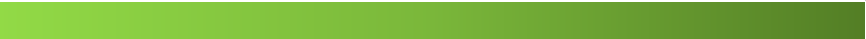

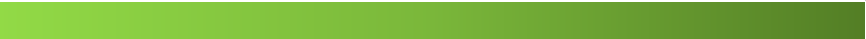

In [167]:
final_result2=pd.DataFrame({'Algorithm':algos,'Accuracy':accuracy_res_2,'Recall':recall_res_2,'F1Score':f1_res_2})

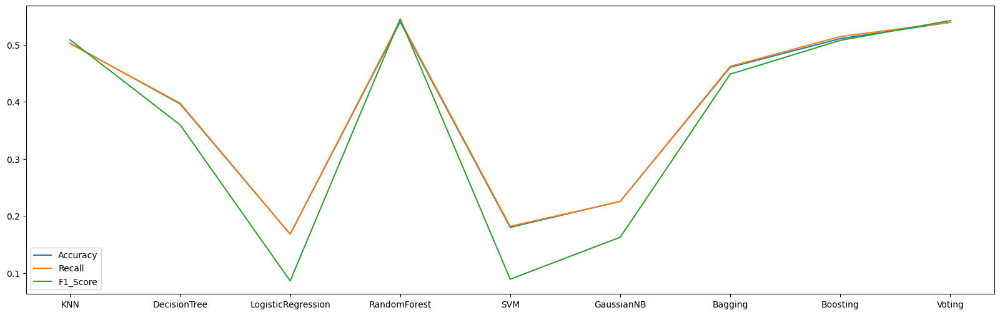

In [168]:
fig,ax=plt.subplots(figsize=(20,6))
plt.plot(final_result2.Algorithm,accuracy_res_2,label='Accuracy')
plt.plot(final_result2.Algorithm,recall_res_2,label='Recall')
plt.plot(final_result2.Algorithm,f1_res_2,label='F1_Score')
plt.legend()
plt.show()

### II. 1 .3. Amélioration / Réglage des hyperparamètres : 
    Pour certains algorithmes de classification, il peut être nécessaire de régler les hyperparamètres afin d'obtenir de meilleures performances. Utilisez des techniques telles que la validation croisée (cross-validation) pour trouver les meilleures valeurs des hyperparamètres.
    ------------------------------------------------------------------------------------------------------------------------

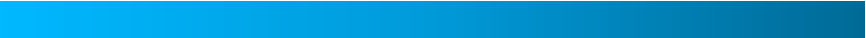

##### pour feature selection 1:
    ------------------------------------------------------------------------------------------------------------------------

In [169]:
from sklearn.model_selection import GridSearchCV
##### a. Using GridSearchCV to find the best hyperparameters for 
#the KNN classifier.Varying the number of neighbors from 1 to 10 and using 5-fold cross-validation. 

param_grid = {'n_neighbors': range(1, 11)}
grid_search = GridSearchCV(model_1_all, param_grid, cv=5)

grid_search.fit(X_all_train, Y_all_train)

print("                     ___KNeighborsClassifier___") 
print("______________________________________________________") 
print("Best hyperparameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

                     ___KNeighborsClassifier___
______________________________________________________
Best hyperparameters:  {'n_neighbors': 3}
Best accuracy score:  0.858227577115753


In [170]:
#### b. Using GridSearchCV to find the best hyperparameters for 
#the Decision Tree classifier. Varying the maximum depth from 1 to 10 and using 5-fold cross_validation.
param_grid = {'max_depth': range(1, 11)}
grid_search = GridSearchCV(model_2_all, param_grid, cv=5)

grid_search.fit(X_all_train, Y_all_train)
print("                     ___DecisionTreeClassifier___") 
print("______________________________________________________")
print("Best hyperparameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

                     ___DecisionTreeClassifier___
______________________________________________________
Best hyperparameters:  {'max_depth': 10}
Best accuracy score:  0.4828074904527508


In [171]:
#### c. Using GridSearchCV to find the best hyperparameters for the Logistic Regression classifier.
#Varying the regularization parameter C from 0.01 to 10 and using 5-fold cross-validation.
param_grid = {'C': [0.01, 0.1, 1, 10]}
grid_search = GridSearchCV(model_3_all, param_grid, cv=5)

grid_search.fit(X_all_train, Y_all_train)
print("                     ___LogisticRegression___")
print("______________________________________________________")
print("Best hyperparameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

                     ___LogisticRegression___
______________________________________________________
Best hyperparameters:  {'C': 0.1}
Best accuracy score:  0.1803141328541874


In [172]:
#### d. Using GridSearchCV to find the best hyperparameters for the Random Forest classifier.
# Varying the number of trees from 50 to 200 and using 5-fold cross-validation. 
param_grid = {'n_estimators': range(50, 201)}
grid_search = GridSearchCV(model_4_all, param_grid, cv=5)

grid_search.fit(X_all_train, Y_all_train)
print("                     ___RandomForestClassifier___")  
print("______________________________________________________")
print("Best parameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

                     ___RandomForestClassifier___
______________________________________________________
Best parameters:  {'n_estimators': 64}
Best accuracy score:  0.8858441597933145


In [173]:
#### e. Using GridSearchCV to find the best hyperparameters for the SVM classifier.
#Varying the regularization parameter C from 0.01 to 10 and using 5-fold cross-validation.
param_grid = {'C': [0.01, 0.1, 1, 10]}
grid_search = GridSearchCV(model_5_all, param_grid, cv=5)

grid_search.fit(X_all_train, Y_all_train)
print("               ___Support Vector Machine (SVM)___") 
print("______________________________________________________")
print("Best parameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

               ___Support Vector Machine (SVM)___
______________________________________________________
Best parameters:  {'C': 0.1}
Best accuracy score:  0.22695080927724204


In [174]:
#### f. Using GridSearchCV to find the best hyperparameters for the Naîve classifier.
#Varying the regularization parameter var_smoothing from 1e-5 to 1e-9 and using 5-fold cross-validation.
param_grid = {'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]}
grid_search = GridSearchCV(model_6_all, param_grid, cv=5)


grid_search.fit(X_all_train, Y_all_train)
print("                     ___Naive Bayes___")
print("______________________________________________________")
print("Best hyperparameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

                     ___Naive Bayes___
______________________________________________________
Best hyperparameters:  {'var_smoothing': 1e-05}
Best accuracy score:  0.23948683760104741


In [175]:
# Utilisation de GridSearchCV pour trouver les meilleurs hyperparamètres pour BaggingClassifier
param_grid_bagging = {'n_estimators': [5, 10, 15, 20]}
grid_search_bagging = GridSearchCV(BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10, random_state=42)),
                                   param_grid_bagging, cv=5)

grid_search_bagging.fit(X_all_train, Y_all_train)

print("                     ___BaggingClassifier___")
print("______________________________________________________")
print("Best hyperparameters: ", grid_search_bagging.best_params_)
print("Best accuracy score: ", grid_search_bagging.best_score_)


                     ___BaggingClassifier___
______________________________________________________
Best hyperparameters:  {'n_estimators': 15}
Best accuracy score:  0.5802702265421995


In [176]:
# Utilisation de GridSearchCV pour trouver les meilleurs hyperparamètres pour AdaBoostClassifier
param_grid_boosting = {'n_estimators': [50, 100, 150, 200]}
grid_search_boosting = GridSearchCV(AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10, random_state=42)),
                                    param_grid_boosting, cv=5)

grid_search_boosting.fit(X_all_train, Y_all_train)

print("                     ___AdaBoostClassifier___")
print("______________________________________________________")
print("Best hyperparameters: ", grid_search_boosting.best_params_)
print("Best accuracy score: ", grid_search_boosting.best_score_)


                     ___AdaBoostClassifier___
______________________________________________________
Best hyperparameters:  {'n_estimators': 200}
Best accuracy score:  0.7660642507673981


In [177]:
# Utilisation de GridSearchCV pour trouver les meilleurs hyperparamètres pour VotingClassifier
param_grid_voting = {'voting': ['hard', 'soft'],
                     'weights': [[1, 1, 1], [1, 2, 2], [2, 1, 2], [2, 2, 1]]}
grid_search_voting = GridSearchCV(VotingClassifier(estimators=[('KNN', model_1_all),
                                                              ('Decision Tree', model_2_all),
                                                              ('Random Forest', model_4_all)]),param_grid_voting, cv=5)

grid_search_voting.fit(X_all_train, Y_all_train)

print("                     ___VotingClassifier___")
print("______________________________________________________")
print("Best hyperparameters: ", grid_search_voting.best_params_)
print("Best accuracy score: ", grid_search_voting.best_score_)


                     ___VotingClassifier___
______________________________________________________
Best hyperparameters:  {'voting': 'soft', 'weights': [1, 2, 2]}
Best accuracy score:  0.884769558581182


##### pour feature selection 2:
    ------------------------------------------------------------------------------------------------------------------------

In [178]:
##### a. Using GridSearchCV to find the best hyperparameters for 
#the KNN classifier.Varying the number of neighbors from 1 to 10 and using 5-fold cross-validation. 
param_grid = {'n_neighbors': range(1, 11)}
grid_search = GridSearchCV(model_1, param_grid, cv=5)

grid_search.fit(X_train, Y_train)

print("                     ___KNeighborsClassifier___") 
print("______________________________________________________") 
print("Best hyperparameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

                     ___KNeighborsClassifier___
______________________________________________________
Best hyperparameters:  {'n_neighbors': 10}
Best accuracy score:  0.5085967904511598


In [179]:
#### b. Using GridSearchCV to find the best hyperparameters for 
#the Decision Tree classifier. Varying the maximum depth from 1 to 10 and using 5-fold cross_validation.
param_grid = {'max_depth': range(1, 11)}
grid_search = GridSearchCV(model_2, param_grid, cv=5)

grid_search.fit(X_train, Y_train)
print("                     ___DecisionTreeClassifier___") 
print("______________________________________________________")
print("Best hyperparameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

                     ___DecisionTreeClassifier___
______________________________________________________
Best hyperparameters:  {'max_depth': 10}
Best accuracy score:  0.4195862888619618


In [180]:
#### c. Using GridSearchCV to find the best hyperparameters for the Logistic Regression classifier.
#Varying the regularization parameter C from 0.01 to 10 and using 5-fold cross-validation.
param_grid = {'C': [0.01, 0.1, 1, 10]}
grid_search = GridSearchCV(model_3, param_grid, cv=5)

grid_search.fit(X_train, Y_train)
print("                     ___LogisticRegression___")
print("______________________________________________________")
print("Best hyperparameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

                     ___LogisticRegression___
______________________________________________________
Best hyperparameters:  {'C': 10}
Best accuracy score:  0.1666300417199778


In [181]:
#### d. Using GridSearchCV to find the best hyperparameters for the Random Forest classifier.
# Varying the number of trees from 50 to 200 and using 5-fold cross-validation. 
param_grid = {'n_estimators': range(50, 201)}
grid_search = GridSearchCV(model_4, param_grid, cv=5)

grid_search.fit(X_train, Y_train)
print("                     ___RandomForestClassifier___")  
print("______________________________________________________")
print("Best parameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

                     ___RandomForestClassifier___
______________________________________________________
Best parameters:  {'n_estimators': 87}
Best accuracy score:  0.5544093125518678


In [182]:
#### e. Using GridSearchCV to find the best hyperparameters for the SVM classifier.
#Varying the regularization parameter C from 0.01 to 10 and using 5-fold cross-validation.
param_grid = {'C': [0.01, 0.1, 1, 10]}
grid_search = GridSearchCV(model_5, param_grid, cv=5)

grid_search.fit(X_train, Y_train)
print("               ___Support Vector Machine (SVM)___") 
print("______________________________________________________")
print("Best parameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

               ___Support Vector Machine (SVM)___
______________________________________________________
Best parameters:  {'C': 0.01}
Best accuracy score:  0.17830772858868021


In [183]:
#### f. Using GridSearchCV to find the best hyperparameters for the Naîve classifier.
#Varying the regularization parameter var_smoothing from 1e-5 to 1e-9 and using 5-fold cross-validation.
param_grid = {'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]}
grid_search = GridSearchCV(model_6, param_grid, cv=5)


grid_search.fit(X_train, Y_train)
print("                     ___Naive Bayes___")
print("______________________________________________________")
print("Best hyperparameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)

                     ___Naive Bayes___
______________________________________________________
Best hyperparameters:  {'var_smoothing': 1e-05}
Best accuracy score:  0.22881277948253675


In [184]:
# Utilisation de GridSearchCV pour trouver les meilleurs hyperparamètres pour BaggingClassifier
param_grid_bagging = {'n_estimators': [5, 10, 15, 20]}
grid_search_bagging = GridSearchCV(BaggingClassifier(base_estimator=DecisionTreeClassifier(max_depth=10, random_state=42)),
                                   param_grid_bagging, cv=5)

grid_search_bagging.fit(X_train, Y_train)

print("                     ___BaggingClassifier___")
print("______________________________________________________")
print("Best hyperparameters: ", grid_search_bagging.best_params_)
print("Best accuracy score: ", grid_search_bagging.best_score_)


                     ___BaggingClassifier___
______________________________________________________
Best hyperparameters:  {'n_estimators': 20}
Best accuracy score:  0.4773981994562906


In [185]:
# Utilisation de GridSearchCV pour trouver les meilleurs hyperparamètres pour AdaBoostClassifier
param_grid_boosting = {'n_estimators': [50, 100, 150, 200]}
grid_search_boosting = GridSearchCV(AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=10, random_state=42)),
                                    param_grid_boosting, cv=5)

grid_search_boosting.fit(X_train, Y_train)

print("                     ___AdaBoostClassifier___")
print("______________________________________________________")
print("Best hyperparameters: ", grid_search_boosting.best_params_)
print("Best accuracy score: ", grid_search_boosting.best_score_)

                     ___AdaBoostClassifier___
______________________________________________________
Best hyperparameters:  {'n_estimators': 50}
Best accuracy score:  0.5333117266035299


In [186]:
# Utilisation de GridSearchCV pour trouver les meilleurs hyperparamètres pour VotingClassifier
param_grid_voting = {'voting': ['hard', 'soft'],
                     'weights': [[1, 1, 1], [1, 2, 2], [2, 1, 2], [2, 2, 1]]}
grid_search_voting = GridSearchCV(VotingClassifier(estimators=[('KNN', model_1),
                                                              ('Decision Tree', model_2),
                                                              ('Random Forest', model_4)]),param_grid_voting, cv=5)

grid_search_voting.fit(X_train, Y_train)

print("                     ___VotingClassifier___")
print("______________________________________________________")
print("Best hyperparameters: ", grid_search_voting.best_params_)
print("Best accuracy score: ", grid_search_voting.best_score_)


                     ___VotingClassifier___
______________________________________________________
Best hyperparameters:  {'voting': 'soft', 'weights': [1, 2, 2]}
Best accuracy score:  0.550970589956104


## II.2. Réseau de neuronnes:
    Maintenant on va utiliser les réseaux de neuronnes pour créer notre modèle et comparer ces performances avec celui obtenu dans l'étape précédente .
    -----------------------------------------------------------------------------------------------------------------------

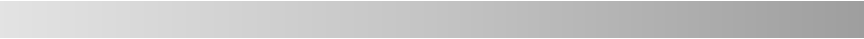

In [187]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Activation
from keras.utils import to_categorical
from keras import metrics

##### Encoder organecode pour les deux séléctiones

In [188]:
label_encoder = LabelEncoder()
# pour feature selection 1
Y_train_encoded_all = label_encoder.fit_transform(Y_all_train)
Y_test_encoded_all = label_encoder.transform(Y_all_test)
# pour feature selection 2
Y_train_encoded = label_encoder.fit_transform(Y_train)
Y_test_encoded = label_encoder.transform(Y_test)


### II. 2 .1. Création et entrainement du modele : 
       On va commencer par la création et l'entrainement du modele.
    ------------------------------------------------------------------------------------------------------------------------

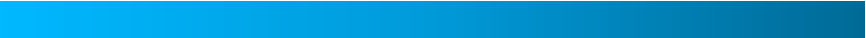

    Cela transformera les noms de classes en valeurs numériques pour l'entraînement du modèle.
    ------------------------------------------------------------------------------------------------------------------------

##### pour feature selection 1:
    ------------------------------------------------------------------------------------------------------------------------

In [189]:
#encoder la variable cible
Y_train_encoded_all_keras = to_categorical(Y_train_encoded_all, num_classes=59)
Y_test_encoded_all_keras = to_categorical(Y_test_encoded_all, num_classes=59)

In [190]:
model_1_neurons = Sequential()
model_1_neurons.add(Dense(256, input_shape=(X_all_train.shape[1],), activation='elu'))
model_1_neurons.add(Dense(128, activation='tanh'))
model_1_neurons.add(Dense(64, activation='tanh'))
model_1_neurons.add(Dense(32, activation='tanh'))
model_1_neurons.add(Dense(16, activation='tanh'))

# Ajouter la couche de sortie
model_1_neurons.add(Dense(59, activation='softmax')) # 59 neurones pour 59 classes, activation softmax pour la classification multiclasse

metrics_list = ['accuracy', metrics.Precision(), metrics.Recall()]
model_1_neurons.compile(loss='categorical_crossentropy', optimizer='adam', metrics=metrics_list)

hist_1=model_1_neurons.fit(X_all_train, Y_train_encoded_all_keras, epochs=100, batch_size=5, verbose=1, validation_data=(X_all_test, Y_test_encoded_all_keras))

Epoch 1/100
5584/5584 [==============================] - 28s 5ms/step - loss: 3.1482 - accuracy: 0.1438 - precision: 0.9438 - recall: 0.0060 - val_loss: 2.7928 - val_accuracy: 0.2021 - val_precision: 0.9686 - val_recall: 0.0155
Epoch 2/100
5584/5584 [==============================] - 24s 4ms/step - loss: 2.6605 - accuracy: 0.2379 - precision: 0.8130 - recall: 0.0385 - val_loss: 2.5274 - val_accuracy: 0.2638 - val_precision: 0.8537 - val_recall: 0.0327
Epoch 3/100
5584/5584 [==============================] - 25s 4ms/step - loss: 2.4511 - accuracy: 0.2802 - precision: 0.8390 - recall: 0.0648 - val_loss: 2.3808 - val_accuracy: 0.3050 - val_precision: 0.8435 - val_recall: 0.0847
Epoch 4/100
5584/5584 [==============================] - 25s 4ms/step - loss: 2.3163 - accuracy: 0.3145 - precision: 0.8172 - recall: 0.0988 - val_loss: 2.3440 - val_accuracy: 0.3153 - val_precision: 0.5873 - val_recall: 0.1102
Epoch 5/100
5584/5584 [==============================] - 26s 5ms/step - loss: 2.2343 - a

Epoch 37/100
5584/5584 [==============================] - 25s 4ms/step - loss: 1.6553 - accuracy: 0.4893 - precision: 0.7533 - recall: 0.3104 - val_loss: 1.6987 - val_accuracy: 0.4566 - val_precision: 0.7511 - val_recall: 0.2907
Epoch 38/100
5584/5584 [==============================] - 23s 4ms/step - loss: 1.6260 - accuracy: 0.4958 - precision: 0.7642 - recall: 0.3102 - val_loss: 1.6665 - val_accuracy: 0.4854 - val_precision: 0.7534 - val_recall: 0.2903
Epoch 39/100
5584/5584 [==============================] - 36s 6ms/step - loss: 1.6257 - accuracy: 0.4902 - precision: 0.7608 - recall: 0.3216 - val_loss: 1.6281 - val_accuracy: 0.4951 - val_precision: 0.7245 - val_recall: 0.3365
Epoch 40/100
5584/5584 [==============================] - 26s 5ms/step - loss: 1.6425 - accuracy: 0.4873 - precision: 0.7560 - recall: 0.3137 - val_loss: 1.6590 - val_accuracy: 0.4722 - val_precision: 0.7778 - val_recall: 0.3030
Epoch 41/100
5584/5584 [==============================] - 23s 4ms/step - loss: 1.619

Epoch 73/100
5584/5584 [==============================] - 20s 4ms/step - loss: 1.5736 - accuracy: 0.5106 - precision: 0.7535 - recall: 0.3458 - val_loss: 2.0077 - val_accuracy: 0.4113 - val_precision: 0.6135 - val_recall: 0.2536
Epoch 74/100
5584/5584 [==============================] - 21s 4ms/step - loss: 1.5671 - accuracy: 0.5084 - precision: 0.7636 - recall: 0.3440 - val_loss: 1.5624 - val_accuracy: 0.4807 - val_precision: 0.7557 - val_recall: 0.3472
Epoch 75/100
5584/5584 [==============================] - 23s 4ms/step - loss: 1.5645 - accuracy: 0.5183 - precision: 0.7585 - recall: 0.3506 - val_loss: 1.5292 - val_accuracy: 0.5277 - val_precision: 0.7837 - val_recall: 0.3579
Epoch 76/100
5584/5584 [==============================] - 21s 4ms/step - loss: 1.5824 - accuracy: 0.5097 - precision: 0.7617 - recall: 0.3489 - val_loss: 1.5624 - val_accuracy: 0.5087 - val_precision: 0.7619 - val_recall: 0.3514
Epoch 77/100
5584/5584 [==============================] - 23s 4ms/step - loss: 1.583

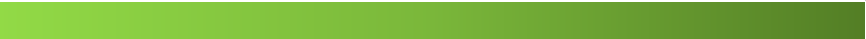

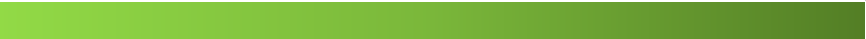

##### Régularisation:
    ------------------------------------------------------------------------------------------------------------------------

In [191]:
from keras.regularizers import l2

# Création de modèle avec régularisation L2
model_l2 = Sequential()
model_l2.add(Dense(256, input_shape=(X_all_train.shape[1],), activation='elu', kernel_regularizer=l2(0.01)))
model_l2.add(Dense(128, activation='tanh', kernel_regularizer=l2(0.01)))
model_l2.add(Dense(64, activation='tanh', kernel_regularizer=l2(0.01)))
model_l2.add(Dense(32, activation='tanh', kernel_regularizer=l2(0.01)))
model_l2.add(Dense(16, activation='tanh', kernel_regularizer=l2(0.01)))
model_l2.add(Dense(59, activation='softmax', kernel_regularizer=l2(0.01)))

# Compiler le modèle
model_l2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=metrics_list)

hist_l2=model_l2.fit(X_all_train, Y_train_encoded_all_keras, epochs=20, batch_size=5, verbose=1, validation_data=(X_all_test, Y_test_encoded_all_keras))


Epoch 1/20
5584/5584 [==============================] - 29s 5ms/step - loss: 3.9259 - accuracy: 0.0738 - precision: 0.7696 - recall: 0.1151 - val_loss: 3.6945 - val_accuracy: 0.0869 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
5584/5584 [==============================] - 25s 4ms/step - loss: 3.6928 - accuracy: 0.0865 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 3.6846 - val_accuracy: 0.0929 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/20
5584/5584 [==============================] - 23s 4ms/step - loss: 3.6668 - accuracy: 0.1043 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 3.6456 - val_accuracy: 0.1001 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/20
5584/5584 [==============================] - 24s 4ms/step - loss: 3.6576 - accuracy: 0.1019 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 3.6406 - val_accuracy: 0.1113 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/20
5584/5584 [==============

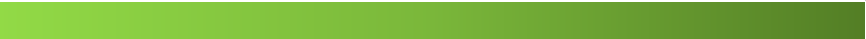

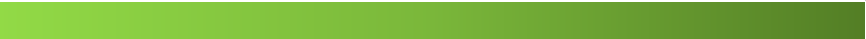

##### pour feature selection 2:
    ------------------------------------------------------------------------------------------------------------------------

In [192]:
#Encoder la varibale cible
Y_train_encoded_keras = to_categorical(Y_train_encoded, num_classes=59)
Y_test_encoded_keras = to_categorical(Y_test_encoded, num_classes=59)

In [193]:
#Création de modèle
model_2_neurons = Sequential()
model_2_neurons.add(Dense(256, input_shape=(X_train.shape[1],), activation='elu'))
model_2_neurons.add(Dense(128, activation='tanh'))
model_2_neurons.add(Dense(64, activation='tanh'))
model_2_neurons.add(Dense(32, activation='tanh'))
model_2_neurons.add(Dense(16, activation='tanh'))

# Ajouter la couche de sortie
model_2_neurons.add(Dense(59, activation='softmax')) # 59 neurones pour 59 classes, activation softmax pour la classification multiclasse

model_2_neurons.compile(loss='categorical_crossentropy', optimizer='adam', metrics=metrics_list)

#Entrainer le modele
hist_2=model_2_neurons.fit(X_train, Y_train_encoded_keras, epochs=100, batch_size=5, verbose=1, validation_data=(X_test, Y_test_encoded_keras))


Epoch 1/100
5584/5584 [==============================] - 27s 4ms/step - loss: 3.2286 - accuracy: 0.1221 - precision: 0.9362 - recall: 0.0044 - val_loss: 2.8855 - val_accuracy: 0.1783 - val_precision: 0.9737 - val_recall: 0.0155
Epoch 2/100
5584/5584 [==============================] - 24s 4ms/step - loss: 2.7589 - accuracy: 0.2064 - precision: 0.8532 - recall: 0.0200 - val_loss: 2.6566 - val_accuracy: 0.2251 - val_precision: 0.8174 - val_recall: 0.0243
Epoch 3/100
5584/5584 [==============================] - 25s 5ms/step - loss: 2.5868 - accuracy: 0.2437 - precision: 0.7749 - recall: 0.0409 - val_loss: 2.5732 - val_accuracy: 0.2653 - val_precision: 0.7080 - val_recall: 0.0338
Epoch 4/100
5584/5584 [==============================] - 25s 5ms/step - loss: 2.4721 - accuracy: 0.2660 - precision: 0.7551 - recall: 0.0546 - val_loss: 2.4783 - val_accuracy: 0.2514 - val_precision: 0.7233 - val_recall: 0.0509
Epoch 5/100
5584/5584 [==============================] - 26s 5ms/step - loss: 2.4085 - a

Epoch 37/100
5584/5584 [==============================] - 29s 5ms/step - loss: 1.9698 - accuracy: 0.3799 - precision: 0.7349 - recall: 0.1916 - val_loss: 1.9898 - val_accuracy: 0.3744 - val_precision: 0.7301 - val_recall: 0.1847
Epoch 38/100
5584/5584 [==============================] - 29s 5ms/step - loss: 1.9818 - accuracy: 0.3733 - precision: 0.7298 - recall: 0.1897 - val_loss: 1.9451 - val_accuracy: 0.3885 - val_precision: 0.7847 - val_recall: 0.1883
Epoch 39/100
5584/5584 [==============================] - 28s 5ms/step - loss: 1.9723 - accuracy: 0.3790 - precision: 0.7317 - recall: 0.1951 - val_loss: 1.9770 - val_accuracy: 0.3684 - val_precision: 0.7037 - val_recall: 0.1802
Epoch 40/100
5584/5584 [==============================] - 29s 5ms/step - loss: 1.9565 - accuracy: 0.3812 - precision: 0.7414 - recall: 0.1966 - val_loss: 2.0181 - val_accuracy: 0.3454 - val_precision: 0.6704 - val_recall: 0.1808
Epoch 41/100
5584/5584 [==============================] - 29s 5ms/step - loss: 1.965

Epoch 73/100
5584/5584 [==============================] - 24s 4ms/step - loss: 1.9327 - accuracy: 0.3842 - precision: 0.7435 - recall: 0.2069 - val_loss: 1.9043 - val_accuracy: 0.3843 - val_precision: 0.7481 - val_recall: 0.2124
Epoch 74/100
5584/5584 [==============================] - 24s 4ms/step - loss: 1.9279 - accuracy: 0.3857 - precision: 0.7410 - recall: 0.2088 - val_loss: 1.9051 - val_accuracy: 0.3931 - val_precision: 0.7240 - val_recall: 0.2170
Epoch 75/100
5584/5584 [==============================] - 23s 4ms/step - loss: 1.9206 - accuracy: 0.3880 - precision: 0.7596 - recall: 0.2075 - val_loss: 1.9374 - val_accuracy: 0.3843 - val_precision: 0.7760 - val_recall: 0.2029
Epoch 76/100
5584/5584 [==============================] - 24s 4ms/step - loss: 1.9276 - accuracy: 0.3862 - precision: 0.7471 - recall: 0.2069 - val_loss: 1.9706 - val_accuracy: 0.3650 - val_precision: 0.7309 - val_recall: 0.1979
Epoch 77/100
5584/5584 [==============================] - 27s 5ms/step - loss: 1.931

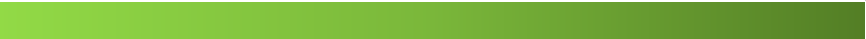

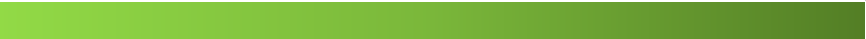

### II. 2 .2. évaluation du modele : 
       On va évaluer les modele obtenus .
    ------------------------------------------------------------------------------------------------------------------------

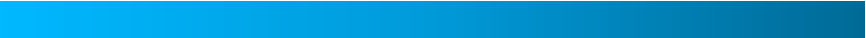

##### pour feature selection 1:
    ------------------------------------------------------------------------------------------------------------------------

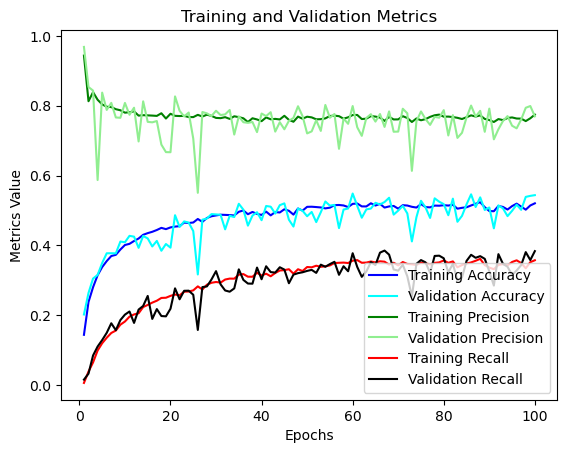

In [194]:
# Récupérer les valeurs des métriques pour les époques d'entraînement
train_accuracy = hist_1.history['accuracy']
train_precision = hist_1.history['precision']
train_recall = hist_1.history['recall']

# Récupérer les valeurs des métriques pour les époques de validation
val_accuracy = hist_1.history['val_accuracy']
val_precision = hist_1.history['val_precision']
val_recall = hist_1.history['val_recall']

# Créer le plot
epochs = range(1, len(train_accuracy) + 1)
plt.plot(epochs, train_accuracy, label='Training Accuracy', color='blue')
plt.plot(epochs, val_accuracy, label='Validation Accuracy', color='cyan')
plt.plot(epochs, train_precision, label='Training Precision', color='green')
plt.plot(epochs, val_precision, label='Validation Precision', color='lightgreen')
plt.plot(epochs, train_recall, label='Training Recall', color='red')
plt.plot(epochs, val_recall, label='Validation Recall', color='black')

plt.title('Training and Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Metrics Value')
plt.legend()
plt.show()


##### Régularisation:
    ------------------------------------------------------------------------------------------------------------------------

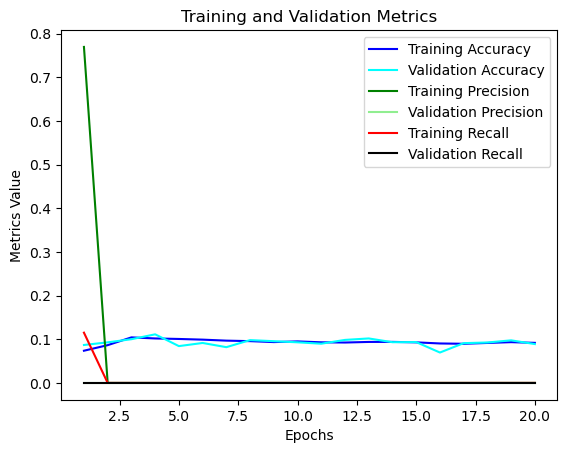

In [195]:
# Récupérer les valeurs des métriques pour les époques d'entraînement
train_accuracy = hist_l2.history['accuracy']
train_precision = hist_l2.history['precision']
train_recall = hist_l2.history['recall']

# Récupérer les valeurs des métriques pour les époques de validation
val_accuracy = hist_l2.history['val_accuracy']
val_precision = hist_l2.history['val_precision']
val_recall = hist_l2.history['val_recall']

# Créer le plot
epochs = range(1, len(train_accuracy) + 1)
plt.plot(epochs, train_accuracy, label='Training Accuracy', color='blue')
plt.plot(epochs, val_accuracy, label='Validation Accuracy', color='cyan')
plt.plot(epochs, train_precision, label='Training Precision', color='green')
plt.plot(epochs, val_precision, label='Validation Precision', color='lightgreen')
plt.plot(epochs, train_recall, label='Training Recall', color='red')
plt.plot(epochs, val_recall, label='Validation Recall', color='black')

plt.title('Training and Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Metrics Value')
plt.legend()
plt.show()

##### pour feature selection 2:
    ------------------------------------------------------------------------------------------------------------------------

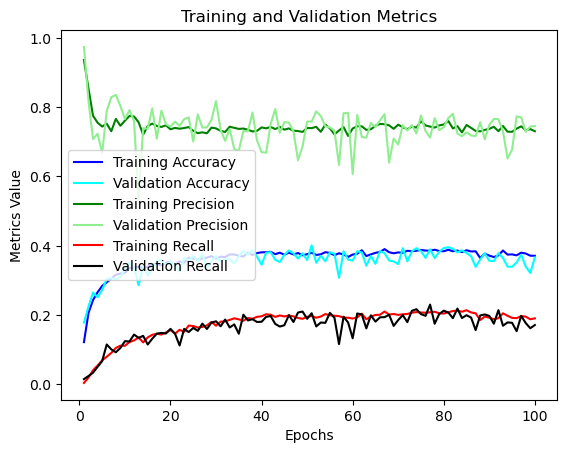

In [196]:
# Récupérer les valeurs des métriques pour les époques d'entraînement
train_accuracy = hist_2.history['accuracy']
train_precision = hist_2.history['precision']
train_recall = hist_2.history['recall']

# Récupérer les valeurs des métriques pour les époques de validation
val_accuracy = hist_2.history['val_accuracy']
val_precision = hist_2.history['val_precision']
val_recall = hist_2.history['val_recall']

# Créer le plot
epochs = range(1, len(train_accuracy) + 1)
plt.plot(epochs, train_accuracy, label='Training Accuracy', color='blue')
plt.plot(epochs, val_accuracy, label='Validation Accuracy', color='cyan')
plt.plot(epochs, train_precision, label='Training Precision', color='green')
plt.plot(epochs, val_precision, label='Validation Precision', color='lightgreen')
plt.plot(epochs, train_recall, label='Training Recall', color='red')
plt.plot(epochs, val_recall, label='Validation Recall', color='black')

plt.title('Training and Validation Metrics')
plt.xlabel('Epochs')
plt.ylabel('Metrics Value')
plt.legend()
plt.show()

## III.Conclusion  :
    Le choix de meilleur modèle.
    -----------------------------------------------------------------------------------------------------------------------

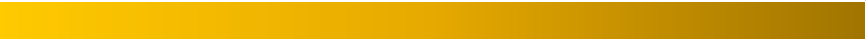

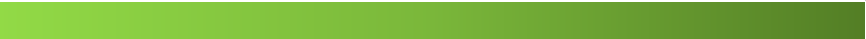

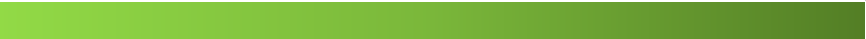

## VI.Deploiment  :
    Après avoir choisit notre modèle, on va deploiyer les résultats dans une interface utilisateur par Streamlit dans laquelle l'utilisateur peut voir son diagnostic .
    -----------------------------------------------------------------------------------------------------------------------

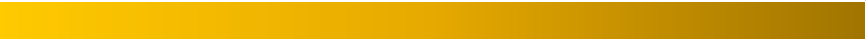

In [197]:
import joblib
# Save the model
joblib.dump(model_4_all, 'Streamlit_Application/Random_Forest.joblib')

['Streamlit_Application/Random_Forest.joblib']

    ------------------------------------------------------------------------------------------------------------------------
    saisir dans le terminal de fichier Interface.py cette commande pour installer les dépendances nécessaires:
 #####                                                              pip install -r requirements.txt
  

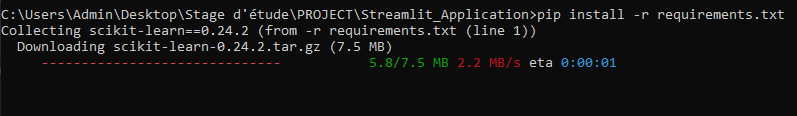

               
    Après dans le même répértoire qui contient le fichier Interface.py et taper la commande
 #####                                                             streamlit run Interface.py
     Après vous trouvez votre interface dans http://localhost:8501/
    ------------------------------------------------------------------------------------------------------------------------

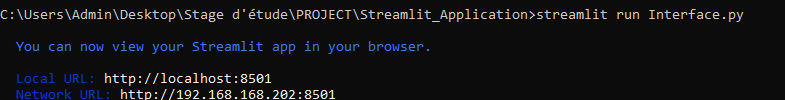

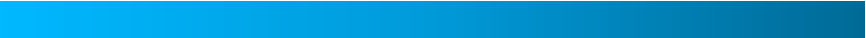